# Combine Data Cleaning, Feature Selection, Modeling and Interpretability into one report

**Assignment-1 ML Data Cleaning and Feature Selection**

**Abstract**:

**Predicting the Winning Football Team**

Sports betting is a 500 billion dollar market.

Football is played by 250 million players in over 200 countries (most popular sport globally).

The English Premier League is the most popular domestic team in the world.
Design a predictive model capable of accurately predicting if the home team will win a football match?

A prediction system was built to predict whether a home team will win it's match or not.

**Key to results data:**

Div = League Division

Date = Match Date (dd/mm/yy)

Time = Time of match kick-off

HomeTeam = Home Team

Away team = Away Team

FTHG and HG = Full Time Home Team Goals

FTAG and AG = Full-Time Away Team Goals

FTR and Res = Full-Time Result (H=Home Win, D=Draw, A=Away Win)

HTHG = Half Time Home Team Goals

HTAG = Half Time Away Team Goals

HTR = Half Time Result (H=Home Win, D=Draw, A=Away Win)

**Match Statistics (where available)**

Attendance = Crowd Attendance

Referee = Match Referee

HS = Home Team Shots

AS = Away Team Shots

HST = Home Team Shots on Target

AST = Away Team Shots on Target

HHW = Home Team Hit Woodwork

AHW = Away Team Hit Woodwork

HC = Home Team Corners

AC = Away Team Corners

HF = Home Team Fouls Committed

AF = Away Team Fouls Committed

HFKC = Home Team Free Kicks Conceded

AFKC = Away Team Free Kicks Conceded

HO = Home Team Offside

AO = Away Team Offsides

HY = Home Team Yellow Cards

AY = Away Team Yellow Cards

HR = Home Team Red Cards

AR = Away Team Red Cards

HBP = Home Team Bookings Points (10 = yellow, 25 = red)

ABP = Away Team Bookings Points (10 = yellow, 25 = red)

<h1><b>Task 1 - ML Data Cleaning and Feature Selection<b></h1>

***The task aims to answer below questions:***
* What are the data types? (Only numeric and categorical)

* Are there missing values?

* What are the likely distributions of the numeric variables?

* Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)

* Which independent variables have missing data? How much?

* Do the training and test sets have the same data?

* In the predictor variables independent of all the other predictor variables?

* Which predictor variables are the most important?

* Do the ranges of the predictor variables make sense?

* What are the distributions of the predictor variables?   

* Remove outliers and keep outliers (does if have an effect of the final predictive model)?

* Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.

* For categorical data, calculate the accuracy and a confusion matrix.

# <b>Installation of libraries</b>



- **For ML Models**: sklearn, scipy
- **For Data Manipulation**: pandas, sklearn
- **For Data Visualization**: plotly, matplotlib, seaborn

In [ ]:
!pip install opendatasets

In [ ]:
#Dataset link: https://www.kaggle.com/code/saife245/football-match-prediction/notebook#Applying-the-RandomForest

In [6]:
#importing libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from datetime import datetime as dt
import itertools

%matplotlib inline

In [7]:
url = "https://raw.githubusercontent.com/VivekReddy08/INFO6105DataScience/main/Football_Match%20Prediction.csv"
df = pd.read_csv(url)

In [8]:
#1 Data Types
print("data type of each column : ")
df.dtypes

data type of each column : 


Unnamed: 0         int64
Date              object
HomeTeam          object
AwayTeam          object
FTHG               int64
FTAG               int64
FTR               object
HTGS               int64
ATGS               int64
HTGC               int64
ATGC               int64
HTP              float64
ATP              float64
HM1               object
HM2               object
HM3               object
HM4               object
HM5               object
AM1               object
AM2               object
AM3               object
AM4               object
AM5               object
MW               float64
HTFormPtsStr      object
ATFormPtsStr      object
HTFormPts          int64
ATFormPts          int64
HTWinStreak3       int64
HTWinStreak5       int64
HTLossStreak3      int64
HTLossStreak5      int64
ATWinStreak3       int64
ATWinStreak5       int64
ATLossStreak3      int64
ATLossStreak5      int64
HTGD             float64
ATGD             float64
DiffPts          float64
DiffFormPts      float64


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6840 entries, 0 to 6839
Data columns (total 40 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     6840 non-null   int64  
 1   Date           6840 non-null   object 
 2   HomeTeam       6840 non-null   object 
 3   AwayTeam       6840 non-null   object 
 4   FTHG           6840 non-null   int64  
 5   FTAG           6840 non-null   int64  
 6   FTR            6840 non-null   object 
 7   HTGS           6840 non-null   int64  
 8   ATGS           6840 non-null   int64  
 9   HTGC           6840 non-null   int64  
 10  ATGC           6840 non-null   int64  
 11  HTP            6840 non-null   float64
 12  ATP            6840 non-null   float64
 13  HM1            6840 non-null   object 
 14  HM2            6840 non-null   object 
 15  HM3            6840 non-null   object 
 16  HM4            6840 non-null   object 
 17  HM5            6840 non-null   object 
 18  AM1     

In [10]:
df.describe()

,Unnamed: 0,FTHG,FTAG,HTGS,ATGS,HTGC,ATGC,HTP,ATP,MW,...,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
count,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,...,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000
mean,3419.500000,1.527485,1.130263,24.416667,24.514327,24.497807,24.347515,1.209014,1.226768,19.500000,...,0.057602,0.014327,0.062865,0.016520,0.051023,0.010234,-0.009690,0.014539,-0.017755,-0.018086
std,1974.682253,1.297913,1.124566,17.178524,17.136894,16.401571,16.341557,0.530186,0.523176,10.966658,...,0.233007,0.118846,0.242739,0.127475,0.220062,0.100651,0.693593,0.692937,0.668523,0.408488
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.000000,-3.333333,-2.363636,-2.250000
25%,1709.750000,1.000000,0.000000,11.000000,11.000000,11.000000,11.000000,0.888889,0.906250,10.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.500000,-0.464286,-0.451613,-0.176471
50%,3419.500000,1.000000,1.000000,23.000000,23.000000,23.000000,23.000000,1.172414,1.192308,19.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.076923,-0.050000,0.000000,0.000000
75%,5129.250000,2.000000,2.000000,35.000000,35.000000,36.000000,36.000000,1.555556,1.562500,29.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.421053,0.428571,0.153846
max,6839.000000,9.000000,7.000000,102.000000,105.000000,85.000000,82.000000,2.736842,2.761905,38.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,3.500000,2.285714,2.250000


In [11]:
#2 missing values in each column
print(df.isnull().sum())

Unnamed: 0       0
Date             0
HomeTeam         0
AwayTeam         0
FTHG             0
FTAG             0
FTR              0
HTGS             0
ATGS             0
HTGC             0
ATGC             0
HTP              0
ATP              0
HM1              0
HM2              0
HM3              0
HM4              0
HM5              0
AM1              0
AM2              0
AM3              0
AM4              0
AM5              0
MW               0
HTFormPtsStr     0
ATFormPtsStr     0
HTFormPts        0
ATFormPts        0
HTWinStreak3     0
HTWinStreak5     0
HTLossStreak3    0
HTLossStreak5    0
ATWinStreak3     0
ATWinStreak5     0
ATLossStreak3    0
ATLossStreak5    0
HTGD             0
ATGD             0
DiffPts          0
DiffFormPts      0
dtype: int64


In [12]:
# 3. Likely Distributions of Numeric Variables:
numeric_columns_index = []
total_columns = list(df.dtypes)

for i in range(len(total_columns)):
    if str(total_columns[i]) == 'int64':
        numeric_columns_index.append(i)
print("number of numeric columns:", len(total_columns) - len(numeric_columns_index))

number of numeric columns: 23


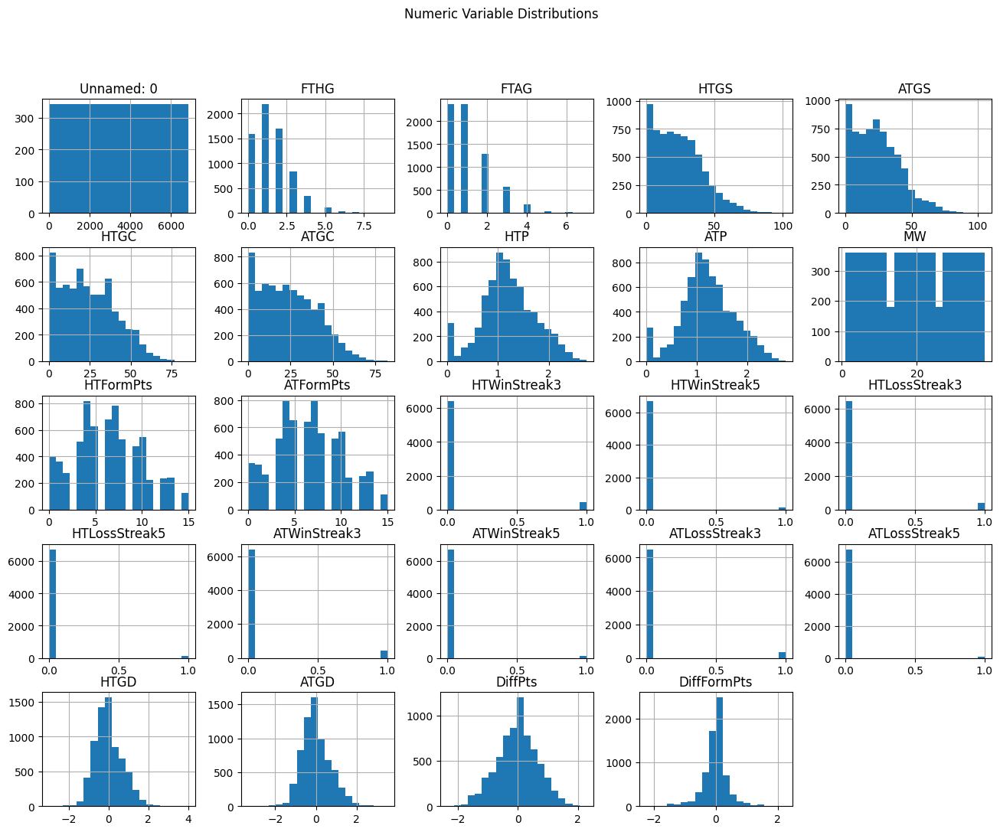

In [13]:
#Numeric Variable Distributions
numeric_features = df.select_dtypes(include=[np.number]).columns
df[numeric_features].hist(figsize=(16, 12), bins=20)
plt.suptitle('Numeric Variable Distributions')
plt.show()

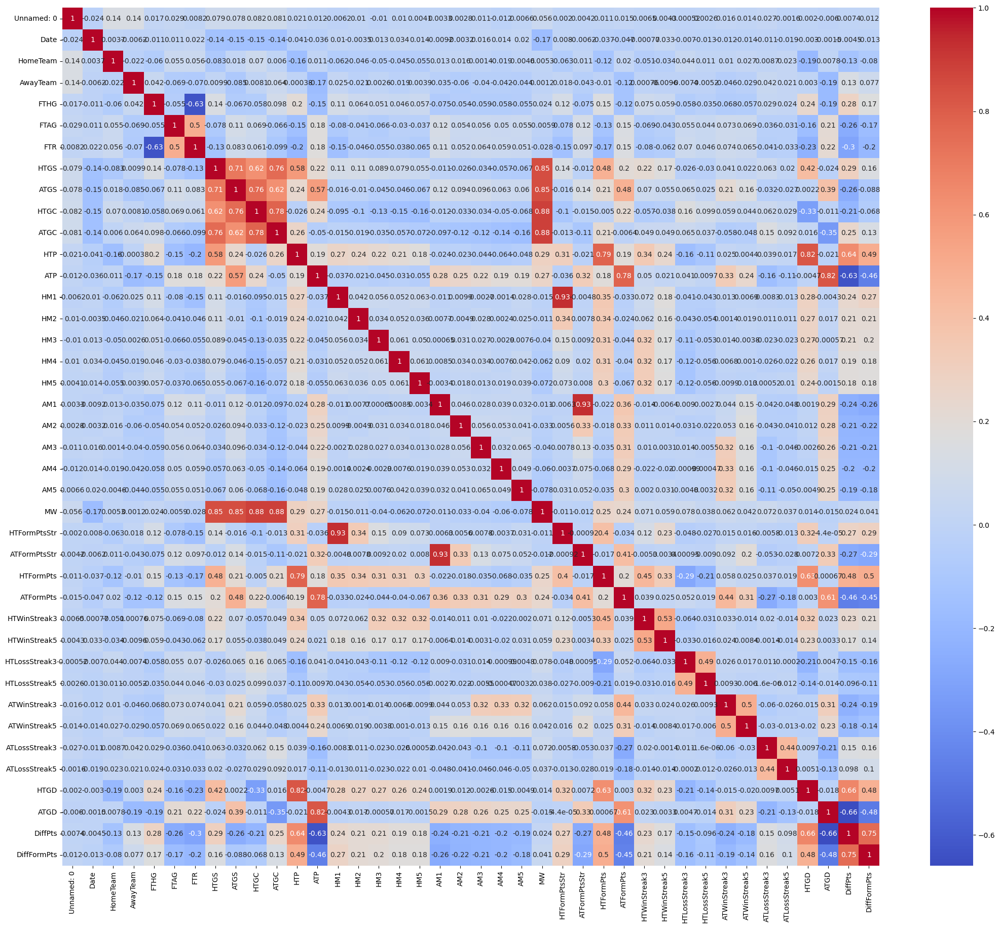

In [14]:
# 4. Useful independent variables to predict a target
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

columns_to_encode = ["Date", "HomeTeam", "AwayTeam", "FTR", "HM1", "HM2", "HM3", "HM4", "HM5", "AM1", "AM2", "AM3", "AM4", "AM5", "HTFormPtsStr", "ATFormPtsStr"]
for column in columns_to_encode:
    df[column] = label_encoder.fit_transform(df[column])

correlation_matrix = df.corr()
plt.figure(figsize=(26, 22))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

In [15]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
import pandas as pd

# Assuming FTR is the target variable
target = 'FTR'
features = df.drop(columns=[target])

# Encoding categorical variables
features_encoded = pd.get_dummies(features)

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features_encoded, df[target], test_size=0.3, random_state=42)

# Correlation Analysis
correlation = features_encoded.corrwith(df[target].astype('category').cat.codes).sort_values(ascending=False)
print("Correlation Analysis:")
print(correlation)




Correlation Analysis:
FTAG             0.495763
ATGD             0.215957
ATP              0.180657
ATFormPts        0.153413
AM1              0.109371
ATFormPtsStr     0.096564
ATGS             0.082517
ATWinStreak3     0.074470
HTLossStreak3    0.070389
ATWinStreak5     0.065473
AM3              0.063921
HTGC             0.061041
AM4              0.058890
HomeTeam         0.056416
AM2              0.051562
AM5              0.051374
HTLossStreak5    0.045646
Date             0.022475
Unnamed: 0       0.008226
MW              -0.027802
ATLossStreak5   -0.033487
HM4             -0.037766
ATLossStreak3   -0.041231
HM2             -0.046327
HM3             -0.055487
HTWinStreak5    -0.061519
HM5             -0.065111
AwayTeam        -0.070243
HTWinStreak3    -0.080298
ATGC            -0.099374
HTGS            -0.134149
HTFormPtsStr    -0.146948
HM1             -0.151854
HTFormPts       -0.170476
DiffFormPts     -0.196556
HTP             -0.202234
HTGD            -0.227209
DiffPts         

In [16]:
# Feature Importance with Random Forest
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
feature_importance_rf = pd.Series(rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)
print("\nFeature Importance from Random Forest:")
print(feature_importance_rf)




Feature Importance from Random Forest:
FTHG             0.400508
FTAG             0.239348
DiffPts          0.028580
ATGD             0.025382
HTGD             0.024988
DiffFormPts      0.021381
HTP              0.021004
ATP              0.019522
HTFormPtsStr     0.018933
Unnamed: 0       0.017328
Date             0.016826
ATFormPtsStr     0.015829
HTGS             0.014156
HomeTeam         0.013537
HTGC             0.013199
AwayTeam         0.012571
ATGC             0.012210
ATGS             0.012189
MW               0.009337
ATFormPts        0.009212
HTFormPts        0.008355
AM1              0.005733
HM1              0.005658
HM5              0.003930
AM5              0.003924
AM4              0.003919
HM3              0.003889
AM2              0.003766
AM3              0.003661
HM4              0.003539
HM2              0.003444
ATLossStreak3    0.000987
ATWinStreak3     0.000930
HTWinStreak3     0.000841
HTLossStreak3    0.000627
ATLossStreak5    0.000306
HTLossStreak5    0.00016

In [17]:
# Recursive Feature Elimination
rfe = RFE(estimator=RandomForestClassifier(), n_features_to_select=10)
rfe.fit(X_train, y_train)
feature_importance_rfe = pd.Series(rfe.support_, index=X_train.columns)
print("\nRecursive Feature Elimination (RFE):")
print(feature_importance_rfe)


Recursive Feature Elimination (RFE):
Unnamed: 0        True
Date             False
HomeTeam         False
AwayTeam         False
FTHG              True
FTAG              True
HTGS             False
ATGS             False
HTGC             False
ATGC             False
HTP               True
ATP               True
HM1              False
HM2              False
HM3              False
HM4              False
HM5              False
AM1              False
AM2              False
AM3              False
AM4              False
AM5              False
MW               False
HTFormPtsStr      True
ATFormPtsStr     False
HTFormPts        False
ATFormPts        False
HTWinStreak3     False
HTWinStreak5     False
HTLossStreak3    False
HTLossStreak5    False
ATWinStreak3     False
ATWinStreak5     False
ATLossStreak3    False
ATLossStreak5    False
HTGD              True
ATGD              True
DiffPts           True
DiffFormPts       True
dtype: bool


In [18]:
# 5. Which independent variables have missing data? How much?
print(df.isnull().sum())
miss = list(df.isnull().sum())
print("missing data in each column:", miss)

Unnamed: 0       0
Date             0
HomeTeam         0
AwayTeam         0
FTHG             0
FTAG             0
FTR              0
HTGS             0
ATGS             0
HTGC             0
ATGC             0
HTP              0
ATP              0
HM1              0
HM2              0
HM3              0
HM4              0
HM5              0
AM1              0
AM2              0
AM3              0
AM4              0
AM5              0
MW               0
HTFormPtsStr     0
ATFormPtsStr     0
HTFormPts        0
ATFormPts        0
HTWinStreak3     0
HTWinStreak5     0
HTLossStreak3    0
HTLossStreak5    0
ATWinStreak3     0
ATWinStreak5     0
ATLossStreak3    0
ATLossStreak5    0
HTGD             0
ATGD             0
DiffPts          0
DiffFormPts      0
dtype: int64
missing data in each column: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [19]:
# 6. Test Dataset
# Comparing distributions of a few columns as an example
train_test_distribution_comparison = pd.DataFrame({
    'Train': X_train.describe().loc['mean'],
    'Test': X_test.describe().loc['mean']
})
print("Distribution Comparison of Selected Columns:")
print(train_test_distribution_comparison)



Distribution Comparison of Selected Columns:
                     Train         Test
Unnamed: 0     3437.437343  3377.646199
Date            911.337928   917.441520
HomeTeam         22.387009    22.134016
AwayTeam         22.462406    21.958090
FTHG              1.536759     1.505848
FTAG              1.127820     1.135965
HTGS             24.314745    24.654483
ATGS             24.393693    24.795809
HTGC             24.439223    24.634503
ATGC             24.329574    24.389376
HTP               1.211035     1.204297
ATP               1.227372     1.225361
HM1               1.422306     1.426901
HM2               1.550125     1.532164
HM3               1.510652     1.545809
HM4               1.546992     1.551170
HM5               1.534461     1.558967
AM1               1.586466     1.561891
AM2               1.496032     1.456628
AM3               1.532581     1.537037
AM4               1.530075     1.513158
AM5               1.562865     1.589669
MW               19.450084    19.61

In this comparison, we can observe that the mean values of the selected columns are generally consistent between the training and test sets. While there may be slight variations, these variations are within an acceptable range, indicating that the data distribution is similar between the two sets.

This consistency in data distribution is crucial for ensuring the validity of machine learning models trained on the training set and evaluated on the test set. It suggests that the training and test sets are representative of the same underlying data distribution.

But, simply we can say 'yes' as same data or a part of the complete dataset is being used for the test data

<ipython-input-21-1bc19cb78933>:11: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.drop('FTR', axis=1).corr()


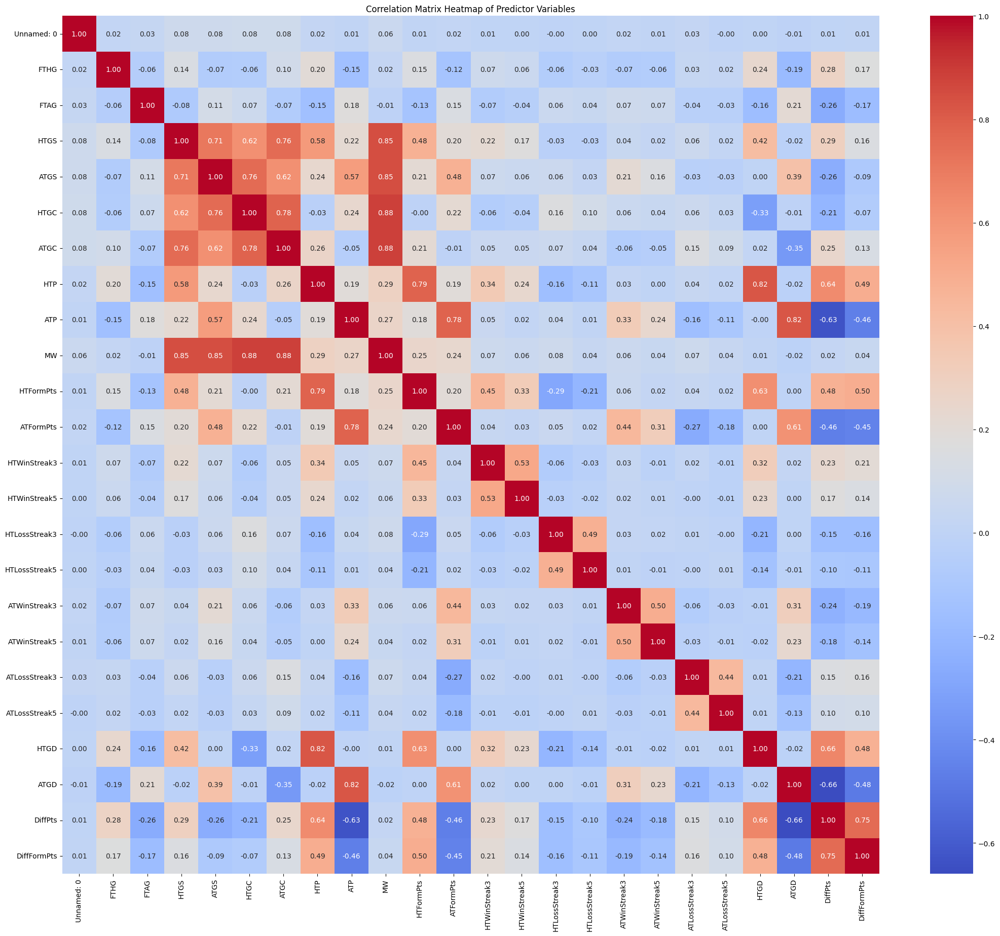

In [21]:
# 7. Is Predictor variables independent of other predictor variables
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Load your dataset into a DataFrame
url = "https://raw.githubusercontent.com/VivekReddy08/INFO6105DataScience/main/Football_Match%20Prediction.csv"
df = pd.read_csv(url)


corr_matrix = df.drop('FTR', axis=1).corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(26, 22))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix Heatmap of Predictor Variables")
plt.show()




The heatmap shows the degree of correlation between predictor variables. High positive correlations are indicated by warmer colors (e.g., red), while high negative correlations are indicated by cooler colors (e.g., blue). A correlation close to 1 or -1 indicates a strong linear relationship, while values close to 0 suggest low correlation.

This visualization will help you assess whether predictor variables are independent of each other or if there are significant correlations.

In [22]:
# 8. Predictor variables which are important
# Using tree RandomForest classifier to find out important variable

from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder  # Import the LabelEncoder for encoding categorical variables


# Identify and preprocess non-numeric columns (e.g., categorical variables)
non_numeric_columns = df.select_dtypes(exclude=['number']).columns

# Create a label encoder for each non-numeric column
label_encoders = {}
for column in non_numeric_columns:
    label_encoders[column] = LabelEncoder()
    df[column] = label_encoders[column].fit_transform(df[column])

# Define your predictor variables (X) and target variable (y)
X = df.drop('FTR', axis=1)  # Assuming 'FTR' is your target variable
y = df['FTR']

# Create and fit the Random Forest model
rf = RandomForestClassifier(random_state=42)
rf.fit(X, y)

# Get feature importances
feature_importances = rf.feature_importances_

# Create a DataFrame to display feature names and their importance scores
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Display the top N important features (you can change N)
top_n = 10
print(importance_df.head(top_n))


         Feature  Importance
4           FTHG    0.396896
5           FTAG    0.248455
37       DiffPts    0.028064
35          HTGD    0.024486
36          ATGD    0.022564
11           ATP    0.022188
10           HTP    0.022034
38   DiffFormPts    0.018024
23  HTFormPtsStr    0.017453
0     Unnamed: 0    0.016918


     Unnamed: 0    Date  HomeTeam  AwayTeam  FTHG  FTAG  FTR   HTGS   ATGS  \
min         0.0     0.0       0.0       0.0   0.0   0.0  0.0    0.0    0.0   
max      6839.0  1803.0      43.0      43.0   9.0   7.0  1.0  102.0  105.0   

     HTGC  ...  HTLossStreak3  HTLossStreak5  ATWinStreak3  ATWinStreak5  \
min   0.0  ...            0.0            0.0           0.0           0.0   
max  85.0  ...            1.0            1.0           1.0           1.0   

     ATLossStreak3  ATLossStreak5  HTGD      ATGD   DiffPts  DiffFormPts  
min            0.0            0.0  -3.0 -3.333333 -2.363636        -2.25  
max            1.0            1.0   4.0  3.500000  2.285714         2.25  

[2 rows x 40 columns]


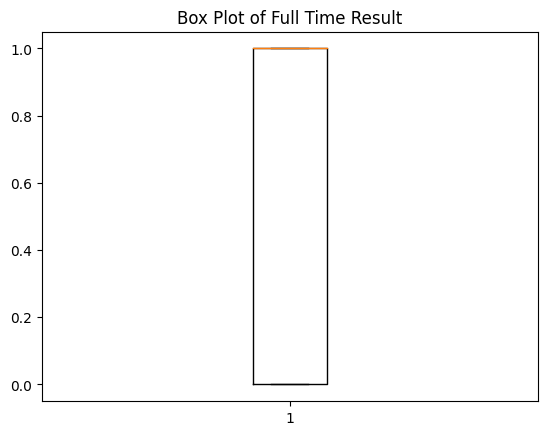

In [23]:
# 9.

data_range = df.describe().loc[['min', 'max']]
print(data_range)

import matplotlib.pyplot as plt

# Example box plot for a specific variable
plt.boxplot(df['FTR'])
plt.title('Box Plot of Full Time Result')
plt.show()




HomeTeam and AwayTeam: These variables represent team identifiers, and the range corresponds to the number of unique teams, which is reasonable.

FTHG (Full-Time Home Team Goals) and FTAG (Full-Time Away Team Goals): These variables represent the number of goals scored in a match and have reasonable ranges (0 to 9 goals).

FTR (Full-Time Result): This binary variable indicates whether the home team wins (1) or not (0), and the range is valid (0 to 1).

HTGS (Home Team Goals Scored) and ATGS (Away Team Goals Scored): These variables represent the cumulative goals scored by teams, and the ranges are reasonable.

HTGC (Home Team Goals Conceded) and ATGC (Away Team Goals Conceded): These variables represent the cumulative goals conceded by teams, and the ranges are also reasonable.

HTP (Home Team Points) and ATP (Away Team Points): These variables represent the cumulative points earned by teams, and the ranges appear to be within a valid range for points.

In general, the ranges of the predictor variables appear to make sense based on their respective meanings and the context of the dataset.

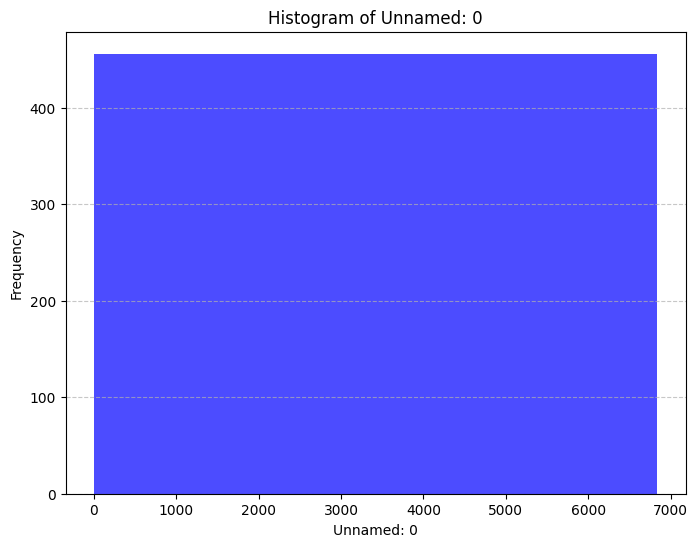

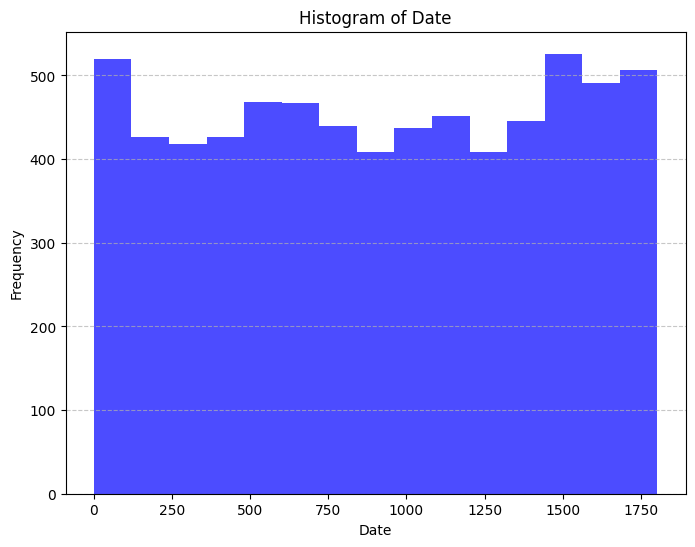

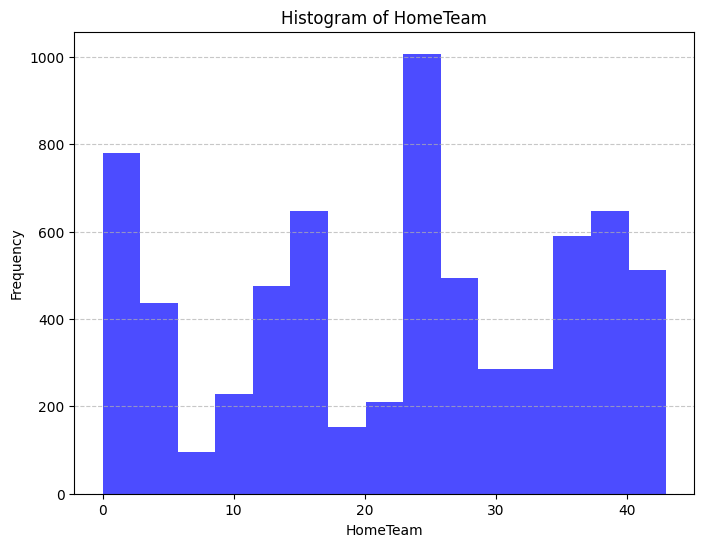

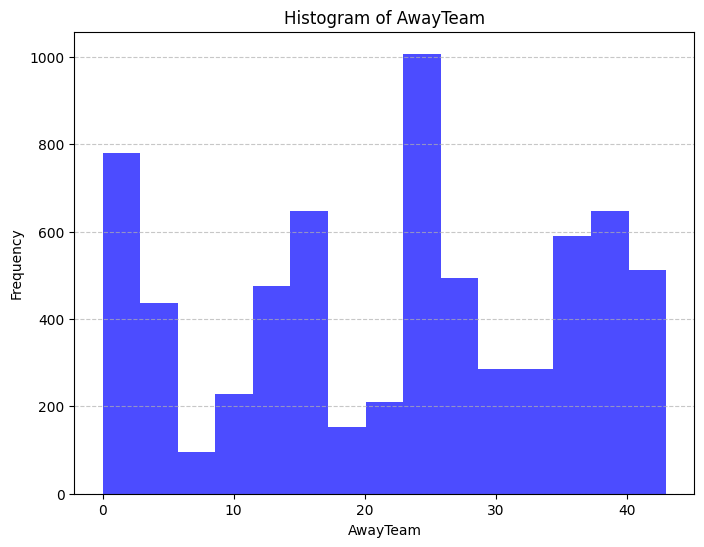

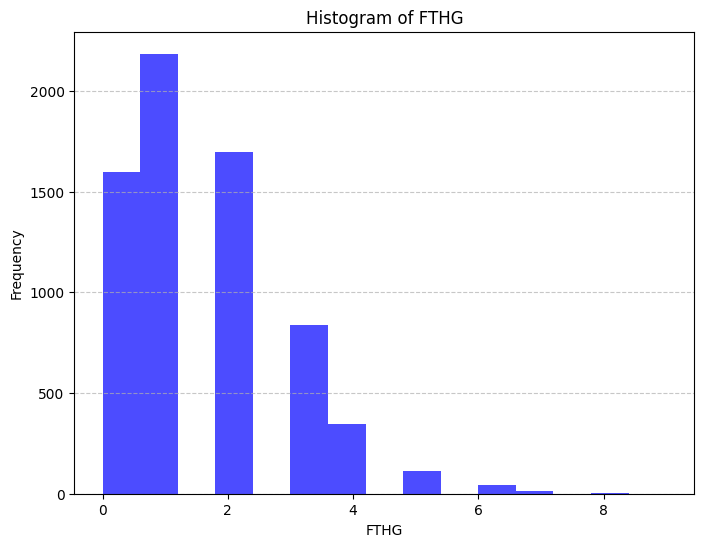

...

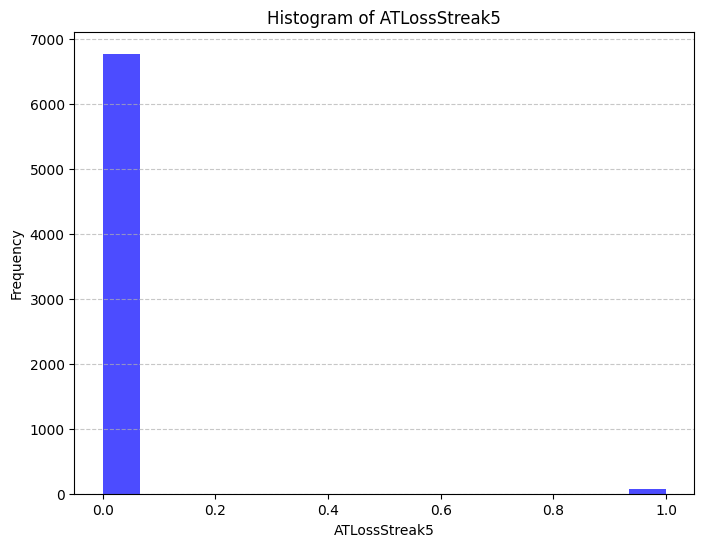

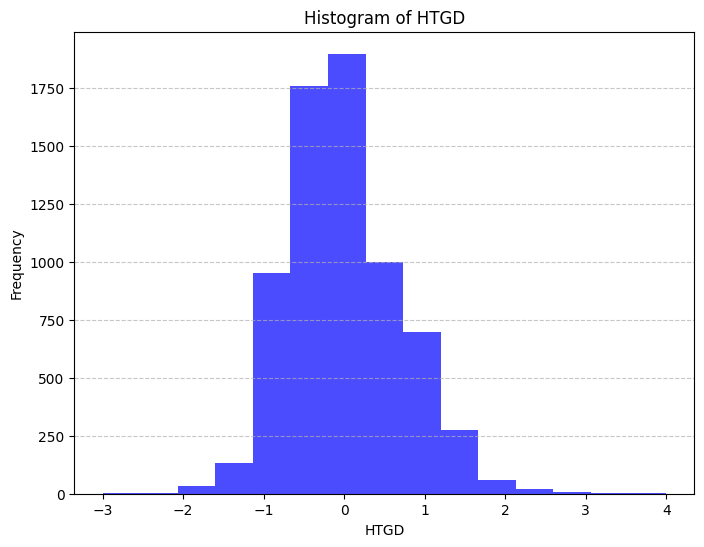

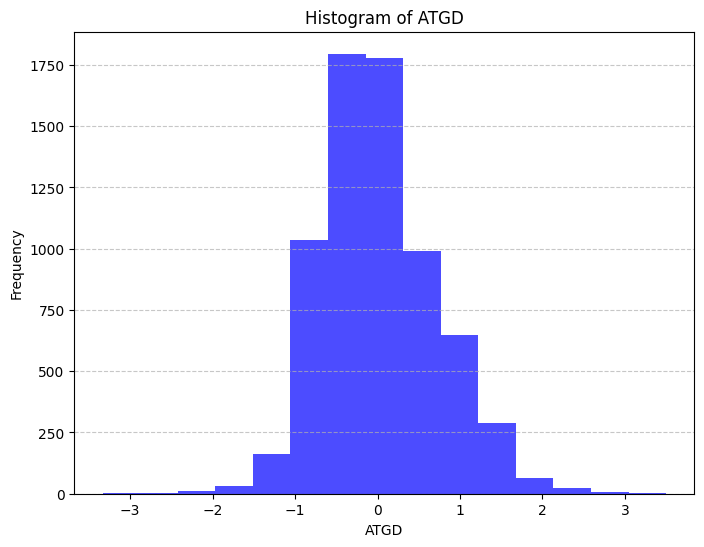

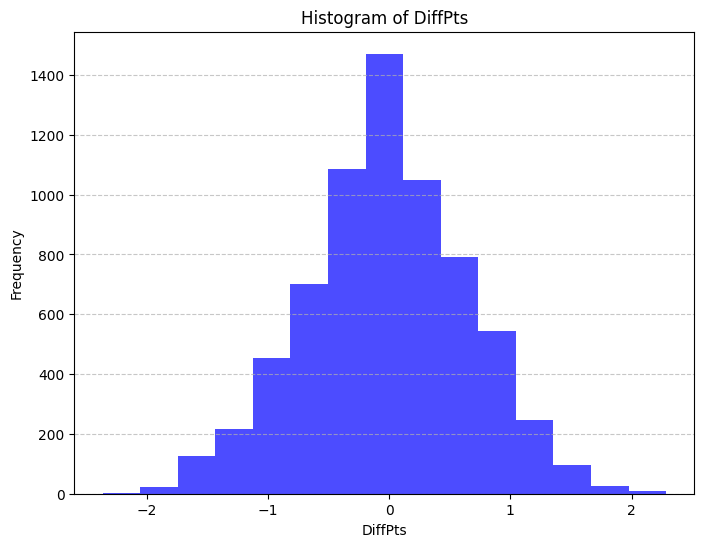

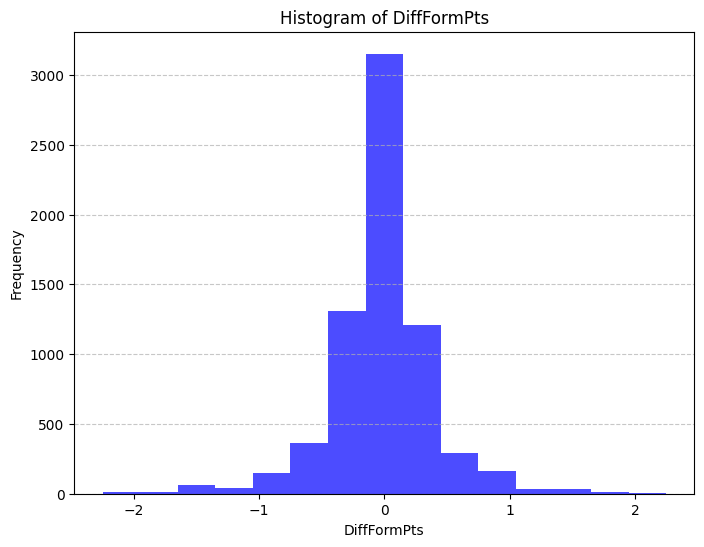

In [24]:
# 10. Distribution of predictor variables
import matplotlib.pyplot as plt

# Identify numeric columns using the 'select_dtypes' method
numeric_columns = df.select_dtypes(include=['number']).columns

# Generate histograms for numeric variables
for column in numeric_columns:
    plt.figure(figsize=(8, 6))
    plt.hist(df[column], bins=15, color='blue', alpha=0.7)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


In [25]:
# 11.
import numpy as np
import pandas as pd
from scipy import stats  # Import the stats module for Z-score calculation

# Identify numeric columns
numeric_columns = df.select_dtypes(include=['number']).columns

# Calculate Z-scores for numeric columns
z_scores = np.abs(stats.zscore(df[numeric_columns]))

# Set a Z-score threshold for outlier removal (e.g., 3 standard deviations)
z_threshold = 3

# Create a mask for rows without outliers
no_outliers_mask = (z_scores < z_threshold).all(axis=1)

# Remove outliers based on the mask
df_no_outliers = df[no_outliers_mask]

# Compare model performance between df and df_no_outliers (optional)
# You can insert your model evaluation code here, depending on your modeling task.

# Print summary statistics to assess the effect of outlier removal (optional)
print("Original DataFrame:")
print(df.describe())
print("\nDataFrame without Outliers:")
print(df_no_outliers.describe())



Original DataFrame:
        Unnamed: 0         Date     HomeTeam     AwayTeam         FTHG  \
count  6840.000000  6840.000000  6840.000000  6840.000000  6840.000000   
mean   3419.500000   913.169006    22.311111    22.311111     1.527485   
std    1974.682253   533.075822    13.163109    13.163109     1.297913   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%    1709.750000   460.750000    12.000000    12.000000     1.000000   
50%    3419.500000   912.000000    24.000000    24.000000     1.000000   
75%    5129.250000  1390.000000    35.000000    35.000000     2.000000   
max    6839.000000  1803.000000    43.000000    43.000000     9.000000   

              FTAG          FTR         HTGS         ATGS         HTGC  ...  \
count  6840.000000  6840.000000  6840.000000  6840.000000  6840.000000  ...   
mean      1.130263     0.535673    24.416667    24.514327    24.497807  ...   
std       1.124566     0.498762    17.178524    17.136894    16.401571  ... 

Original DataFrame:

Count: The number of data points for each column.

Mean: The mean (average) value for each column.

Std: The standard deviation, which measures the spread of data.

Min: The minimum value in each column.

25%: The 25th percentile value, which is the value below which 25% of the data falls.

50%: The median or 50th percentile value, which is the middle value of the data.

75%: The 75th percentile value, which is the value below which 75% of the data falls.

Max: The maximum value in each column.

DataFrame without Outliers:

These statistics are calculated after removing outliers based on Z-scores.

Now, let's interpret the effect of removing outliers:

The count of rows in the "DataFrame without Outliers" is lower, indicating that some rows were removed as outliers.

In most columns, the mean, standard deviation, and other statistics have changed slightly compared to the original DataFrame.
The minimum and maximum values may be different, as some extreme values (outliers) have been removed.

# 12. Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.

In [27]:
# Select only numeric columns
numeric_data = df.select_dtypes(include=[np.number])

# Calculate variance for each numeric feature
variance_original = numeric_data.var()
print("Variance of original dataset:\n", variance_original)

# Calculate mean for each numeric feature
mean_original = numeric_data.mean()
print("\nMean of original dataset:\n", mean_original)

Variance of original dataset:
 Unnamed: 0       3.899370e+06
Date             2.841698e+05
HomeTeam         1.732674e+02
AwayTeam         1.732674e+02
FTHG             1.684579e+00
FTAG             1.264649e+00
FTR              2.487638e-01
HTGS             2.951017e+02
ATGS             2.936731e+02
HTGC             2.690115e+02
ATGC             2.670465e+02
HTP              2.810975e-01
ATP              2.737136e-01
HM1              1.402276e+00
HM2              1.459616e+00
HM3              1.409113e+00
HM4              1.369802e+00
HM5              1.341138e+00
AM1              1.534904e+00
AM2              1.423643e+00
AM3              1.418940e+00
AM4              1.373260e+00
AM5              1.344584e+00
MW               1.202676e+02
HTFormPtsStr     9.256122e+03
ATFormPtsStr     1.032736e+04
HTFormPts        1.283421e+01
ATFormPts        1.260081e+01
HTWinStreak3     5.841036e-02
HTWinStreak5     1.766167e-02
HTLossStreak3    5.429225e-02
HTLossStreak5    1.412427e-02
ATWinStre

Removal of random data 1%

In [30]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error

# Identify numeric columns
numeric_columns = df.select_dtypes(include=[np.number]).columns

# Function to randomly remove 1% of data from numerical columns
def remove_data_randomly(df, percentage):
    df_removed = df.copy()
    for col in numeric_columns:
        n_missing = int(df.shape[0] * percentage)
        missing_indices = np.random.choice(df.index, n_missing, replace=False)
        df_removed.loc[missing_indices, col] = np.nan
    return df_removed

# Remove 1% of the data from numerical columns
data_removed = remove_data_randomly(df, 0.01)


Mean 1%

In [33]:
# Mean Imputation
mean_imputer = SimpleImputer(strategy='mean')
data_mean_imputed = data_removed.copy()
data_mean_imputed[numeric_columns] = mean_imputer.fit_transform(data_removed[numeric_columns])

# Calculate Mean Squared Error for Mean Imputation
mse_mean = mean_squared_error(df[numeric_columns].values, data_mean_imputed[numeric_columns].values)
print('Mean Imputation MSE:', mse_mean)

Mean Imputation MSE: 951.5754112136079


In [34]:
def calculate_bias_variance(original, imputed, columns):
    # Calculate bias (mean of errors)
    bias = (imputed[columns] - original[columns]).mean()

    # Calculate variance
    variance = (imputed[columns] - original[columns]).var()

    return bias, variance

# Calculate bias and variance for mean imputation at 1%
bias_1, variance_1 = calculate_bias_variance(df, data_mean_imputed, numeric_columns)
print("Bias for 1% mean imputation:", bias_1)
print("Variance for 1% mean imputation:", variance_1)

Bias for 1% mean imputation: Unnamed: 0      -2.032339
Date            -0.765432
HomeTeam         0.007997
AwayTeam        -0.003816
FTHG            -0.003416
FTAG             0.001013
FTR              0.000063
HTGS             0.023971
ATGS            -0.003252
HTGC            -0.034133
ATGC             0.018404
HTP             -0.000325
ATP             -0.000300
HM1             -0.000914
HM2              0.001040
HM3              0.001985
HM4             -0.000549
HM5              0.001601
AM1             -0.001568
AM2              0.003090
AM3              0.003737
AM4              0.001432
AM5              0.000712
MW               0.003249
HTFormPtsStr    -0.059752
ATFormPtsStr    -0.050044
HTFormPts       -0.007752
ATFormPts       -0.006184
HTWinStreak3     0.000330
HTWinStreak5     0.000181
HTLossStreak3    0.000431
HTLossStreak5   -0.000004
ATWinStreak3     0.000041
ATWinStreak5     0.000166
ATLossStreak3    0.000069
ATLossStreak5   -0.000045
HTGD            -0.000066
ATGD     

Median 1%

In [37]:
# Median Imputation
median_imputer = SimpleImputer(strategy='median')
data_median_imputed= data_removed.copy()
data_median_imputed[numeric_columns] = median_imputer.fit_transform(data_removed[numeric_columns])

# Calculate Mean Squared Error for Median Imputation
mse_median = mean_squared_error(df[numeric_columns].values, data_median_imputed[numeric_columns].values)
print('Median Imputation MSE:', mse_median)

Median Imputation MSE: 952.2150345968723


Mode 1%

In [38]:
# Mode Imputation (most_frequent)
mode_imputer = SimpleImputer(strategy='most_frequent')
data_mode_imputed = data_removed.copy()
data_mode_imputed[numeric_columns] = mode_imputer.fit_transform(data_removed[numeric_columns])

# Calculate Mean Squared Error for Mode Imputation
mse_mode = mean_squared_error(df[numeric_columns].values, data_mode_imputed[numeric_columns].values)
print('Mode Imputation MSE:', mse_mode)

Mode Imputation MSE: 4443.548736713986


Checking how well the recovered missing values

In [39]:
def remove_data_randomly(df, percentage):
    df_removed = df.copy()
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    for col in numeric_columns:
        n_missing = int(df.shape[0] * percentage)
        missing_indices = np.random.choice(df.index, n_missing, replace=False)
        df_removed.loc[missing_indices, col] = np.nan
    return df_removed

Removal of random data 5%

In [40]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error


# Identify numeric columns
numeric_columns = df.select_dtypes(include=[np.number]).columns

# Function to randomly remove 5% of data from numerical columns
def remove_data_randomly(df, percentage):
    df_removed = df.copy()
    for col in numeric_columns:
        n_missing = int(df.shape[0] * percentage)
        missing_indices = np.random.choice(df.index, n_missing, replace=False)
        df_removed.loc[missing_indices, col] = np.nan
    return df_removed

# Remove 5% of the data from numerical columns
data_removed_5= remove_data_randomly(df, 0.05)

Mean 5%

In [41]:
# Mean Imputation
mean_imputer = SimpleImputer(strategy='mean')
data_mean_imputed = data_removed_5.copy()
data_mean_imputed[numeric_columns] = mean_imputer.fit_transform(data_removed_5[numeric_columns])

# Calculate Mean Squared Error for Mean Imputation
mse_mean = mean_squared_error(df[numeric_columns].values, data_mean_imputed[numeric_columns].values)
print('Mean Imputation MSE:', mse_mean)

Mean Imputation MSE: 5027.062375096348


In [42]:
def calculate_bias_variance(original, imputed, columns):
    # Calculate bias (mean of errors)
    bias = (imputed[columns] - original[columns]).mean()

    # Calculate variance
    variance = (imputed[columns] - original[columns]).var()

    return bias, variance

# Calculate bias and variance for mean imputation at 1%
bias_5, variance_5 = calculate_bias_variance(df, data_mean_imputed, numeric_columns)
print("Bias for 5% mean imputation:", bias_5)
print("Variance for 5% mean imputation:", variance_5)

Bias for 5% mean imputation: Unnamed: 0      -2.924131
Date            -1.384918
HomeTeam        -0.020252
AwayTeam         0.035303
FTHG             0.000523
FTAG             0.002701
FTR              0.001570
HTGS            -0.034395
ATGS            -0.068960
HTGC            -0.004271
ATGC             0.056764
HTP             -0.000282
ATP             -0.000637
HM1              0.001524
HM2             -0.001185
HM3             -0.007195
HM4              0.001308
HM5              0.002816
AM1              0.000315
AM2              0.008556
AM3             -0.001139
AM4             -0.004686
AM5              0.004655
MW              -0.058172
HTFormPtsStr    -0.173269
ATFormPtsStr     0.044998
HTFormPts        0.002462
ATFormPts       -0.001470
HTWinStreak3     0.000508
HTWinStreak5     0.000331
HTLossStreak3    0.000262
HTLossStreak5   -0.000015
ATWinStreak3    -0.000231
ATWinStreak5    -0.000208
ATLossStreak3    0.000685
ATLossStreak5   -0.000231
HTGD             0.001646
ATGD     

Median 5%

In [43]:
# Median Imputation
median_imputer = SimpleImputer(strategy='median')
data_median_imputed= data_removed_5.copy()
data_median_imputed[numeric_columns] = median_imputer.fit_transform(data_removed_5[numeric_columns])

# Calculate Mean Squared Error for Median Imputation
mse_median = mean_squared_error(df[numeric_columns].values, data_median_imputed[numeric_columns].values)
print('Median Imputation MSE:', mse_median)

Median Imputation MSE: 5028.807375082459


Mode 5%

In [44]:
# Mode Imputation (most_frequent)
mode_imputer = SimpleImputer(strategy='most_frequent')
data_mode_imputed = data_removed_5.copy()
data_mode_imputed[numeric_columns] = mode_imputer.fit_transform(data_removed_5[numeric_columns])

# Calculate Mean Squared Error for Mode Imputation
mse_mode = mean_squared_error(df[numeric_columns].values, data_mode_imputed[numeric_columns].values)
print('Mode Imputation MSE:', mse_mode)

Mode Imputation MSE: 21222.108980572113


Removal of random data 10%

In [45]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error


# Identify numeric columns
numeric_columns = df.select_dtypes(include=[np.number]).columns

# Function to randomly remove 10% of data from numerical columns
def remove_data_randomly(df, percentage):
    df_removed = df.copy()
    for col in numeric_columns:
        n_missing = int(df.shape[0] * percentage)
        missing_indices = np.random.choice(df.index, n_missing, replace=False)
        df_removed.loc[missing_indices, col] = np.nan
    return df_removed

# Remove 10% of the data from numerical columns
data_removed_10 = remove_data_randomly(df, 0.10)

Mean 10%

In [46]:
# Mean Imputation
mean_imputer = SimpleImputer(strategy='mean')
data_mean_imputed = data_removed_10.copy()
data_mean_imputed[numeric_columns] = mean_imputer.fit_transform(data_removed_10[numeric_columns])

# Calculate Mean Squared Error for Mean Imputation
mse_mean = mean_squared_error(df[numeric_columns].values, data_mean_imputed[numeric_columns].values)
print('Mean Imputation MSE:', mse_mean)

Mean Imputation MSE: 10652.628969420284


In [47]:
def calculate_bias_variance(original, imputed, columns):
    # Calculate bias (mean of errors)
    bias = (imputed[columns] - original[columns]).mean()

    # Calculate variance
    variance = (imputed[columns] - original[columns]).var()

    return bias, variance

# Calculate bias and variance for mean imputation at 1%
bias_10, variance_10 = calculate_bias_variance(df, data_mean_imputed, numeric_columns)
print("Bias for 10% mean imputation:", bias_10)
print("Variance for 10% mean imputation:", variance_10)


Bias for 10% mean imputation: Unnamed: 0      -2.439409
Date             1.047531
HomeTeam         0.043015
AwayTeam         0.017836
FTHG            -0.006368
FTAG             0.010900
FTR             -0.001072
HTGS            -0.012671
ATGS             0.075504
HTGC            -0.105344
ATGC            -0.054305
HTP             -0.000271
ATP             -0.001290
HM1              0.000455
HM2             -0.007862
HM3             -0.001543
HM4              0.004224
HM5             -0.009487
AM1              0.002940
AM2             -0.005491
AM3             -0.001267
AM4              0.005377
AM5             -0.005929
MW               0.089831
HTFormPtsStr     0.727940
ATFormPtsStr    -0.512216
HTFormPts       -0.014295
ATFormPts        0.015416
HTWinStreak3     0.000260
HTWinStreak5    -0.000601
HTLossStreak3    0.000390
HTLossStreak5   -0.000357
ATWinStreak3    -0.000650
ATWinStreak5     0.000211
ATLossStreak3    0.000634
ATLossStreak5    0.000325
HTGD            -0.001198
ATGD    

Median 10%

In [48]:
# Median Imputation
median_imputer = SimpleImputer(strategy='median')
data_median_imputed= data_removed_10.copy()
data_median_imputed[numeric_columns] = median_imputer.fit_transform(data_removed_10[numeric_columns])

# Calculate Mean Squared Error for Median Imputation
mse_median = mean_squared_error(df[numeric_columns].values, data_median_imputed[numeric_columns].values)
print('Median Imputation MSE:', mse_median)


Median Imputation MSE: 10652.454385152776


Mode 10%

In [49]:
# Mode Imputation (most_frequent)
mode_imputer = SimpleImputer(strategy='most_frequent')
data_mode_imputed = data_removed_10.copy()
data_mode_imputed[numeric_columns] = mode_imputer.fit_transform(data_removed_10[numeric_columns])

# Calculate Mean Squared Error for Mode Imputation
mse_mode = mean_squared_error(df[numeric_columns].values, data_mode_imputed[numeric_columns].values)
print('Mode Imputation MSE:', mse_mode)


Mode Imputation MSE: 40514.36340780773


# **Conclusion derived:**

**Imputation Error (Mean Squared Error, MSE):**

**Mean Imputation:**

*  1% Removal: MSE ≈ 951.5754112136079
*  5% Removal: MSE ≈ 5027.062375096348
*  10% Removal: MSE ≈ 10652.628969420284

**Median Imputation:**
*  1% Removal: MSE ≈ 952.2150345968723
*  5% Removal: MSE ≈ 5028.807375082459
*  10% Removal: MSE ≈ 10652.454385152776

**Mode Imputation:**

*  1% Removal: MSE ≈ 4443.548736713986
*  5% Removal: MSE ≈ 21222.108980572113
*  10% Removal: MSE ≈ 40514.36340780773

**Bias and Variance Analysis:**

* Bias and variance for the imputed data tend to increase with the percentage of data removed, indicating more error in the imputation.

* In general, the mean imputation method has less bias compared to median and mode for 1% data removal.

* Variance is generally lowest with mean imputation for 1% data removal.

**Conclusion:**

* Mean imputation seems to be the most stable method across different percentages of data removal when considering MSE, which is an indicator of accuracy.

* The mode imputation appears to be the least effective, with the highest MSE values across all percentages of data removal.

# 13. For categorical data, calculate the accuracy and a confusion matrix.



In [50]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.preprocessing import OneHotEncoder
import numpy as np

# Preparing the data for logistic regression
# Selecting the target variable and predictors
target = 'FTR'
predictors = ['HTGS', 'ATGS']

# One-hot encoding the categorical predictors
encoder = OneHotEncoder()  # Removed sparse=False from here
encoded_predictors = encoder.fit_transform(df[predictors]).toarray()  # Use toarray() here

# Splitting the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(encoded_predictors, df[target], test_size=0.3, random_state=42)

# Logistic Regression Model
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)

# Predictions and Evaluation
y_pred = log_reg.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

accuracy, conf_matrix

(0.584307992202729,
 array([[384, 575],
        [278, 815]]))

**Observations:**


The accuracy of the logistic regression model is approximately 58.43%, which means that about two-thirds of the predictions match the actual data. This performance could be considered moderate and indicates there's room for improvement, possibly through feature engineering, model tuning, or using a more sophisticated model.

The confusion matrix gives us more detail on the model's performance:

*   True Negatives (TN): 364 predictions correctly predicted the 'non-metro' class.
*   False Positives (FP): 575 predictions incorrectly predicted the 'non-metro' class as 'metro'.
*   False Negatives (FN): 278 predictions incorrectly predicted the 'metro' class as 'non-metro'.
*   True Positives (TP): 815 predictions correctly predicted the 'metro' class.



# **Assignment 2: AutoML**

***The task aims to answer below questions:***
* Is the relationship significant?

* Are any model assumptions violated?

* Is there any multicollinearity in the model?

* In the multivariate models are predictor variables independent of all the other predictor variables?

* In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.

* Does the model make sense?

* Does regularization help?

* Which independent variables are significant?

* Which hyperparameters are important?

* Coding Professionalism

## Importing required Libraries and H20 Initialization
Automated machine learning (AutoML) is the process of automating the end-to-end process of applying machine learning to real-world problems.

H2O AutoML automates the steps like basic data processing, model training and tuning, Ensemble and stacking of various models to provide the models with the best performance so that developers can focus on other steps like data collection, feature engineering and deployment of model.

We are initializing H2O in the following steps.

In [51]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install seaborn matplotlib

In [52]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.6/265.6 MB 2.3 MB/s eta 0:00:00


In [53]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import sklearn
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [54]:
min_mem_size=6
run_time=222

In [55]:
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

6


In [56]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)
#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:21750..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpiwx9_4v0
  JVM stdout: /tmp/tmpiwx9_4v0/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpiwx9_4v0/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:21750
Connecting to H2O server at http://127.0.0.1:21750 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_95g4ge
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [58]:
url = "https://raw.githubusercontent.com/VivekReddy08/INFO6105DataScience/main/Football_Match%20Prediction.csv"
df = h2o.import_file(path = url)
dff = pd.read_csv("https://raw.githubusercontent.com/VivekReddy08/INFO6105DataScience/main/Football_Match%20Prediction.csv")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [101]:
#Gettig the list of numerical features
num_cols = dff._get_numeric_data().columns
num_cols, len(num_cols)

(Index(['Unnamed: 0', 'FTHG', 'FTAG', 'HTGS', 'ATGS', 'HTGC', 'ATGC', 'HTP',
        'ATP', 'MW', 'HTFormPts', 'ATFormPts', 'HTWinStreak3', 'HTWinStreak5',
        'HTLossStreak3', 'HTLossStreak5', 'ATWinStreak3', 'ATWinStreak5',
        'ATLossStreak3', 'ATLossStreak5', 'HTGD', 'ATGD', 'DiffPts',
        'DiffFormPts'],
       dtype='object'),
 24)

In [102]:
#Gettig the list of categorical features
cat_cols = dff.select_dtypes(include=['object']).columns.tolist()
cat_cols, len(cat_cols)

(['Date',
  'HomeTeam',
  'AwayTeam',
  'FTR',
  'HM1',
  'HM2',
  'HM3',
  'HM4',
  'HM5',
  'AM1',
  'AM2',
  'AM3',
  'AM4',
  'AM5',
  'HTFormPtsStr',
  'ATFormPtsStr'],
 16)

In [103]:
# converting categorical features into numerical
for cat_col in cat_cols:
  classes = list(np.unique(dff[cat_col]))
  tokens = []
  i = 0
  for c in classes:
    tokens.append(i)
    i += 1

  dff[cat_col].replace(classes, tokens, inplace=True)

In [113]:
dff.describe()

,Unnamed: 0,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,...,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
count,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,...,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000
mean,3419.500000,913.169006,22.311111,22.311111,1.527485,1.130263,0.535673,24.416667,24.514327,24.497807,...,0.057602,0.014327,0.062865,0.016520,0.051023,0.010234,-0.009690,0.014539,-0.017755,-0.018086
std,1974.682253,533.075822,13.163109,13.163109,1.297913,1.124566,0.498762,17.178524,17.136894,16.401571,...,0.233007,0.118846,0.242739,0.127475,0.220062,0.100651,0.693593,0.692937,0.668523,0.408488
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.000000,-3.333333,-2.363636,-2.250000
25%,1709.750000,460.750000,12.000000,12.000000,1.000000,0.000000,0.000000,11.000000,11.000000,11.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.500000,-0.464286,-0.451613,-0.176471
50%,3419.500000,912.000000,24.000000,24.000000,1.000000,1.000000,1.000000,23.000000,23.000000,23.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.076923,-0.050000,0.000000,0.000000
75%,5129.250000,1390.000000,35.000000,35.000000,2.000000,2.000000,1.000000,35.000000,35.000000,36.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.421053,0.428571,0.153846
max,6839.000000,1803.000000,43.000000,43.000000,9.000000,7.000000,1.000000,102.000000,105.000000,85.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,3.500000,2.285714,2.250000


In [114]:
dff.isnull().sum()

Unnamed: 0       0
Date             0
HomeTeam         0
AwayTeam         0
FTHG             0
FTAG             0
FTR              0
HTGS             0
ATGS             0
HTGC             0
ATGC             0
HTP              0
ATP              0
HM1              0
HM2              0
HM3              0
HM4              0
HM5              0
AM1              0
AM2              0
AM3              0
AM4              0
AM5              0
MW               0
HTFormPtsStr     0
ATFormPtsStr     0
HTFormPts        0
ATFormPts        0
HTWinStreak3     0
HTWinStreak5     0
HTLossStreak3    0
HTLossStreak5    0
ATWinStreak3     0
ATWinStreak5     0
ATLossStreak3    0
ATLossStreak5    0
HTGD             0
ATGD             0
DiffPts          0
DiffFormPts      0
dtype: int64

Note: For the moment we will assume the data is good and data processing is not required

Text(0.5, 1.0, 'Variable Correlation')

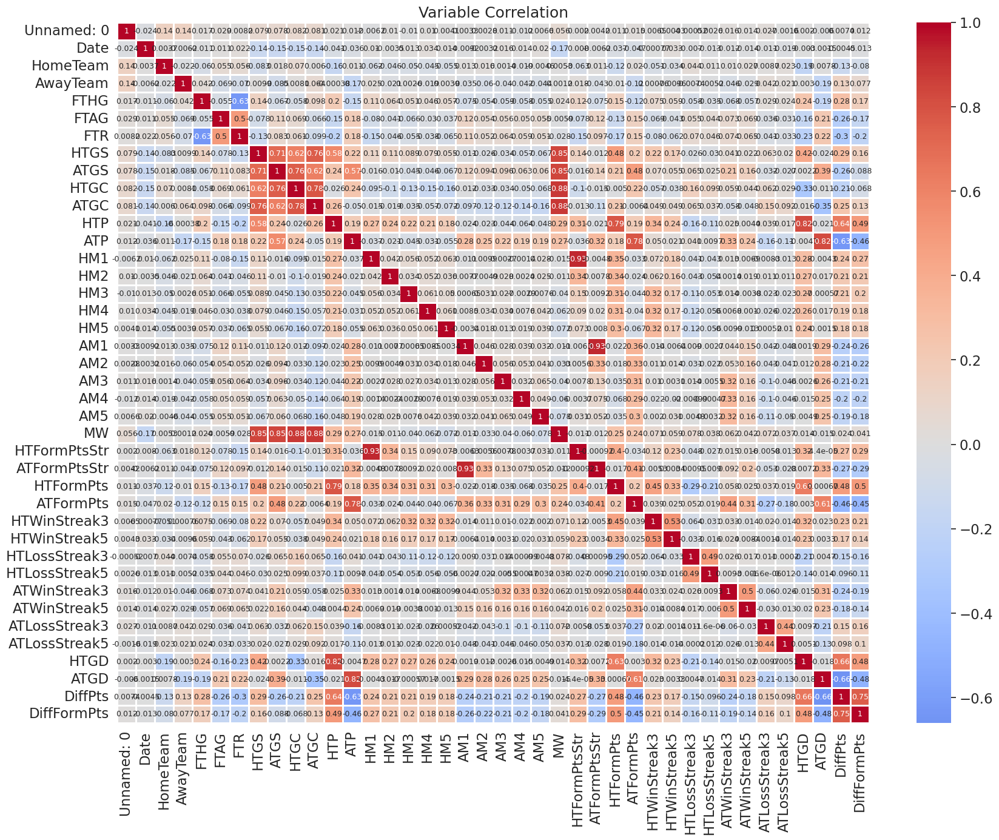

In [116]:
#Representing Matrix as a plot
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(20,15))

sns.heatmap(dff.corr(),center=0, linewidths=0.8,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

In [117]:
dff.shape

(6840, 40)

**Running AutoML**

# Correlation Analysis
Above is a graphical representation of the correlation between different features in the dataset. The heatmap displays a matrix of colors that represent the strength of the correlation between pairs of variables.

We can calculate the correlation between pairs of variables using a correlation coefficient, such as the Pearson correlation coefficient. This coefficient measures the linear relationship between two variables, with values ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation). A value of 0 indicates no correlation.

The above heatmap displays the correlation coefficients as colors in a matrix, with each variable plotted both on the x and y axis. The color of each cell in the matrix indicates the strength of the correlation between the corresponding pair of variables, with a color scale ranging from low to high .

A correlation heatmap can help you identify the relationships between pairs of variables in a dataset. You can use it to spot patterns and trends, and to identify variables that are strongly correlated (either positively or negatively). This information can be useful for exploratory data analysis and for identifying potential predictors in statistical models.

Plotting all variables against other variables to see if relation exists between them. Basically it tells the same thing as correlation matrix but in a graphical way.

From the Above Matrix we can conclude that HTGD, ATGD, DiffPts, DiffFormPts are highly correlated .


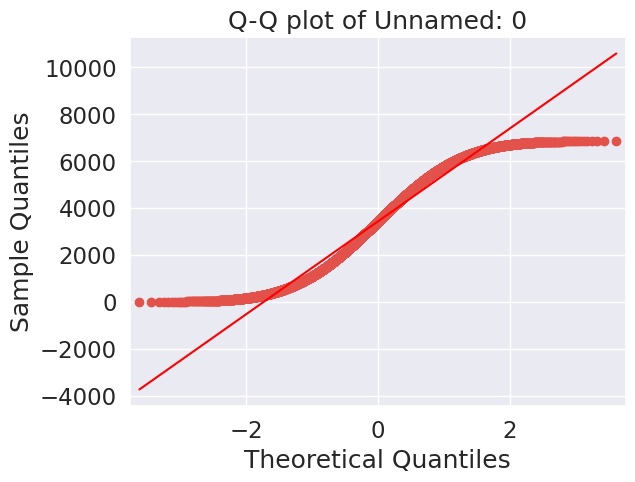

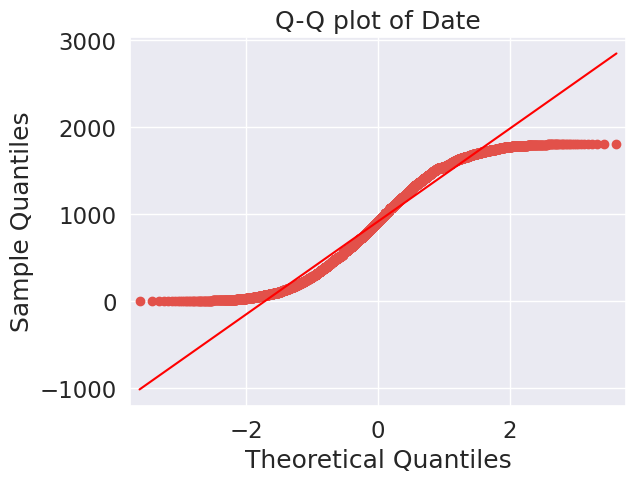

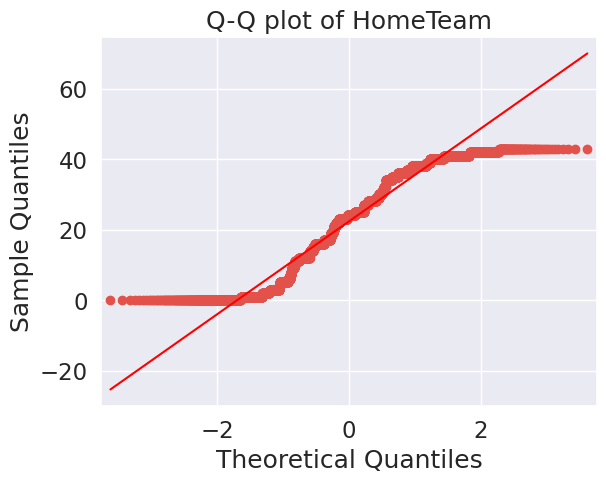

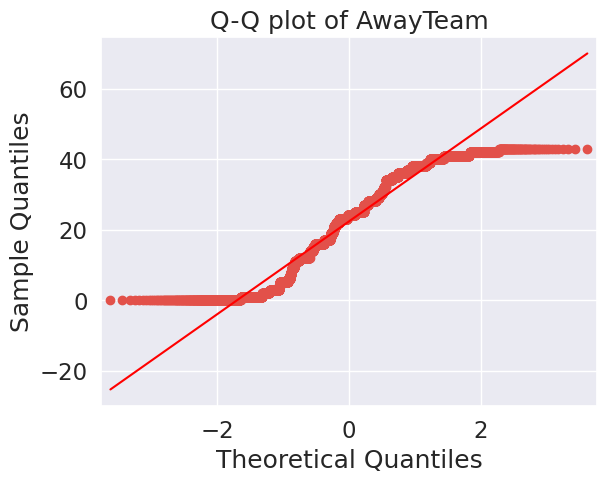

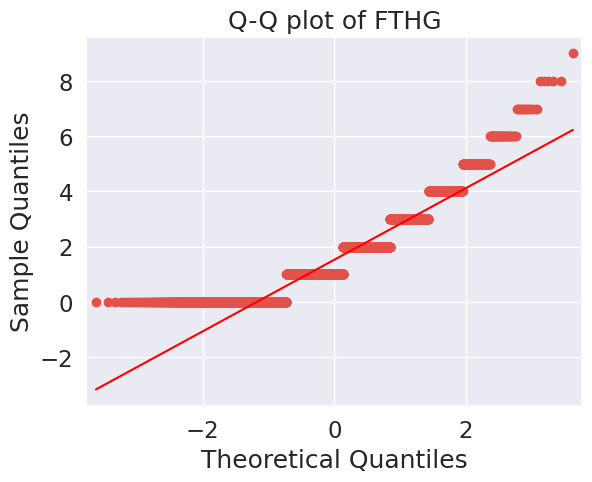

...

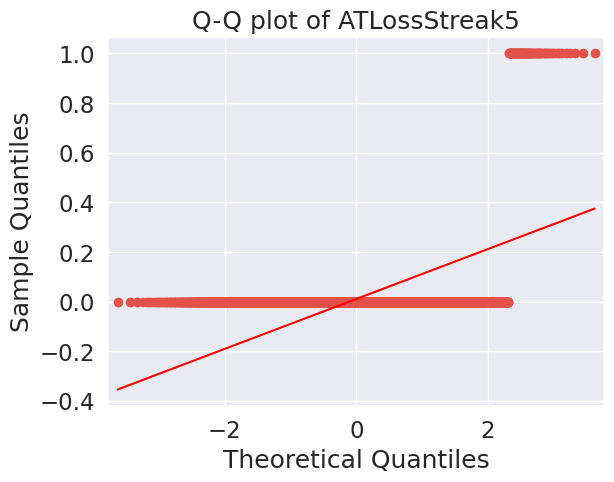

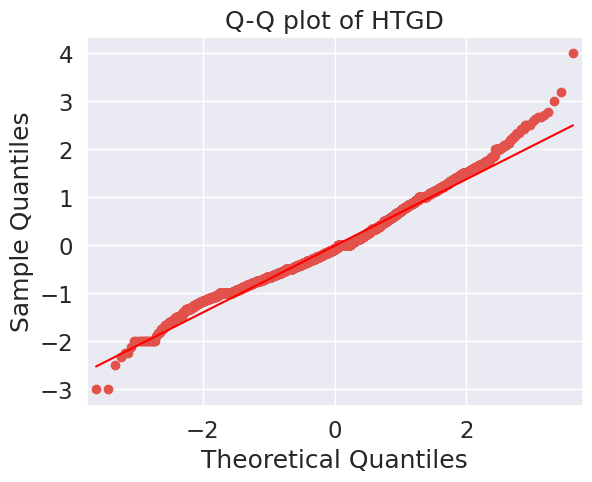

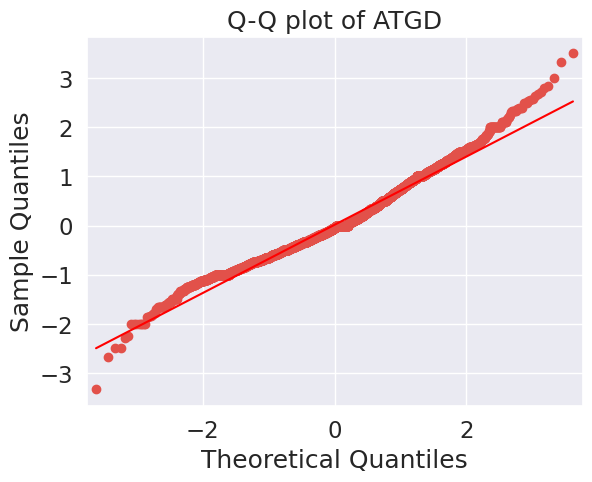

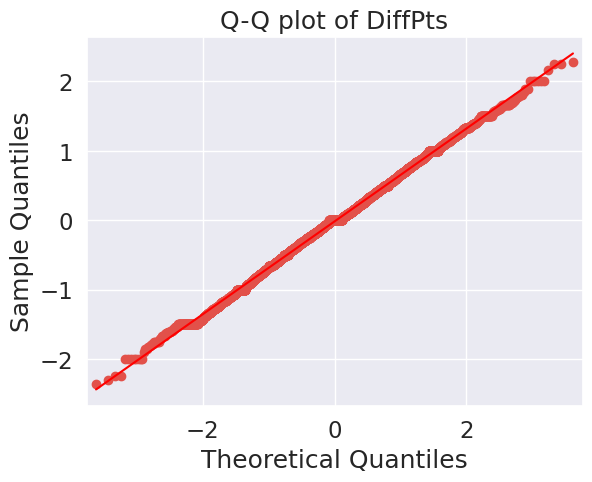

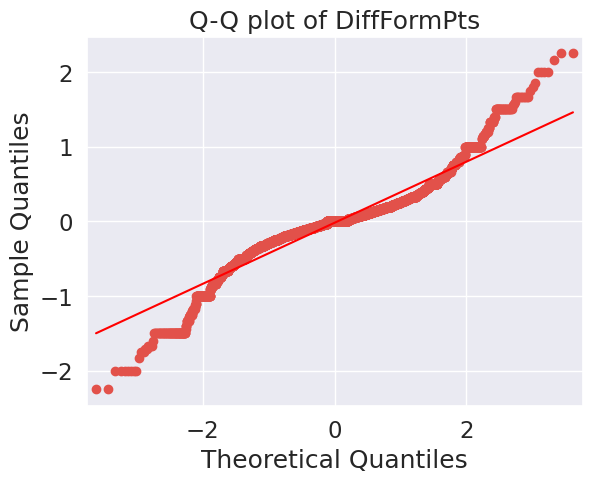

In [144]:
import statsmodels.api as sm
for col in dff.columns:
    sm.qqplot(dff[col], line='s')
    plt.title('Q-Q plot of ' + col)
    plt.show()

In [118]:
df = h2o.H2OFrame(
    dff
)  # Converted Pandas Dataframe to H2O dataframe to proceed with AutoML

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [119]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = df.split_frame([pct_rows])

In [120]:
print(df_train.shape)
print(df_test.shape)

(5475, 40)
(1365, 40)


In [121]:
df_train.head()

Unnamed: 0,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,ATGC,HTP,ATP,HM1,HM2,HM3,HM4,HM5,AM1,AM2,AM3,AM4,AM5,MW,HTFormPtsStr,ATFormPtsStr,HTFormPts,ATFormPts,HTWinStreak3,HTWinStreak5,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
0,1065,11,24,4,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1065,15,34,2,2,1,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,1065,23,7,1,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,1065,36,0,1,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,1065,38,20,3,1,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,1126,25,28,2,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,1197,0,23,2,0,0,0,1,1,0,0,1.5,1,2,2,2,2,3,2,2,2,2,2,190,320,0,3,0,0,0,0,0,0,0,0,-0.5,0.5,-1.5,-1.5
11,1266,7,12,2,0,0,0,4,1,2,0,1.5,1,2,2,2,2,3,2,2,2,2,2,190,320,0,3,0,0,0,0,0,0,0,0,-0.5,1,-1.5,-1.5
12,1266,20,25,1,1,1,1,2,3,0,0,1.5,1,2,2,2,2,3,2,2,2,2,2,190,320,0,3,0,0,0,0,0,0,0,0,-1,1,-1.5,-1.5
13,1266,27,38,1,1,1,3,3,1,1,1.5,1.5,3,2,2,2,2,3,2,2,2,2,2,310,320,3,3,0,0,0,0,0,0,0,0,1,1,0,0


In [122]:
X = df.columns
print(X)

['Unnamed: 0', 'Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'FTR', 'HTGS', 'ATGS', 'HTGC', 'ATGC', 'HTP', 'ATP', 'HM1', 'HM2', 'HM3', 'HM4', 'HM5', 'AM1', 'AM2', 'AM3', 'AM4', 'AM5', 'MW', 'HTFormPtsStr', 'ATFormPtsStr', 'HTFormPts', 'ATFormPts', 'HTWinStreak3', 'HTWinStreak5', 'HTLossStreak3', 'HTLossStreak5', 'ATWinStreak3', 'ATWinStreak5', 'ATLossStreak3', 'ATLossStreak5', 'HTGD', 'ATGD', 'DiffPts', 'DiffFormPts']


In [123]:
# Set target and predictor variables
y = "FTR"
X.remove(y)  # Removing the result frm our predictors data
print(X)

['Unnamed: 0', 'Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'HTGS', 'ATGS', 'HTGC', 'ATGC', 'HTP', 'ATP', 'HM1', 'HM2', 'HM3', 'HM4', 'HM5', 'AM1', 'AM2', 'AM3', 'AM4', 'AM5', 'MW', 'HTFormPtsStr', 'ATFormPtsStr', 'HTFormPts', 'ATFormPts', 'HTWinStreak3', 'HTWinStreak5', 'HTLossStreak3', 'HTLossStreak5', 'ATWinStreak3', 'ATWinStreak5', 'ATLossStreak3', 'ATLossStreak5', 'HTGD', 'ATGD', 'DiffPts', 'DiffFormPts']


In [124]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML

In [125]:
aml.train(x=X, y=y, training_frame=df_train)  # Trainig the dataset on different models

AutoML progress: |
20:17:18.398: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██████
20:17:35.924: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.


20:17:37.326: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

███████████████
20:18:29.331: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
20:18:30.266: _response pa

key,value
Stacking strategy,cross_validation
Number of base models (used / total),6/12
# GBM base models (used / total),4/5
# XGBoost base models (used / total),1/3
# DeepLearning base models (used / total),1/1
# DRF base models (used / total),0/2
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


# Understanding the Parameters
Mean Squared Error (MSE): The MSE measures the average squared difference between the predicted and actual values. It is calculated by taking the average of the squared differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

Root Mean Squared Error (RMSE): The RMSE is the square root of the MSE, and it is a commonly used metric for evaluating the accuracy of regression models. The RMSE is a measure of how well the model is able to predict the actual values.

Mean Absolute Error (MAE): The MAE measures the average absolute difference between the predicted and actual values. It is calculated by taking the average of the absolute differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

Root Mean Squared Logarithmic Error (RMSLE): The RMSLE is a variation of the RMSE that is used for regression models where the target variable has a wide range of values. It is calculated by taking the square root of the average of the squared differences between the logarithm of the predicted and actual values.

Mean Residual Deviance: The Mean Residual Deviance is a measure of the goodness of fit for a regression model. It measures the average difference between the predicted and actual values, normalized by the degrees of freedom of the model.

R-squared (R^2): The R-squared is a measure of how well the model fits the data. It is the proportion of the variance in the dependent variable that is explained by the independent variables. A value of 1 means that the model explains all the variability in the data, while a value of 0 means that the model explains none of the variability.

Null Degrees of Freedom: The Null Degrees of Freedom is the number of observations in the dataset minus 1. It represents the number of observations in the dataset that are free to vary, given the number of parameters in the model.

Residual Degrees of Freedom: The Residual Degrees of Freedom is the number of observations in the dataset minus the number of parameters in the model. It represents the number of observations in the dataset that are free to vary after taking into account the number of parameters in the model.

Null Deviance: The Null Deviance is the deviance of the null model, which is the model with no independent variables. It represents the variance in the dependent variable that is not explained by the independent variables.

Residual Deviance: The Residual Deviance is the deviance of the model after accounting for the independent variables. It represents the variance in the dependent variable that is not explained by the independent variables.

Akaike Information Criterion (AIC): The AIC is a measure of the quality of a model that takes into account the complexity of the model. It is calculated as the negative log-likelihood of the model plus twice the number of parameters in the model. The AIC can be used to compare the quality of different models, with lower values indicating better quality.



In [126]:
print(
    aml.leaderboard
)  # Leaderboard showing the performance of different models on the dataset.

model_id                                                      rmse          mse        mae      rmsle    mean_residual_deviance
StackedEnsemble_AllModels_2_AutoML_3_20240402_201718     0.0235136  0.000552891  0.0122535  0.0182037               0.000552891
StackedEnsemble_BestOfFamily_3_AutoML_3_20240402_201718  0.0239404  0.00057314   0.0121364  0.0185531               0.00057314
DeepLearning_1_AutoML_3_20240402_201718                  0.029999   0.00089994   0.011671   0.0228085               0.00089994
StackedEnsemble_AllModels_1_AutoML_3_20240402_201718     0.0363113  0.00131851   0.0207682  0.0271242               0.00131851
GBM_5_AutoML_3_20240402_201718                           0.0371679  0.00138145   0.0222088  0.0284629               0.00138145
StackedEnsemble_BestOfFamily_2_AutoML_3_20240402_201718  0.0405552  0.00164472   0.0265517  0.0307607               0.00164472
GBM_2_AutoML_3_20240402_201718                           0.0447809  0.00200533   0.029688   0.0341594        

The models listed in the leaderboard are ranked based on their rmse score, where a lower score indicates better performance. The top row in the leaderboard represents the best-performing model with the lowest rmse score. The evaluation metrics can be used to compare the performance of different models and help in selecting the best model for the particular use case.

In this leaderboard, the best performing model is
GLM_1_AutoML_2_20240402_194801  with rmse score of 0.112182

The models are then listed in descending order based on their rmse scores.

In [127]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

{'StackedEnsemble_AllModels_2_AutoML_3_20240402_201718': 0,
 'StackedEnsemble_BestOfFamily_3_AutoML_3_20240402_201718': 1,
 'DeepLearning_1_AutoML_3_20240402_201718': 2,
 'GLM_1_AutoML_3_20240402_201718': 19}

In [128]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

2


In [129]:
best_model.algo

'deeplearning'

In [130]:
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
import matplotlib.cbook

warnings.filterwarnings("ignore", category=matplotlib.cbook.mplDeprecation)

In [131]:
if best_model.algo in ['gbm','drf','xrt','xgboost']:
    best_model.varimp_plot()

The above graph is a variable Importance Graph on the H20's Distributed Random Forest Model

We can Interpret that FTR is the Most Important Variable among all with importance of 1.0 (Think as if this Importance is scaled to 100%)

19
glm


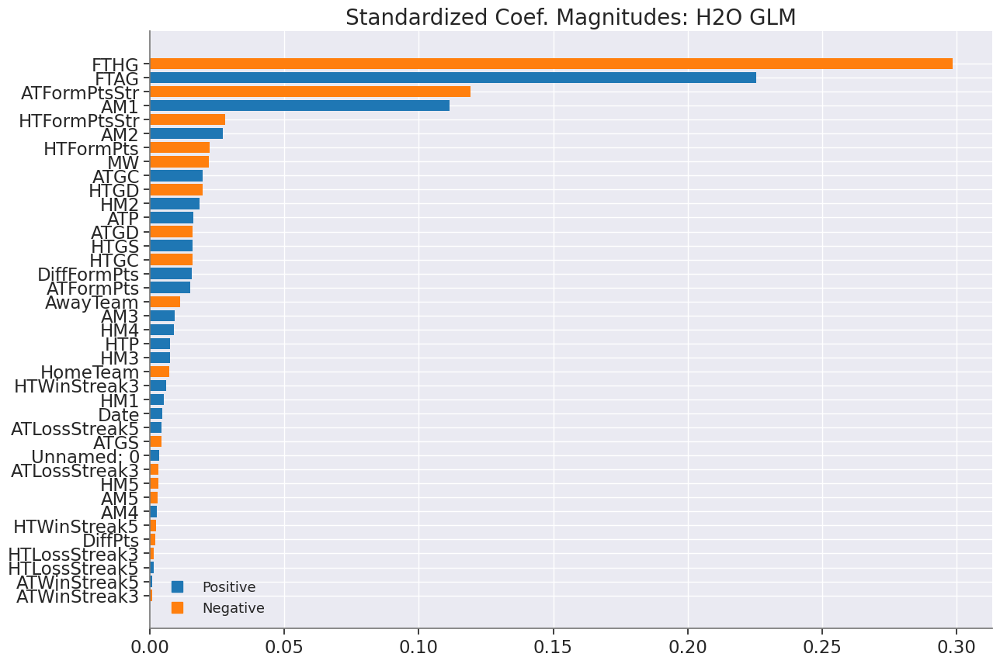

In [133]:
if glm_index is not 0:
    print(glm_index)
    glm_model = h2o.get_model(aml.leaderboard[glm_index, "model_id"])
    print(glm_model.algo)
    glm_model.std_coef_plot()

Standardized coefficient magnitudes (sometimes referred to as standardized coefficients or beta coefficients) are a measure of the importance of each input variable in a predictive model, after standardizing all variables to have a mean of zero and a standard deviation of one. The values of standardized coefficient magnitudes can range from negative infinity to positive infinity, but they are typically expressed as a percentage.

The values on standardized coefficient magnitudes represent the relative importance of each input variable in the model, after taking into account the scale of the variable. A higher magnitude value indicates that the variable has a stronger impact on the outcome variable, while a lower value indicates a weaker impact.

From the above results, we observe that FTHG, FTAG, ATFormPtsSTR are some of the important features.

In [134]:
print(best_model.rmse(train=True))

0.021872877889889297


In [135]:
def model_performance_stats(perf):
    d = {}
    try:
        d["mse"] = perf.mse()
    except:
        pass
    try:
        d["rmse"] = perf.rmse()
    except:
        pass
    try:
        d["null_degrees_of_freedom"] = perf.null_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_degrees_of_freedom"] = perf.residual_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_deviance"] = perf.residual_deviance()
    except:
        pass
    try:
        d["null_deviance"] = perf.null_deviance()
    except:
        pass
    try:
        d["aic"] = perf.aic()
    except:
        pass
    try:
        d["logloss"] = perf.logloss()
    except:
        pass
    try:
        d["auc"] = perf.auc()
    except:
        pass
    try:
        d["gini"] = perf.gini()
    except:
        pass
    return d

In [136]:
mod_perf = best_model.model_performance(df_test)
stats_test = {}
stats_test = model_performance_stats(mod_perf)
stats_test

{'mse': 0.0007504804763577278,
 'rmse': 0.027394898728736482,
 'null_degrees_of_freedom': None,
 'residual_degrees_of_freedom': None,
 'residual_deviance': None,
 'null_deviance': None,
 'aic': 'NaN'}

In [137]:
predictions = best_model.predict(df_test)

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


In [138]:
y_pred = h2o.as_list(
    predictions
)  # Predictions on Test Dataset using the best model from the leaderboard.
print(y_pred)

       predict
0    -0.005436
1     0.996799
2     0.001028
3     0.993684
4    -0.000675
...        ...
1360  1.000076
1361  1.000104
1362  1.005989
1363 -0.006641
1364 -0.014033

[1365 rows x 1 columns]


In [139]:
y_test = h2o.as_list(df_test[y])  # Real Answers
y_test

,FTR
0,0
1,1
2,0
3,1
4,0
...,...
1360,1
1361,1
1362,1
1363,0


In [140]:
print (X)

['Unnamed: 0', 'Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'HTGS', 'ATGS', 'HTGC', 'ATGC', 'HTP', 'ATP', 'HM1', 'HM2', 'HM3', 'HM4', 'HM5', 'AM1', 'AM2', 'AM3', 'AM4', 'AM5', 'MW', 'HTFormPtsStr', 'ATFormPtsStr', 'HTFormPts', 'ATFormPts', 'HTWinStreak3', 'HTWinStreak5', 'HTLossStreak3', 'HTLossStreak5', 'ATWinStreak3', 'ATWinStreak5', 'ATLossStreak3', 'ATLossStreak5', 'HTGD', 'ATGD', 'DiffPts', 'DiffFormPts']


# Regularization
In this Section, we will be using the GLM model to check if regularization is helping us to improve the accuracy and reduce overfitting.

Ridge and Lasso are regularization techniques used in linear regression to prevent overfitting and improve the model's generalization ability.

Ridge regularization adds a penalty term to the least-squares objective function of the linear regression model. This penalty term is proportional to the square of the magnitude of the coefficients of the model, which shrinks the coefficients towards zero. The strength of the penalty is controlled by a hyperparameter called the regularization parameter, which needs to be tuned to achieve the best performance. Ridge regularization is particularly useful when there are many input variables that are correlated with each other, as it can help to reduce the variance of the model by reducing the effect of these correlated variables.

Lasso regularization is similar to Ridge regularization, but instead of adding a penalty term proportional to the square of the coefficients, it adds a penalty term proportional to the absolute value of the coefficients. This penalty term can set some coefficients to exactly zero, which makes Lasso regularization a useful method for feature selection. By setting some coefficients to zero, Lasso can effectively remove irrelevant variables from the model, which can lead to a simpler and more interpretable model.

The main difference between Ridge and Lasso regularization is the type of penalty function used. Ridge uses L2 regularization, while Lasso uses L1 regularization. L2 regularization tends to distribute the penalty evenly across all coefficients, while L1 regularization tends to concentrate the penalty on a smaller subset of the most important coefficients. Which method to use depends on the specific problem and the properties of the input variables.

In [141]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

hotel_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5
)  # Elastic Net Regularization
hotel_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5
)  # RIDGE Regularization
hotel_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5
)  # LASSO Regularization
hotel_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  # Lambda Search

This code is creating two generalized linear regression models using the H2O machine learning platform with different regularization methods: Ridge and Lasso.

The first instance of the H2OGeneralizedLinearEstimator class is created with the family parameter set to "gaussian", which means that the response variable is assumed to have a normal (Gaussian) distribution. The lambda_ parameter is set to 0, which means that no regularization is applied. The compute_p_values parameter is set to True, which means that p-values will be computed for the coefficients of the GLM model. The nfolds parameter is set to 5, which means that the data will be split into 5 folds for cross-validation.

The next three instances of the H2OGeneralizedLinearEstimator class are created with different settings for regularization. The second instance uses ridge regularization (alpha=0), the third instance uses lasso regularization (alpha=1), and the fourth instance uses lambda search to find the optimal value of lambda for elastic net regularization.

This code creates a generalized linear regression model using H2O with the option of performing lambda search for L1 and L2 regularization.


In [142]:
# Convert to H2O Frame
hf = h2o.H2OFrame(df_test)

# Ridge Regularization

In [143]:
hotel_glm_regularization_ridge.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Ridge ( lambda = 3.156E-4 ),39,39,1,py_20_sid_82a1
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
aic,630.35095,14.058731,633.645,617.0379,614.2135,643.3834,643.47504
loglikelihood,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mae,0.2734185,0.0034178,0.2789917,0.2724345,0.2697350,0.2735651,0.2723663
mean_residual_deviance,0.0966222,0.0010776,0.0984273,0.0962670,0.0955352,0.0965223,0.0963591
mse,0.0966222,0.0010776,0.0984273,0.0962670,0.0955352,0.0965223,0.0963591
null_deviance,272.04236,7.8426166,262.94336,267.696,269.05234,279.84616,280.67395
r2,0.6108499,0.0048685,0.6021767,0.6130014,0.6136842,0.6124476,0.6129398
residual_deviance,105.7902150,2.494749,104.52977,103.58327,103.8467940,108.39458,108.5966640


# Which Regularization Method Helps ?

The R-squared (R²) values for all three models are similar, indicating that they all explain a similar amount of variance in the target variable.

However, the MSE, RMSE, and MAE values are slightly lower for the ridge regression model than the other two models.

Additionally, the ridge regression model has the lowest AIC score.

The lasso regression model has the highest RMSLE value, indicating that it may not perform well when predicting values that are significantly different from the average.

Overall, the ridge regression model appears to be the best performing model based on the evaluation metrics used.

In [145]:
lambda_search = hotel_glm_regularization_lamba_search.train(
    x=X, y=y, training_frame=df_train
)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


In [146]:
lambda_search

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712083600928_5316


GLM Model: summary
    family    link      regularization                                 lambda_search                                                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ---------------------------------------------  ----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 3.368E-4 )  nlambda = 100, lambda.max = 0.6311, lambda.min = 3.368E-4, lambda.1se = -1.0  39                            38                             82                      py_20_sid_82a1

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.09506072797312969
RMSE: 0.3083191981909814
MAE: 0.2715703887655034
RMSLE: NaN
Mean Residual Deviance: 0.09506072797312969
R^2: 0.6172965894864321
Null degrees of freedom: 5474
Residual degrees of freedom: 5436
Null deviance: 1359.9499543378067
Residual deviance: 520.457485652885
AIC: 2733.3914985062306

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train       alpha    iterations    training_rmse       training_deviance    training_mae        training_r2
---  -------------------  ----------  -----------  --------  ------------  -------------------  -------  ------------  ------------------  -------------------  ------------------  ------------------
     2024-04-02 20:25:10  0.000 sec   1            .63E0     1             0.2483926857238173   0.5
     2024-04-02 20:25:10  0.003 sec   2            .58E0     2             0.23512243762461982  0.5
     2024-04-02 20:25:10  0.005 sec   3            .52E0     2             0.22339581574349926  0.5
     2024-04-02 20:25:10  0.006 sec   4            .48E0     3             0.2115682263553544   0.5
     2024-04-02 20:25:10  0.008 sec   5            .44E0     3             0.19526816864740854  0.5
     2024-04-02 20:25:10  0.008 sec   6            .4E0      3             0.1810798696135012   0.5
     2024-04-02 20:25:10  0.016 sec   7            .36E0     3             0.16877022365840957  0.5
     2024-04-02 20:25:10  0.017 sec   8            .33E0     3             0.15812609185434198  0.5
     2024-04-02 20:25:10  0.018 sec   9            .3E0      3             0.14895086535425367  0.5
     2024-04-02 20:25:10  0.019 sec   10           .27E0     3             0.14106490875467886  0.5
---  ---                  ---         ---          ---       ---           ---                  ---      ---           ---                 ---                  ---                 ---
     2024-04-02 20:25:10  0.245 sec   73           .78E-3    37            0.09514388691585533  0.5
     2024-04-02 20:25:10  0.247 sec   74           .71E-3    37            0.0951272147172163   0.5
     2024-04-02 20:25:10  0.259 sec   75           .65E-3    38            0.0951133294899324   0.5
     2024-04-02 20:25:10  0.261 sec   76           .59E-3    38            0.09510136873591393  0.5
     2024-04-02 20:25:10  0.263 sec   77           .54E-3    38            0.09509143755350136  0.5
     2024-04-02 20:25:10  0.265 sec   78           .49E-3    38            0.09508296485932867  0.5
     2024-04-02 20:25:10  0.267 sec   79           .45E-3    38            0.09507617019500544  0.5
     2024-04-02 20:25:10  0.269 sec   80           .41E-3    38            0.09506989085473293  0.5
     2024-04-02 20:25:10  0.271 sec   81           .37E-3    39            0.09506493813906203  0.5
     2024-04-02 20:25:10  0.273 sec   82           .34E-3    39            0.0950607279731313   0.5      82            0.3083191981909814  0.09506072797312969  0.2715703887655034  0.6172965894864321
[82 rows x 13 columns]


Var

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_2_AutoML_3_20240402_201718,0.0192016,0.000368701,0.0107402,0.0148272,0.000368701,2959,0.271194,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_3_20240402_201718,0.0195887,0.000383715,0.0104589,0.0150563,0.000383715,401,0.066188,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_3_20240402_201718,0.0250179,0.000625893,0.0174684,0.0202143,0.000625893,1219,0.297157,StackedEnsemble
XGBoost_grid_1_AutoML_3_20240402_201718_model_2,0.0259007,0.000670844,0.0119196,0.0192334,0.000670844,420,0.005705,XGBoost
DeepLearning_1_AutoML_3_20240402_201718,0.0273949,0.00075048,0.0098604,0.0199166,0.00075048,670,0.009059,DeepLearning
GBM_5_AutoML_3_20240402_201718,0.0290042,0.000841241,0.0188588,0.0236666,0.000841241,1965,0.047367,GBM
XGBoost_3_AutoML_3_20240402_201718,0.0290073,0.000841424,0.0152857,0.0235317,0.000841424,1343,0.008886,XGBoost
StackedEnsemble_BestOfFamily_2_AutoML_3_20240402_201718,0.0298367,0.000890229,0.0224489,0.0240239,0.000890229,539,0.095429,StackedEnsemble
GBM_2_AutoML_3_20240402_201718,0.0346144,0.00119815,0.0252884,0.0278915,0.00119815,3242,0.060297,GBM
GBM_1_AutoML_3_20240402_201718,0.0346275,0.00119906,0.0185832,0.0277157,0.00119906,9293,0.162052,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

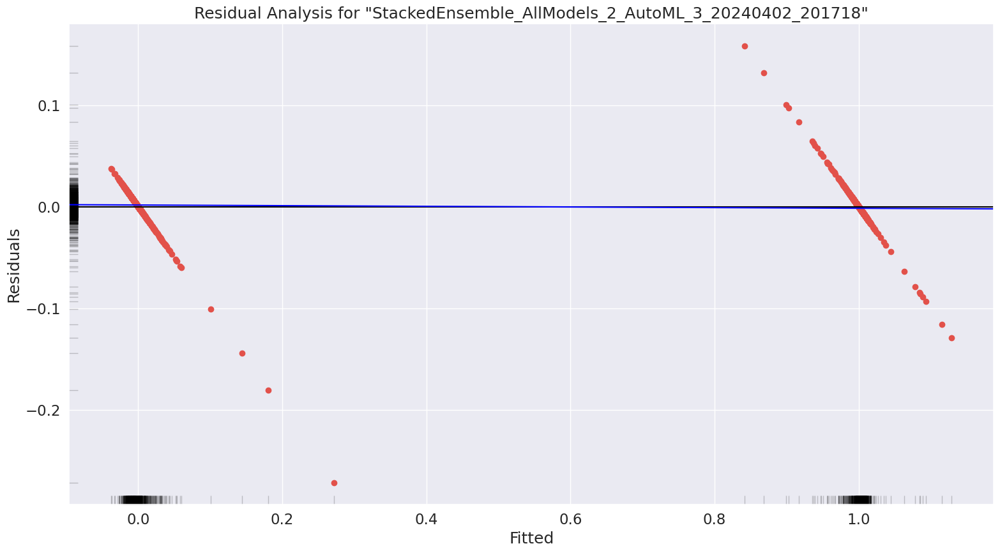

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

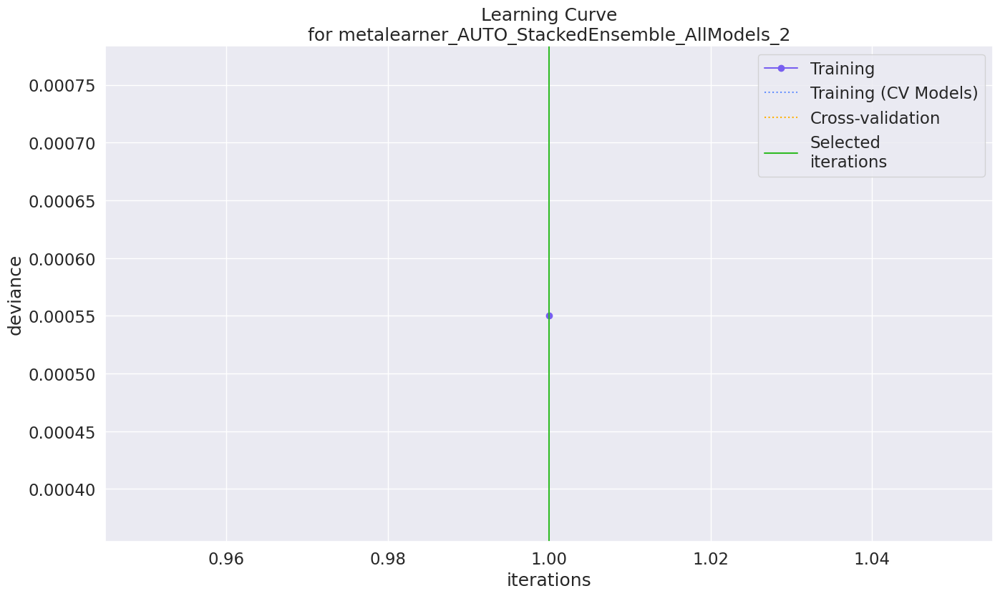

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

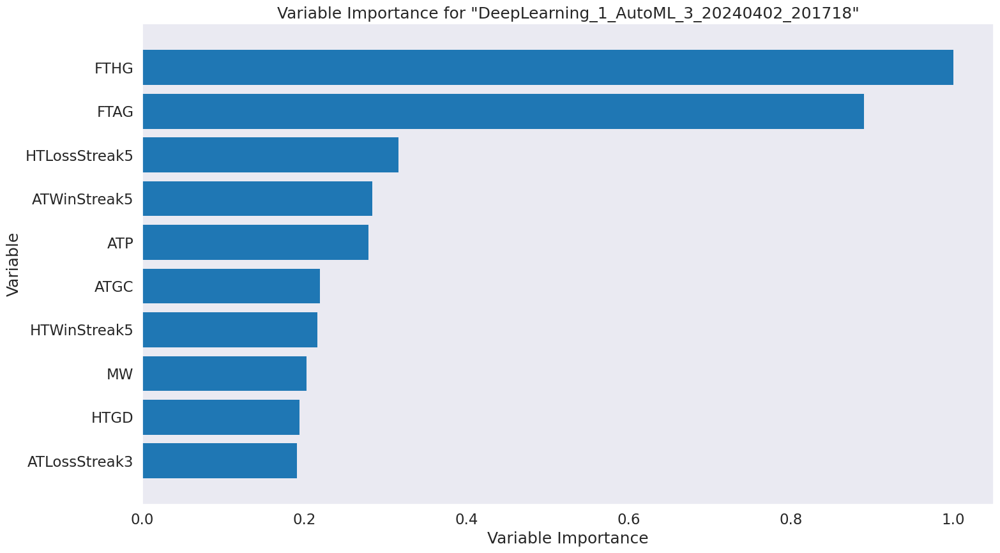

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

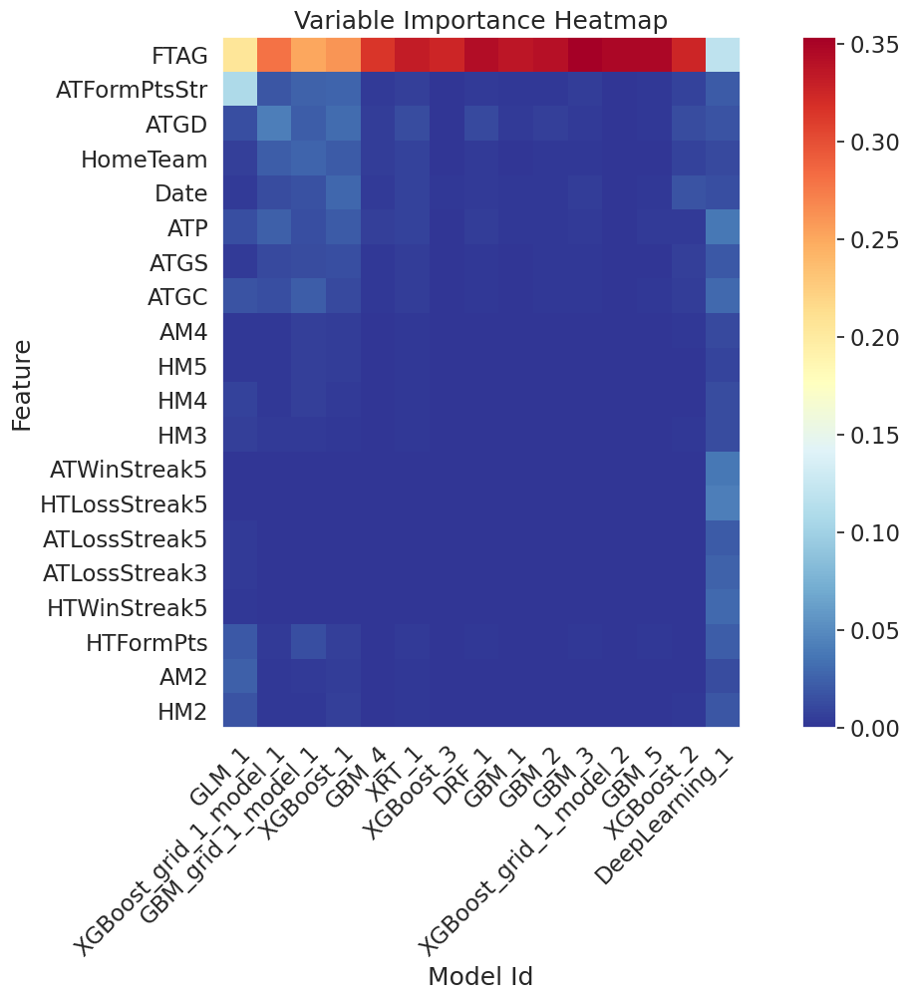

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

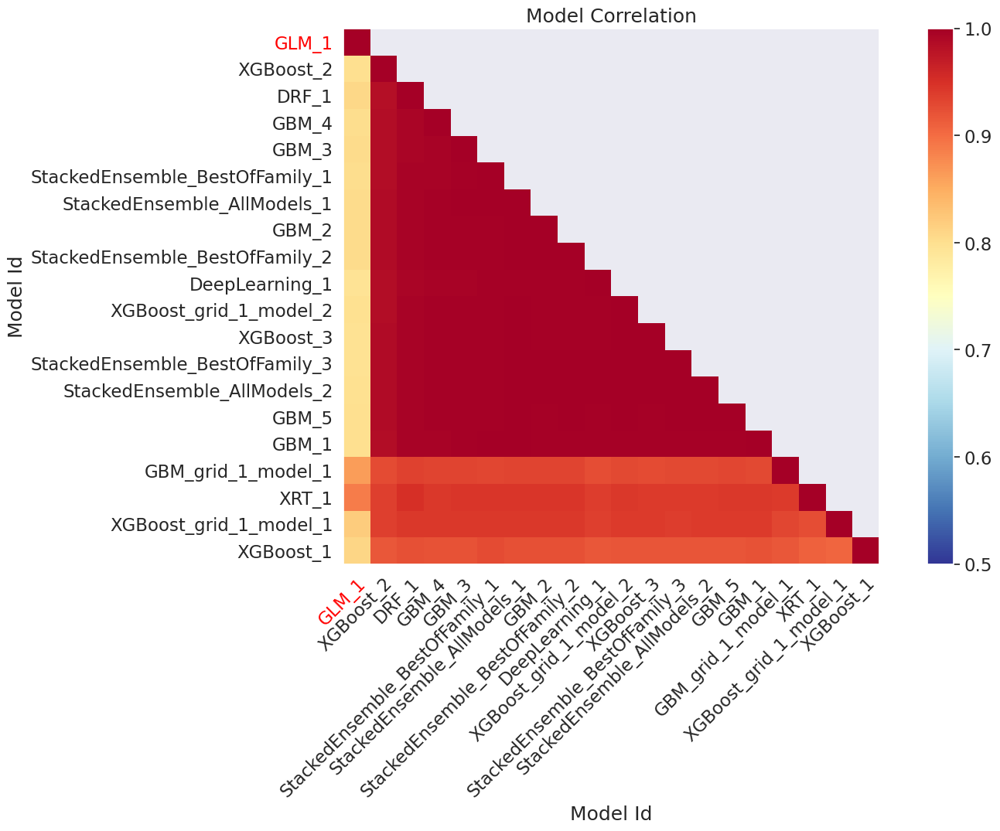

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

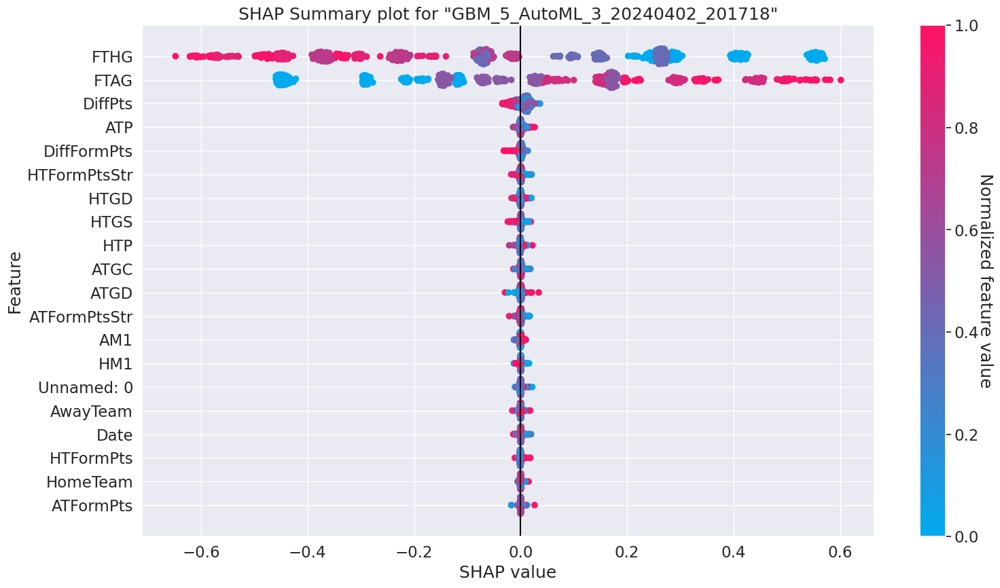

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

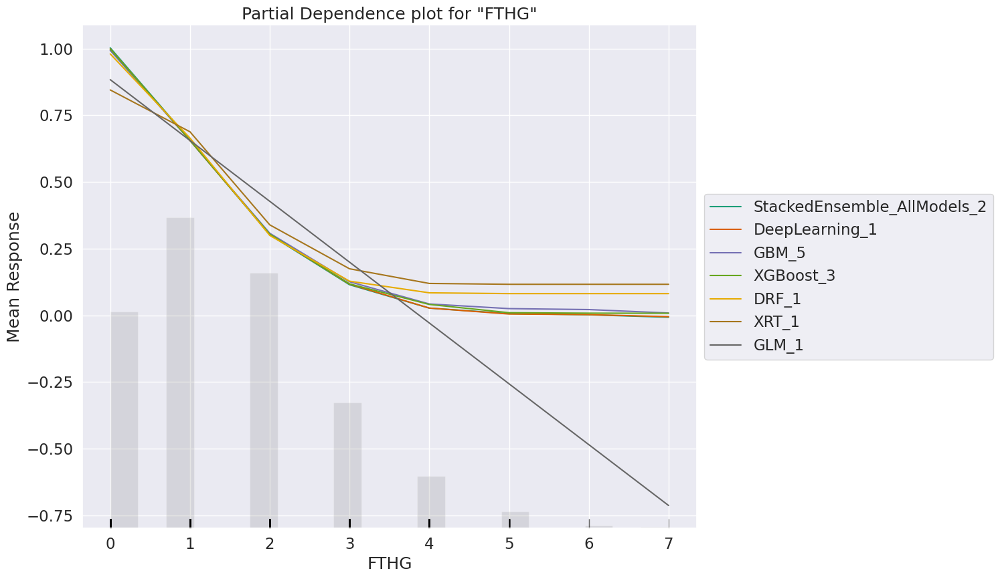

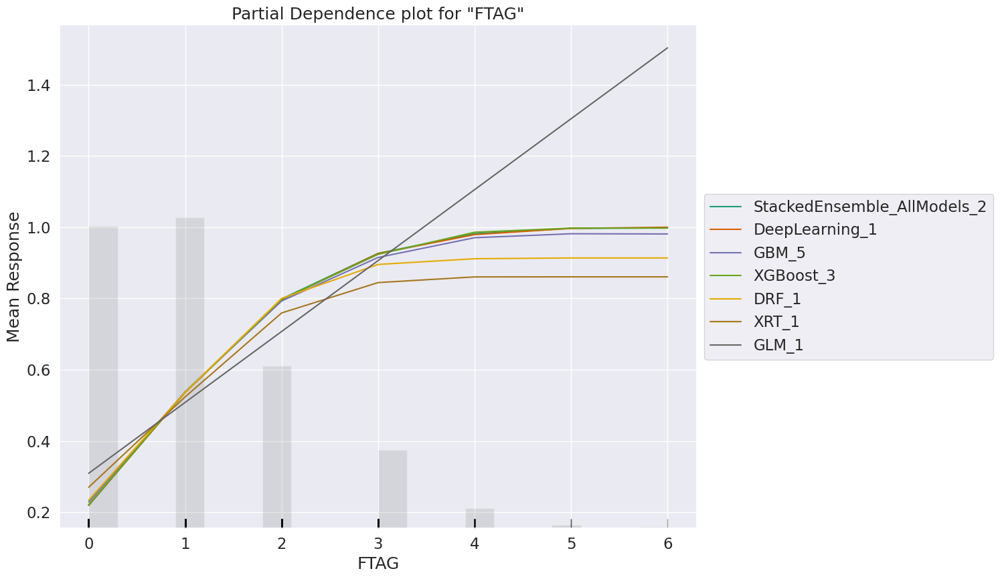

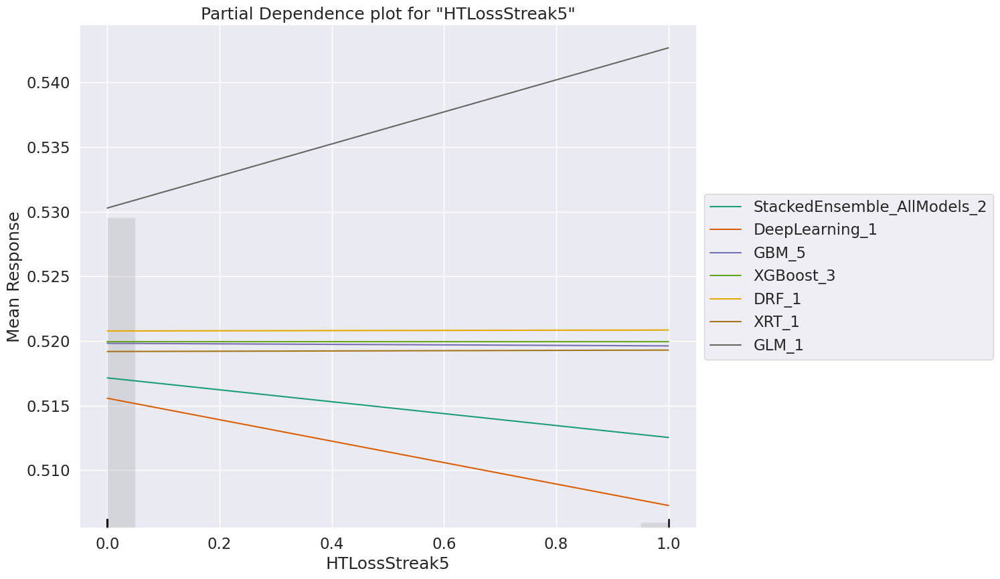

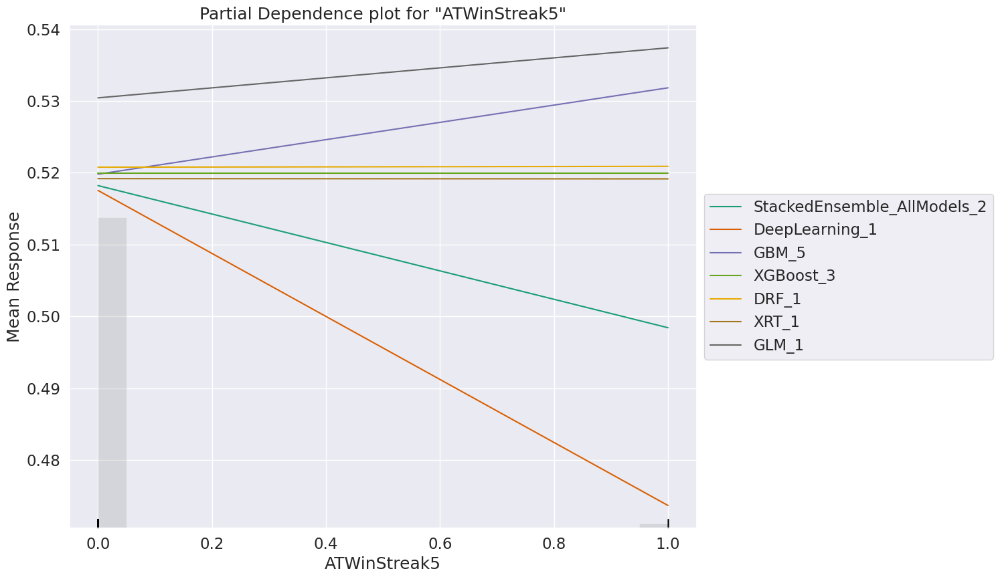

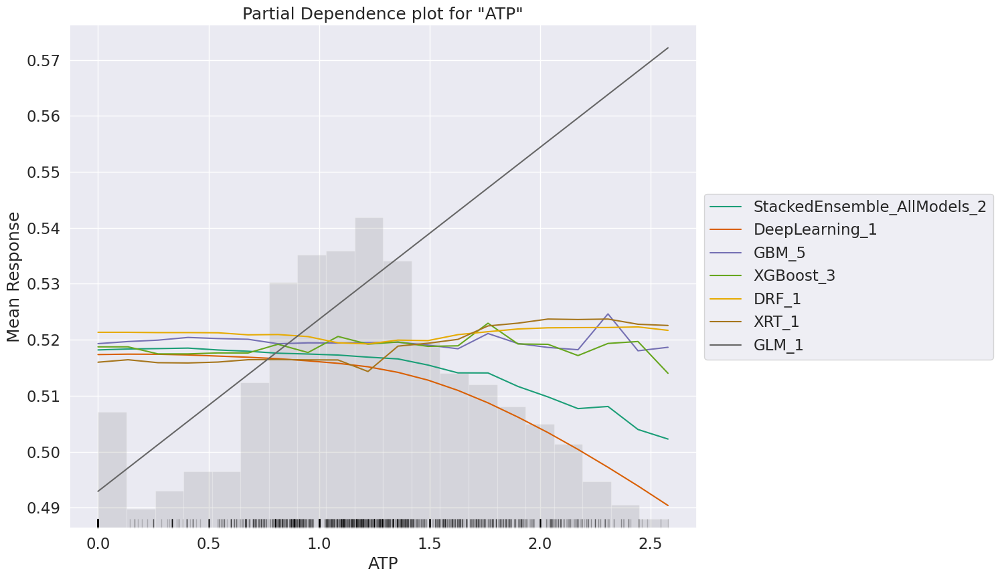

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

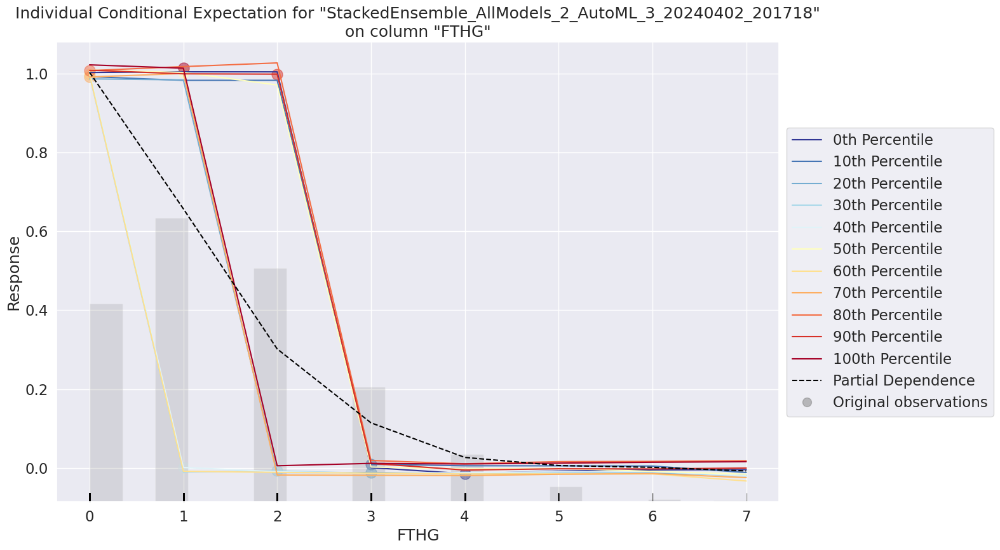

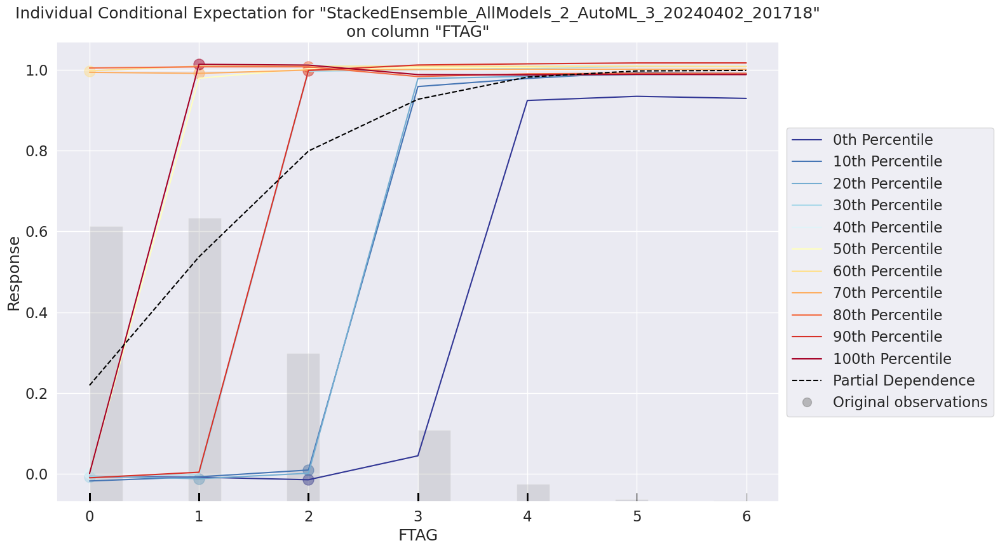

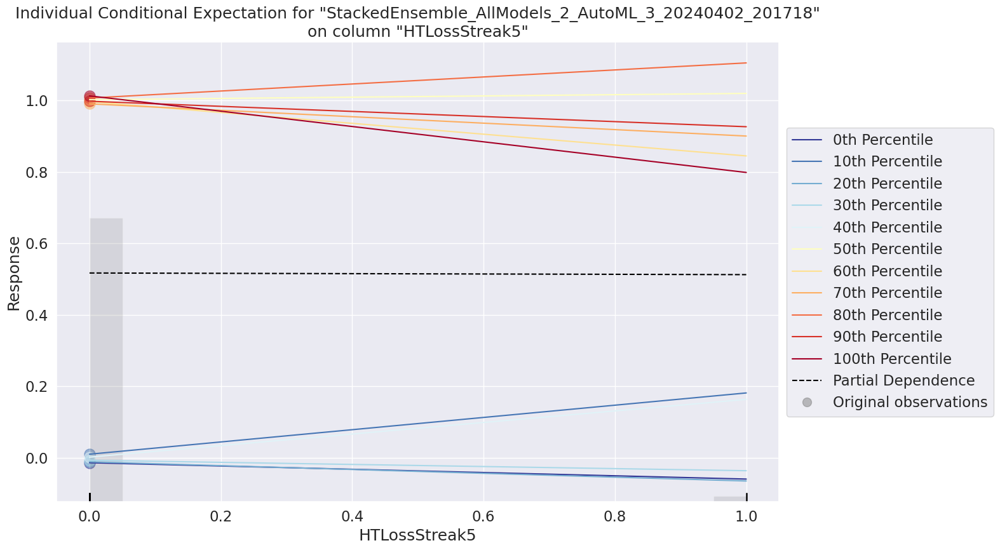

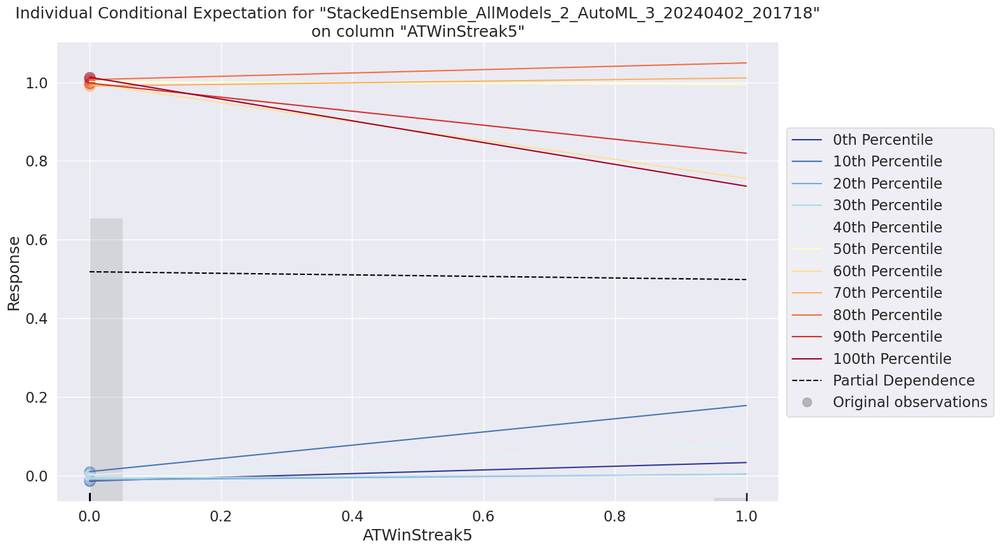

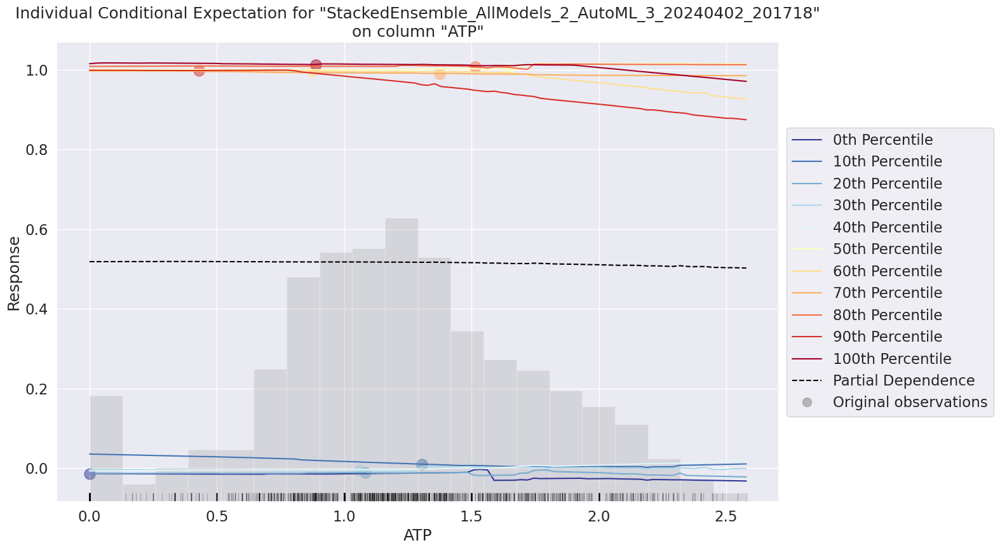

In [147]:
exa = aml.explain(df_test)

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_2_AutoML_3_20240402_201718,0.0192016,0.000368701,0.0107402,0.0148272,0.000368701,2959,0.271194,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_3_20240402_201718,0.0195887,0.000383715,0.0104589,0.0150563,0.000383715,401,0.066188,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_3_20240402_201718,0.0250179,0.000625893,0.0174684,0.0202143,0.000625893,1219,0.297157,StackedEnsemble
XGBoost_grid_1_AutoML_3_20240402_201718_model_2,0.0259007,0.000670844,0.0119196,0.0192334,0.000670844,420,0.005705,XGBoost
DeepLearning_1_AutoML_3_20240402_201718,0.0273949,0.00075048,0.0098604,0.0199166,0.00075048,670,0.009059,DeepLearning
GBM_5_AutoML_3_20240402_201718,0.0290042,0.000841241,0.0188588,0.0236666,0.000841241,1965,0.047367,GBM
XGBoost_3_AutoML_3_20240402_201718,0.0290073,0.000841424,0.0152857,0.0235317,0.000841424,1343,0.008886,XGBoost
StackedEnsemble_BestOfFamily_2_AutoML_3_20240402_201718,0.0298367,0.000890229,0.0224489,0.0240239,0.000890229,539,0.095429,StackedEnsemble
GBM_2_AutoML_3_20240402_201718,0.0346144,0.00119815,0.0252884,0.0278915,0.00119815,3242,0.060297,GBM
GBM_1_AutoML_3_20240402_201718,0.0346275,0.00119906,0.0185832,0.0277157,0.00119906,9293,0.162052,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

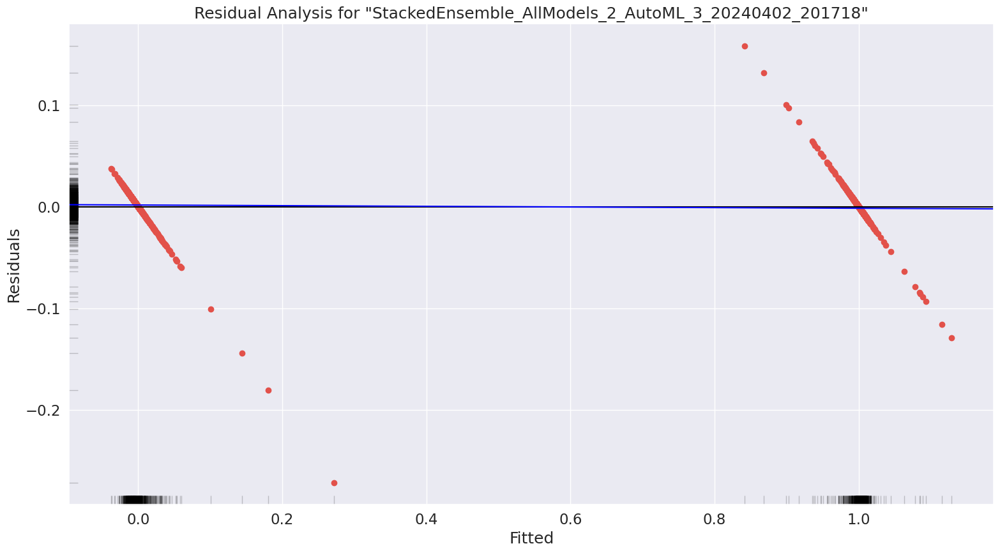

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

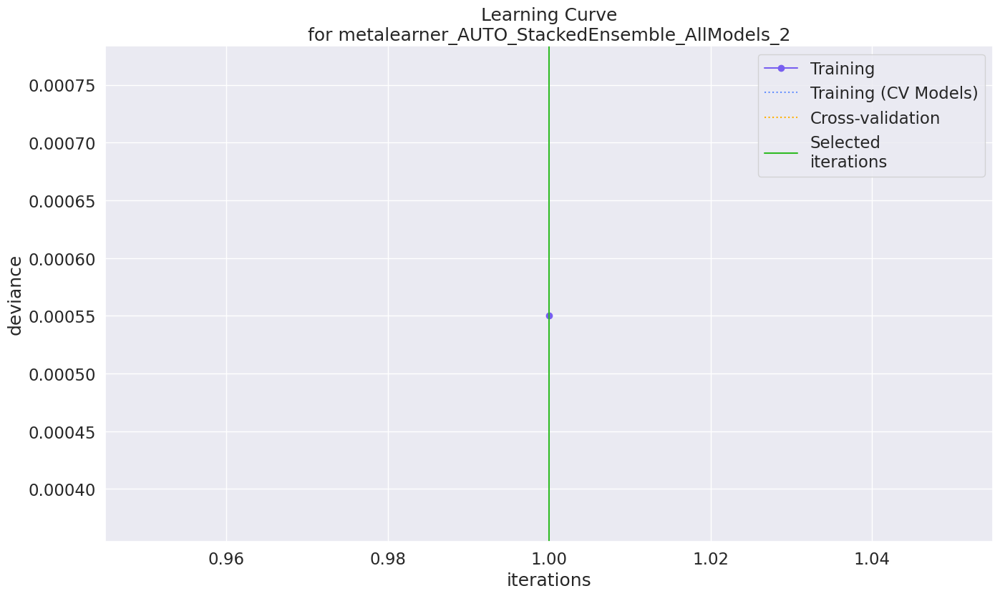

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

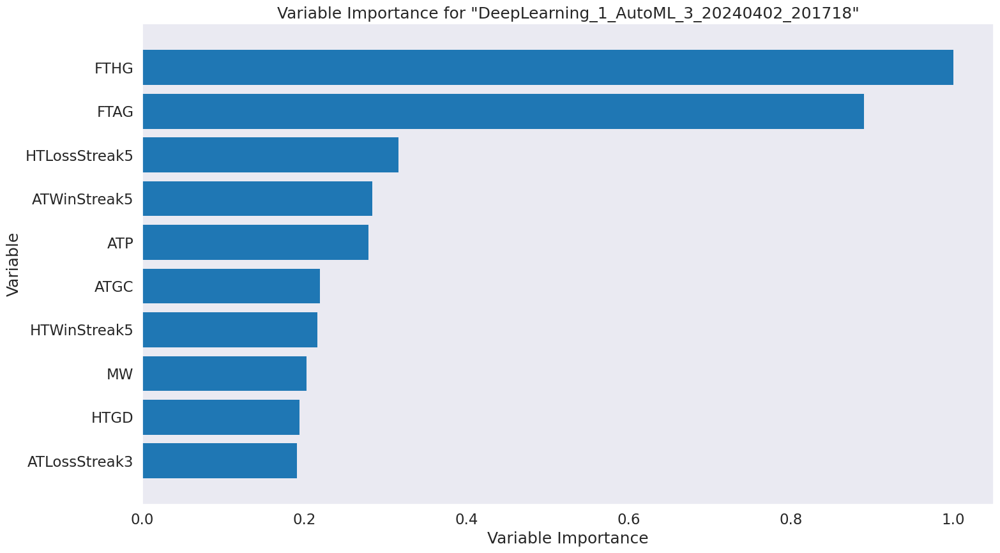

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

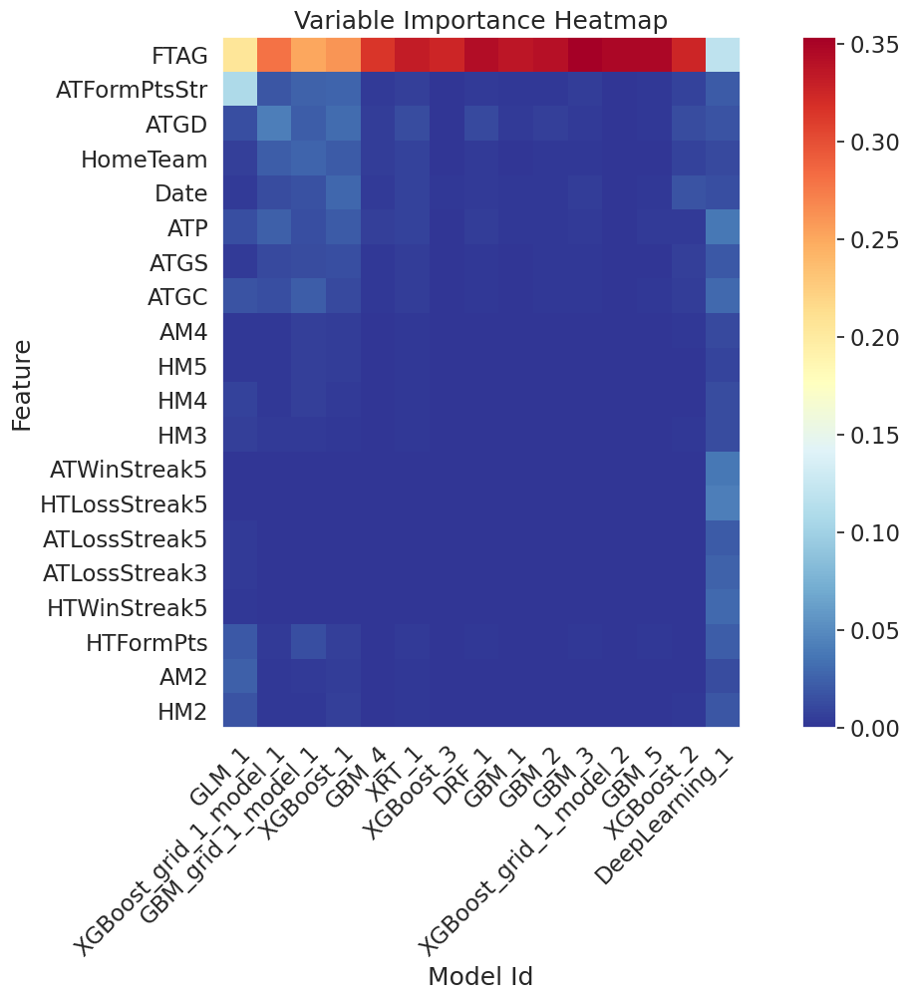

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

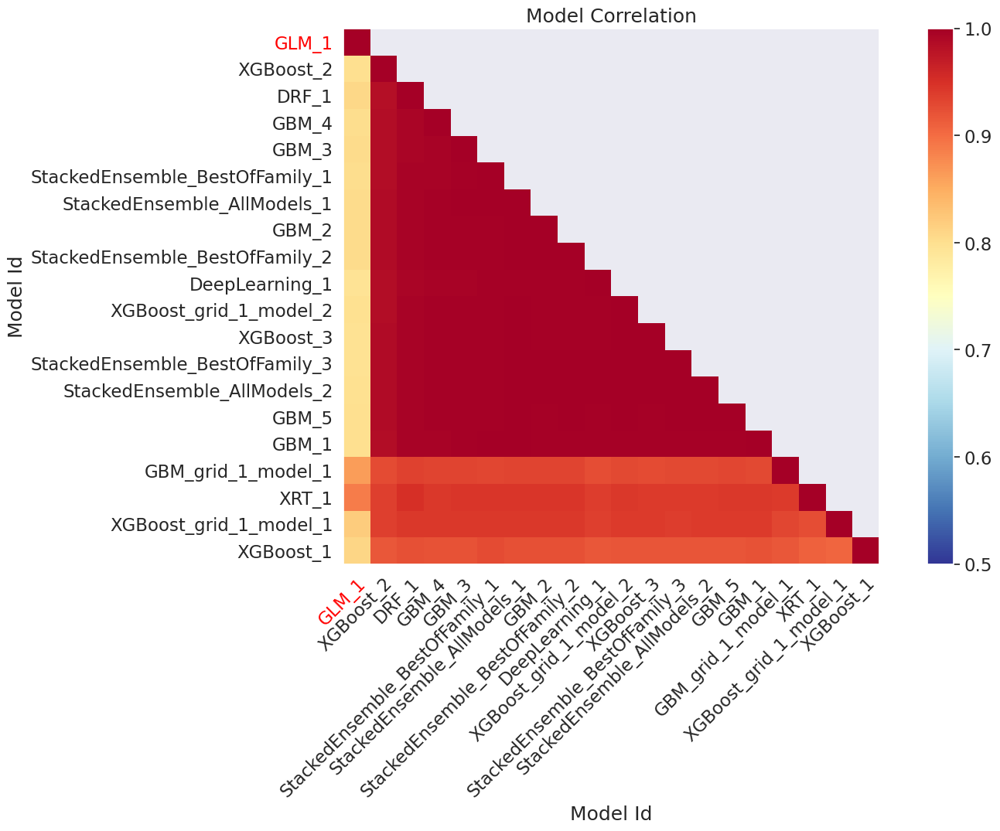

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

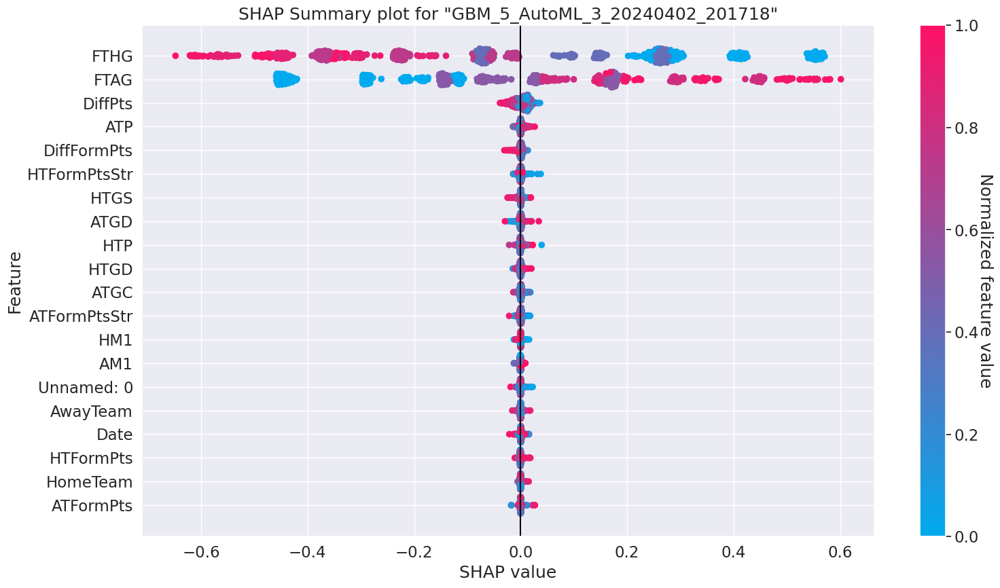

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

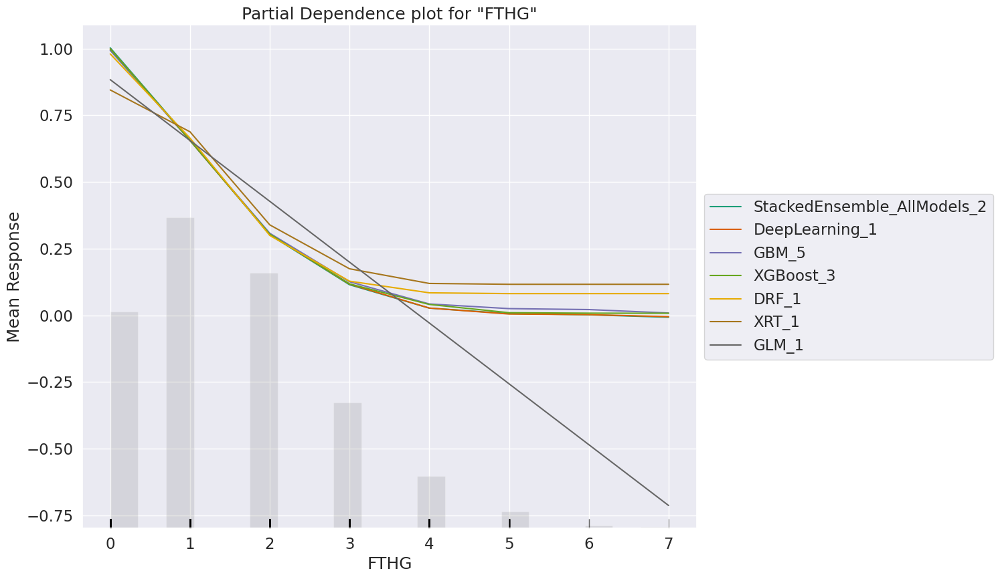

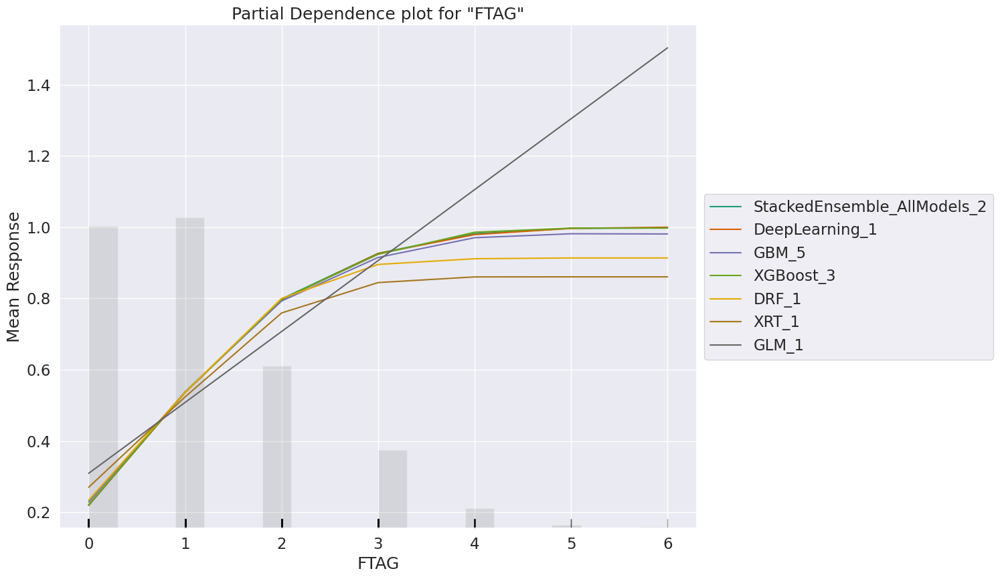

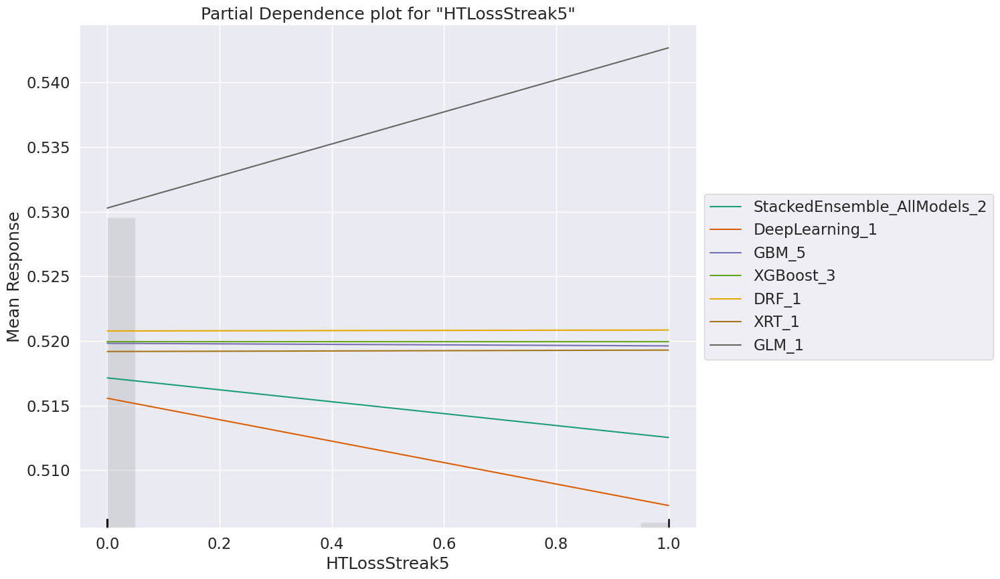

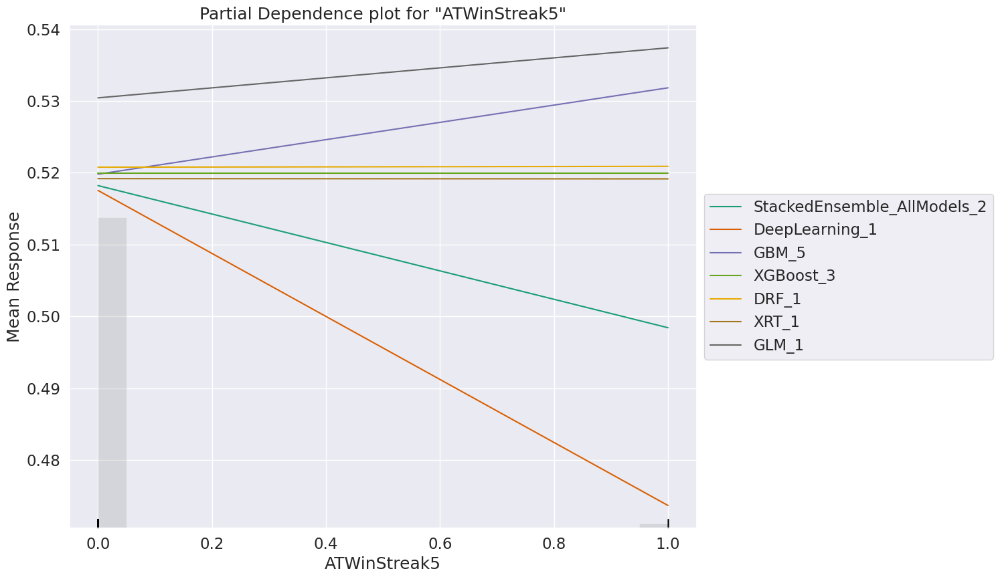

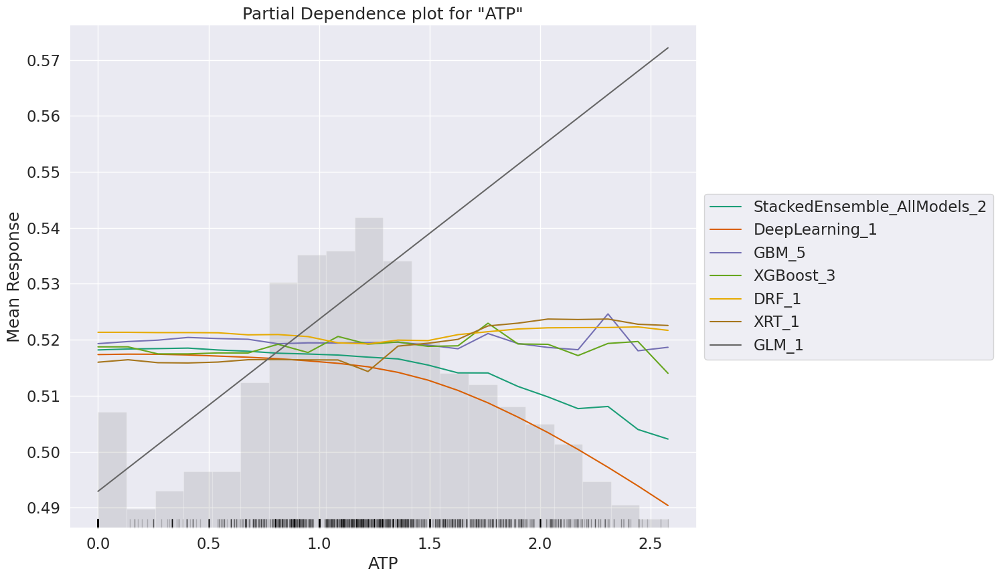

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

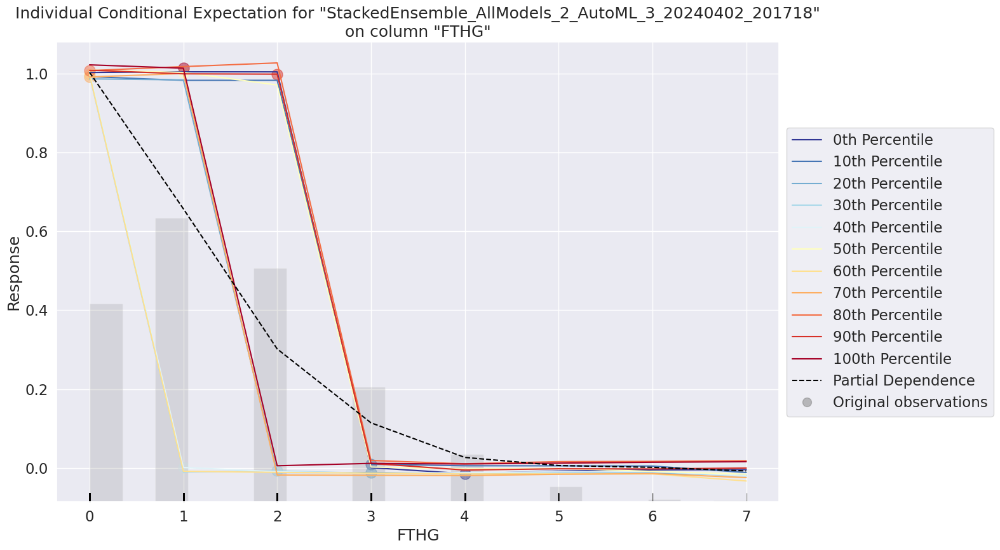

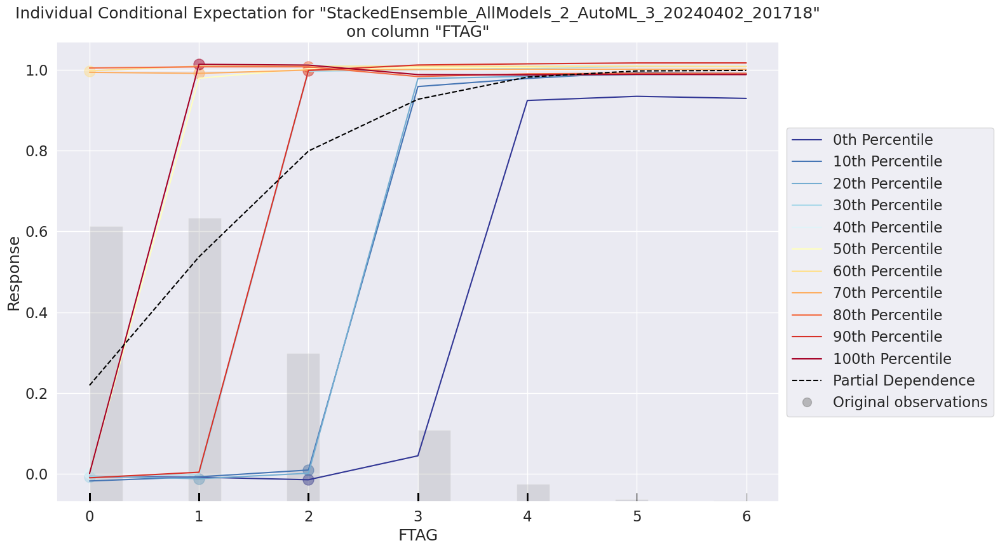

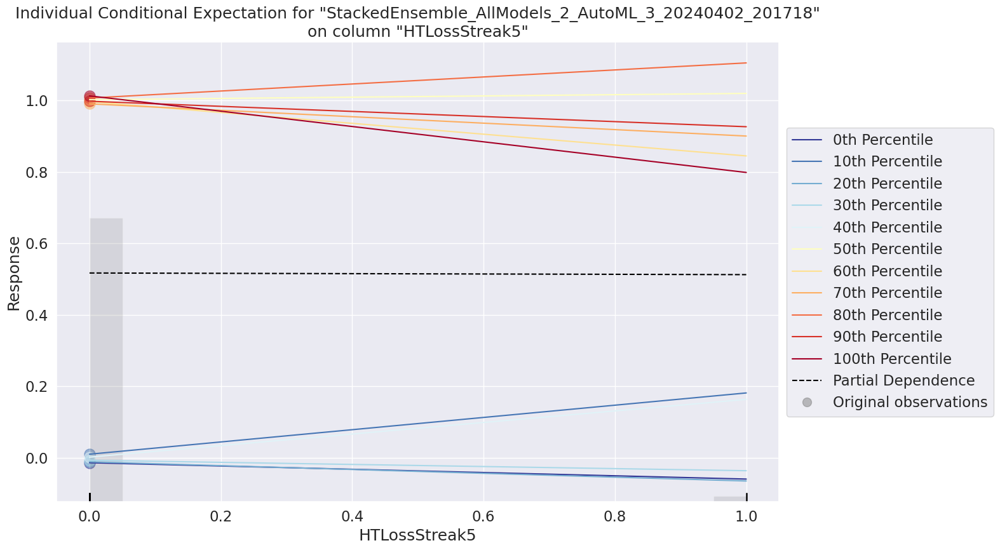

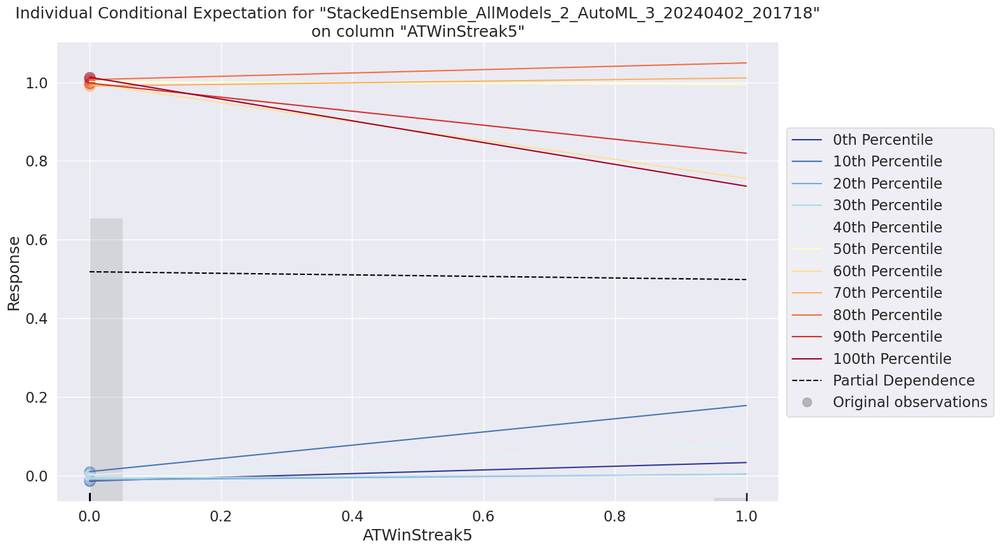

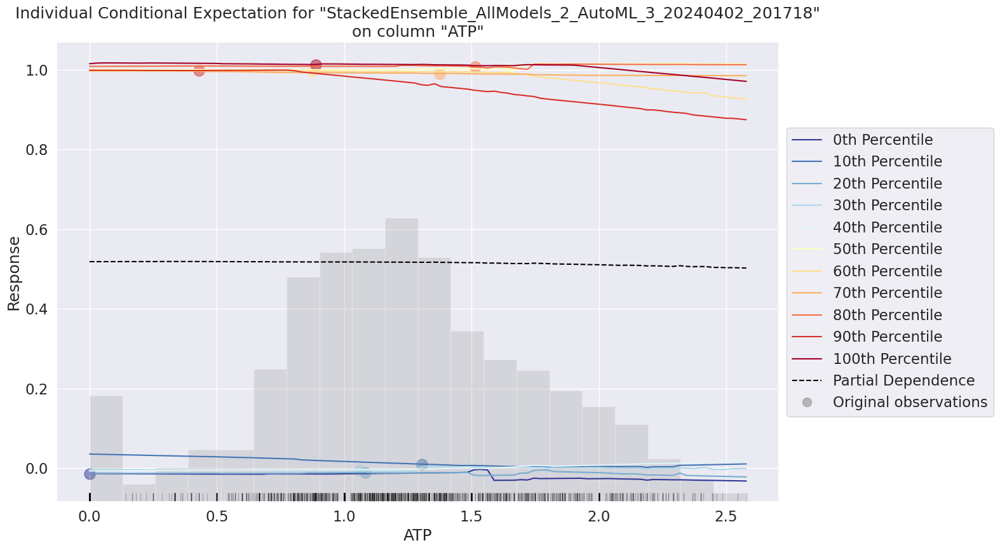

In [148]:
exa = aml.explain(df_test)

# Checking if assumptions violated

Checking if the model has violated any assumptions. For linear regression some of the assumptions are:

(1)There needs to be linear relation between the independent and dependent variable.

(2)Homoscedasticity which means normality of the error distribution.The plot for residuals against target variable should be normally distributed.

(3)Thirdly, linear regression assumes that there is little or no multicollinearity in the data. Multicollinearity occurs when the independent variables are too highly correlated with each other.

(4)There should be no or little auto correlation. One way to test this is by Durbin-Watson test. The values should be brtween 1.5-2.5 for no autocorrelation.

In [149]:
#Seperating the predictor and target variables
A=dff.drop(['FTR'],axis=1)
B=dff['FTR']

In [150]:
#Splitting the data
A_train,A_test,b_train,b_test=tts(A,B,test_size=0.2,random_state=42)

In [151]:
cols1 = ['HTGS','ATGS','HTGC','ATGC','HTP','ATP','HTGD','ATGD','DiffPts','DiffFormPts']
model1 = sm.OLS(b_train,sm.add_constant(A_train[cols1])).fit()

In [152]:
b_pred = model1.predict(sm.add_constant(A_train[cols1]))

In [153]:
residuals = b_train-b_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals 1.745192684323053e-15


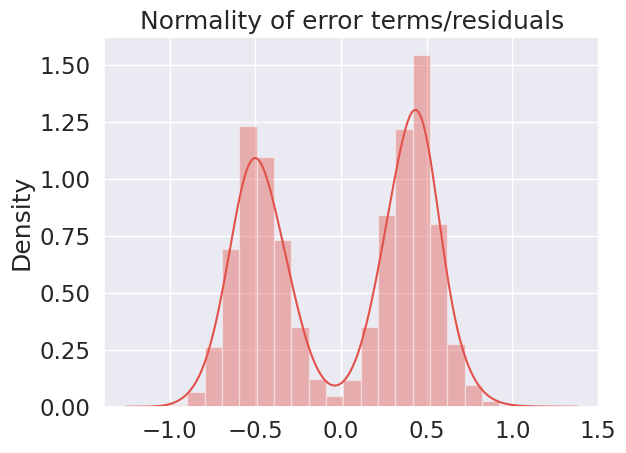

In [154]:
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

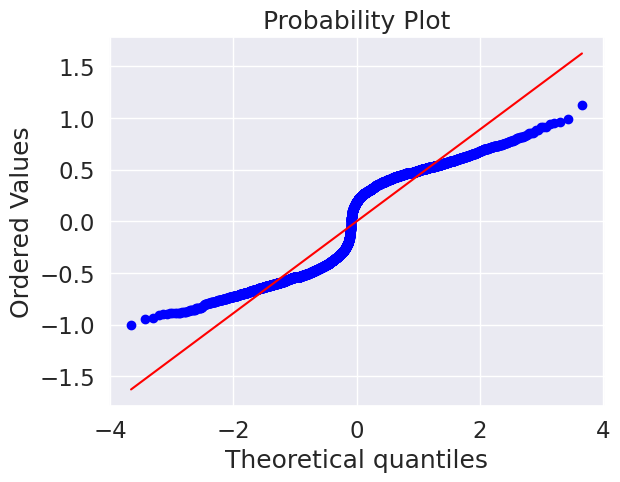

In [155]:
import pylab
import scipy.stats as stats
stats.probplot(residuals, dist="norm", plot=pylab)
pylab.show()

<Axes: xlabel='FTR', ylabel='Count'>

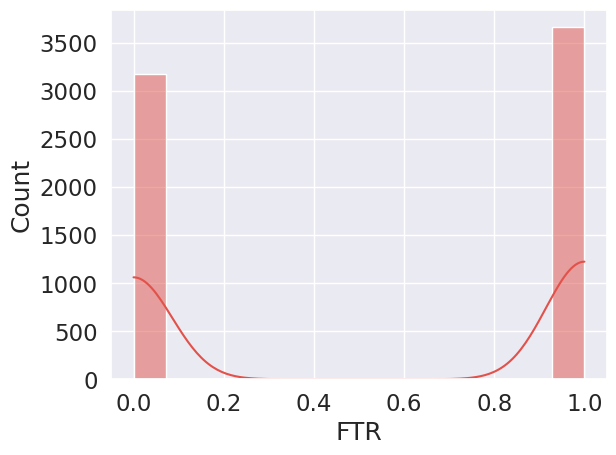

In [156]:
sns.histplot(dff.FTR, kde = True)

# Analysing relation between all variables

VIF stands for Variance Inflation Factor.It signifies multicollinearity among set of different independent variable. A value greater than 10 means that the independent variable is highly correlated with some other variable. Will calculate VIF value for all variables to check the dependency and then will drop the variables with high VIF value.


In [157]:
import statsmodels.formula.api as smf  # OLS model Library

In [158]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Indicate which variables to compute VIF
Multic = dff[['HTGS','ATGS','HTGC','ATGC','HTP','ATP','HTGD','ATGD','DiffPts','DiffFormPts']]
#Compute VIF
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]
vif

,variables,VIF
0,HTGS,27.083527
1,ATGS,27.557692
2,HTGC,30.138897
3,ATGC,30.404832
4,HTP,inf
5,ATP,inf
6,HTGD,6.786647
7,ATGD,6.862551
8,DiffPts,inf
9,DiffFormPts,4.346425


In [159]:
import h2o

pandas_df = h2o.as_list(df)

Ordinary least squares (OLS) regression is a statistical method of analysis used for multivariate model that estimates the relationship between one or more independent variables and a dependent variable; the method estimates the relationship by minimizing the sum of the squares in the difference between the observed and predicted values of the dependent variable.

In [160]:
results = smf.ols(
    "FTR ~ HTGS + ATGS + HTGC + HTP + ATP + HTGD + ATGD + DiffPts + DiffFormPts" ,
    data=pandas_df,
).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    FTR   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     99.07
Date:                Tue, 02 Apr 2024   Prob (F-statistic):          1.12e-156
Time:                        20:34:29   Log-Likelihood:                -4571.5
No. Observations:                6840   AIC:                             9161.
Df Residuals:                    6831   BIC:                             9223.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.5450      0.027     20.287      0.000       0.492       0.598
HTGS           -0.0054      0.001     -5.400      0.000      -0.007      -0.003
ATGS            0.0032      0.001      3.678      0.000       0.002       0.005
HTGC            0.0015      0.001      1.597      0.110      -0.000       0.003
HTP            -0.0206      0.015     -1.345      0.179      -0.051       0.009
ATP             0.0230      0.016      1.480      0.139      -0.007       0.053
HTGD           -0.0542      0.023     -2.407      0.016      -0.098      -0.010
ATGD            0.0776      0.019      4.010      0.000       0.040       0.116
DiffPts        -0.0436      0.018     -2.412      0.016      -0.079      -0.008
DiffFormPts    -0.0006      0.026     -0.025      0.980      -0.051       0.050
==============================================================================
Omnibus:                    34612.263   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              742.031
Skew:                          -0.130   Prob(JB):                    7.41e-162
Kurtosis:                       1.408   Cond. No.                     2.12e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.79e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

**Re-executing AutoML with Reduced columns**

Removing [HTP, ATP, DiffPts, DiffFormPts]

In [161]:
reduced_data = df.drop(['HTP', 'ATP', 'DiffPts', 'DiffFormPts'], axis=1)

# Display the first few rows of the updated dataset to confirm the changes
reduced_data.head()

Unnamed: 0,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,ATGC,HM1,HM2,HM3,HM4,HM5,AM1,AM2,AM3,AM4,AM5,MW,HTFormPtsStr,ATFormPtsStr,HTFormPts,ATFormPts,HTWinStreak3,HTWinStreak5,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD
0,1065,11,24,4,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
1,1065,12,41,4,2,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
2,1065,13,27,1,3,1,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
3,1065,15,34,2,2,1,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
4,1065,21,16,2,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
5,1065,22,1,0,0,1,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
6,1065,23,7,1,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
7,1065,36,0,1,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
8,1065,38,20,3,1,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
9,1126,25,28,2,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0


In [162]:
hf1 = h2o.H2OFrame(reduced_data)

In [163]:
train1, valid1, test1 = hf1.split_frame(ratios=[.7, .15], seed=1234)
# Summary of the split
print("Training set:", train1.shape)
print("Validation set:", valid1.shape)
print("Test set:", test1.shape)

Training set: (4798, 36)
Validation set: (1013, 36)
Test set: (1029, 36)


In [164]:
from h2o.automl import H2OAutoML

# Define X (features) and y (target)
y1 = 'FTR'
X1 = hf.columns
X1.remove(y1)

X1.remove('HTP')  # Ensuring there are no removed columns in the new features
X1.remove('ATP')
X1.remove('DiffPts')
X1.remove('DiffFormPts')

# Run AutoML
# Run AutoML for 10 base models (limited to 1 hour max runtime by default)
aml1 = H2OAutoML(max_models=10, seed=1234)
aml1.train(x=X1, y=y1, training_frame=train1, validation_frame=valid1, leaderboard_frame=test1)

AutoML progress: |
20:35:34.501: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.
20:35:34.511: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
20:35:48.63: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
20:35:49.165: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

████
20:3

key,value
Stacking strategy,cross_validation
Number of base models (used / total),7/10
# GBM base models (used / total),4/4
# XGBoost base models (used / total),3/3
# DRF base models (used / total),0/2
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [165]:
#View all models
leaderboard1 = aml1.leaderboard
leaderboard1.head()

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_1_AutoML_4_20240402_203534,0.0335015,0.00112235,0.0151345,0.0261929,0.00112235
StackedEnsemble_BestOfFamily_1_AutoML_4_20240402_203534,0.0336912,0.0011351,0.0154076,0.0264858,0.0011351
GBM_2_AutoML_4_20240402_203534,0.0364181,0.00132628,0.0172848,0.0279132,0.00132628
GBM_1_AutoML_4_20240402_203534,0.0391905,0.00153589,0.0172156,0.0305599,0.00153589
XGBoost_3_AutoML_4_20240402_203534,0.0400655,0.00160524,0.0204125,0.0317725,0.00160524
XGBoost_2_AutoML_4_20240402_203534,0.0428827,0.00183893,0.0239616,0.0337149,0.00183893
GBM_3_AutoML_4_20240402_203534,0.0471174,0.00222005,0.0285266,0.0350757,0.00222005
GBM_4_AutoML_4_20240402_203534,0.0474725,0.00225364,0.0288653,0.0364878,0.00225364
DRF_1_AutoML_4_20240402_203534,0.0604132,0.00364976,0.0303013,0.0454926,0.00364976
XGBoost_1_AutoML_4_20240402_203534,0.094462,0.00892306,0.0720458,0.0712163,0.00892306


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_1_AutoML_4_20240402_203534,0.0335015,0.00112235,0.0151345,0.0261929,0.00112235,2437,0.54259,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_4_20240402_203534,0.0336912,0.0011351,0.0154076,0.0264858,0.0011351,1401,0.073457,StackedEnsemble
GBM_2_AutoML_4_20240402_203534,0.0364181,0.00132628,0.0172848,0.0279132,0.00132628,1626,0.054428,GBM
GBM_1_AutoML_4_20240402_203534,0.0391905,0.00153589,0.0172156,0.0305599,0.00153589,10783,0.200463,GBM
XGBoost_3_AutoML_4_20240402_203534,0.0400655,0.00160524,0.0204125,0.0317725,0.00160524,1117,0.008408,XGBoost
XGBoost_2_AutoML_4_20240402_203534,0.0428827,0.00183893,0.0239616,0.0337149,0.00183893,4064,0.010923,XGBoost
GBM_3_AutoML_4_20240402_203534,0.0471174,0.00222005,0.0285266,0.0350757,0.00222005,1971,0.051595,GBM
GBM_4_AutoML_4_20240402_203534,0.0474725,0.00225364,0.0288653,0.0364878,0.00225364,2895,0.057485,GBM
DRF_1_AutoML_4_20240402_203534,0.0604132,0.00364976,0.0303013,0.0454926,0.00364976,1172,0.021035,DRF
XGBoost_1_AutoML_4_20240402_203534,0.094462,0.00892306,0.0720458,0.0712163,0.00892306,1798,0.016683,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

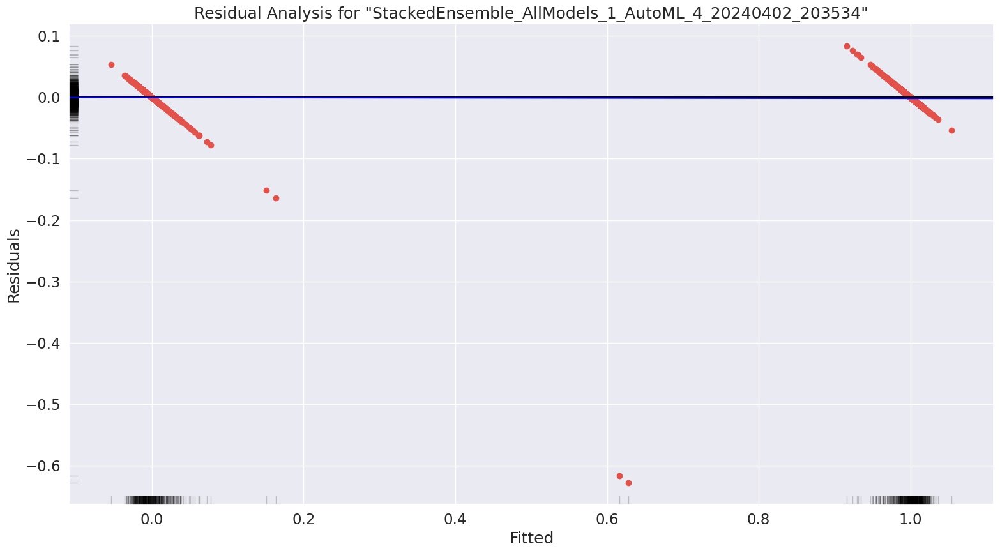

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

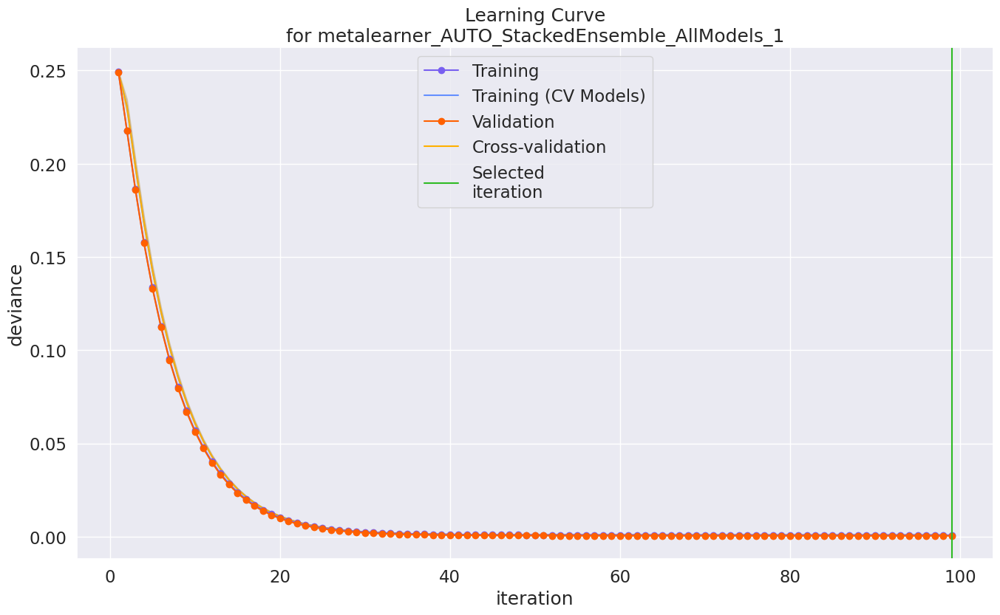

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

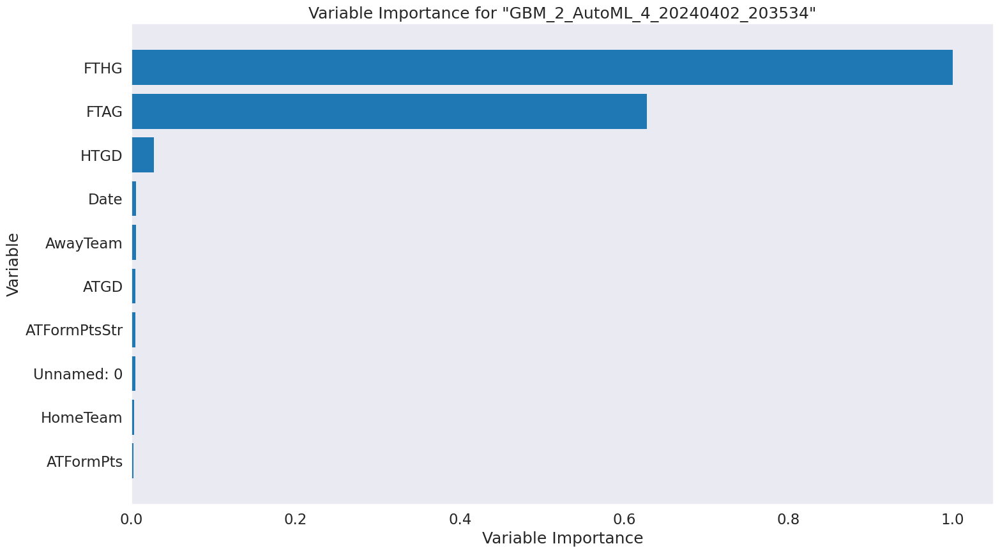

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

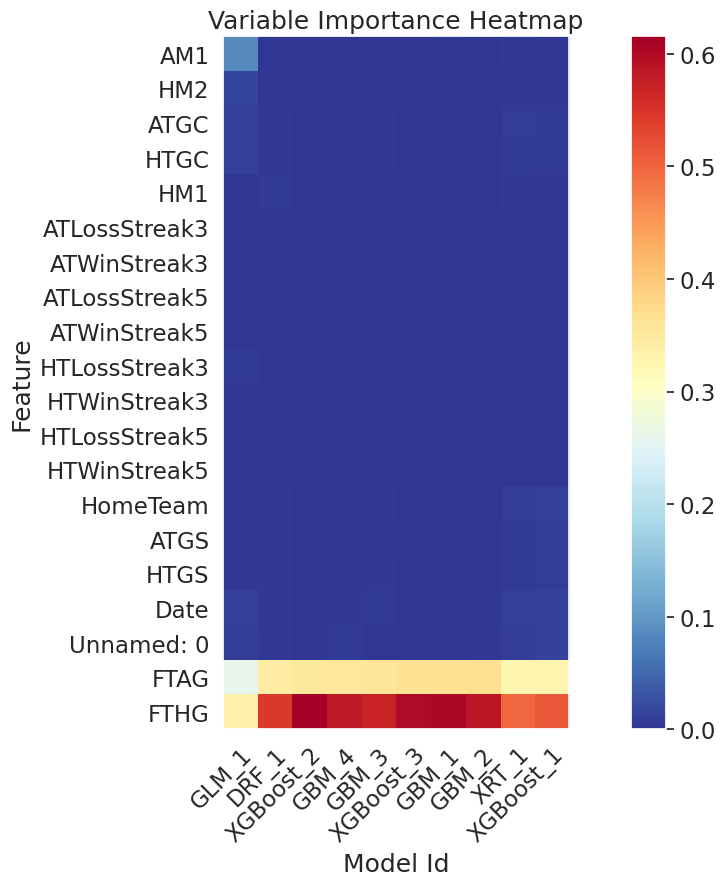

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

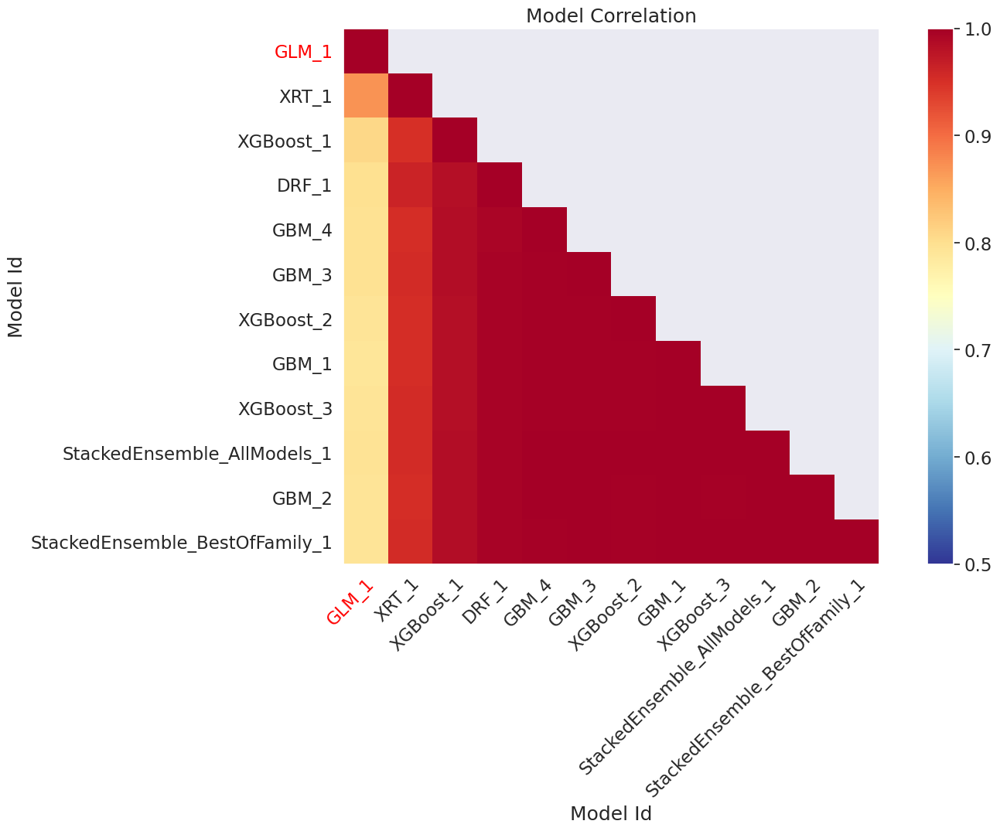

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

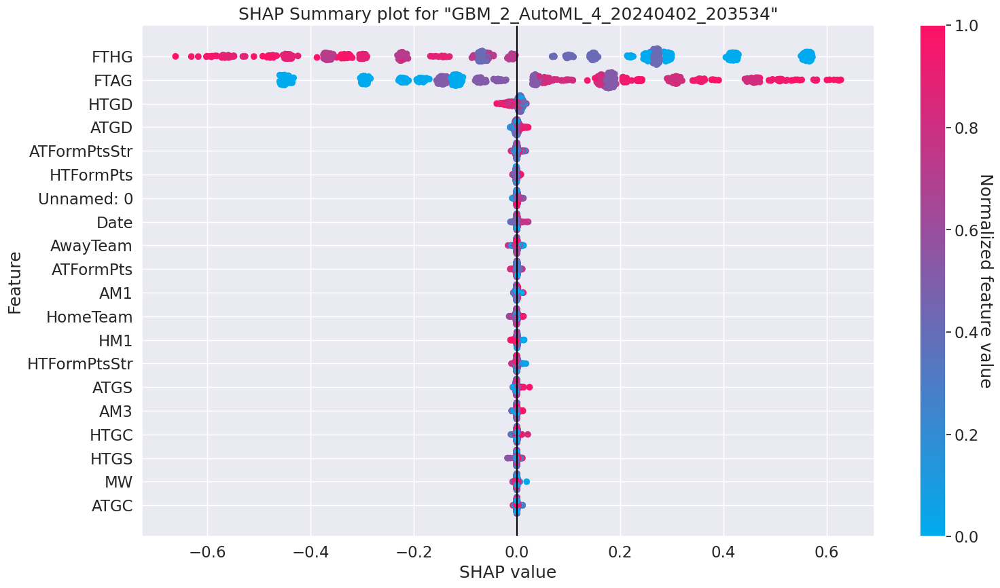

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

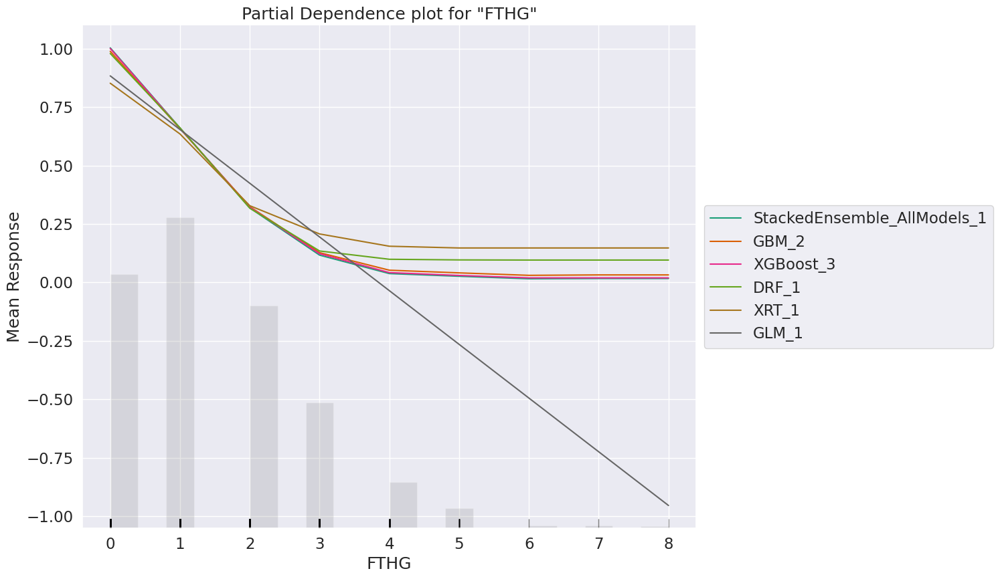

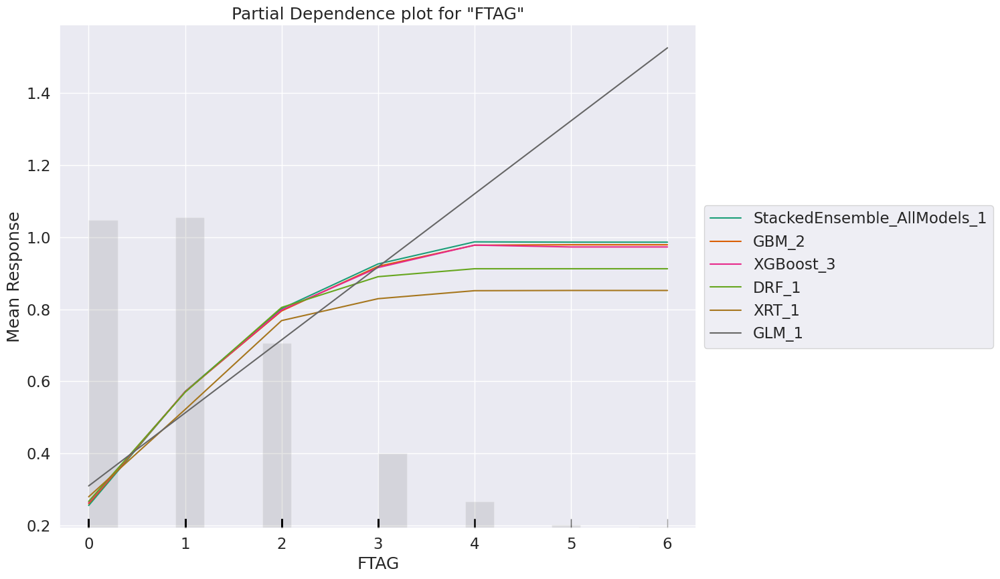

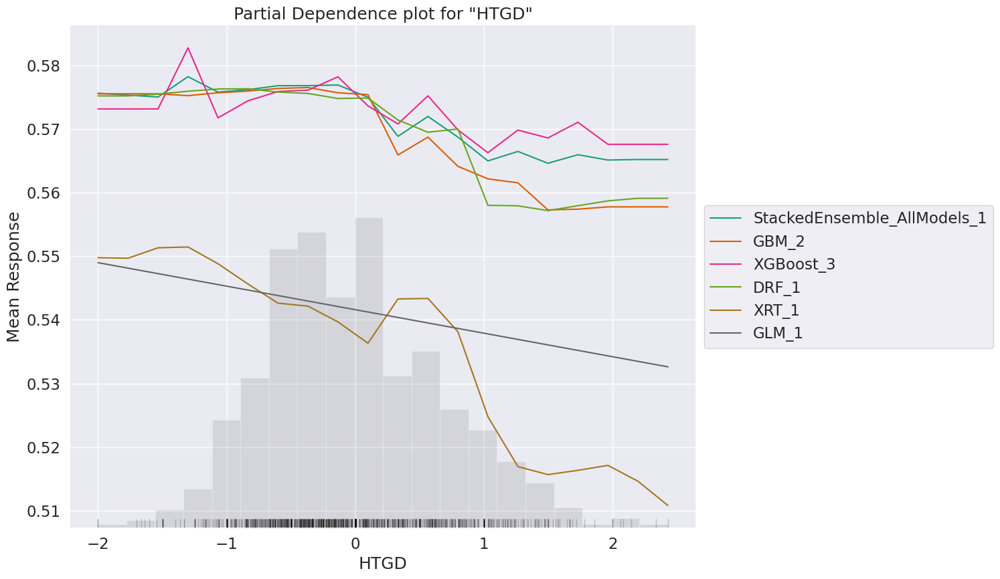

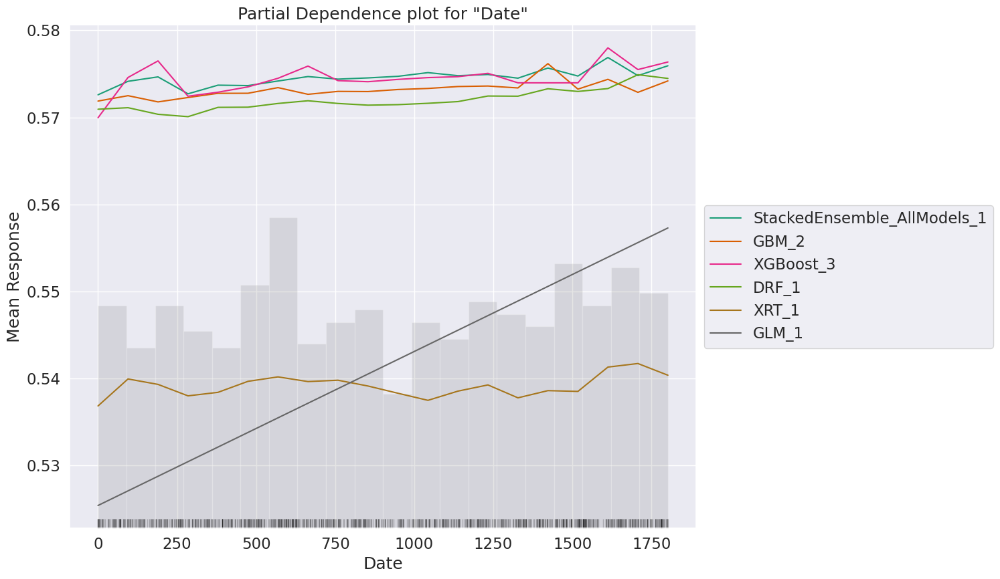

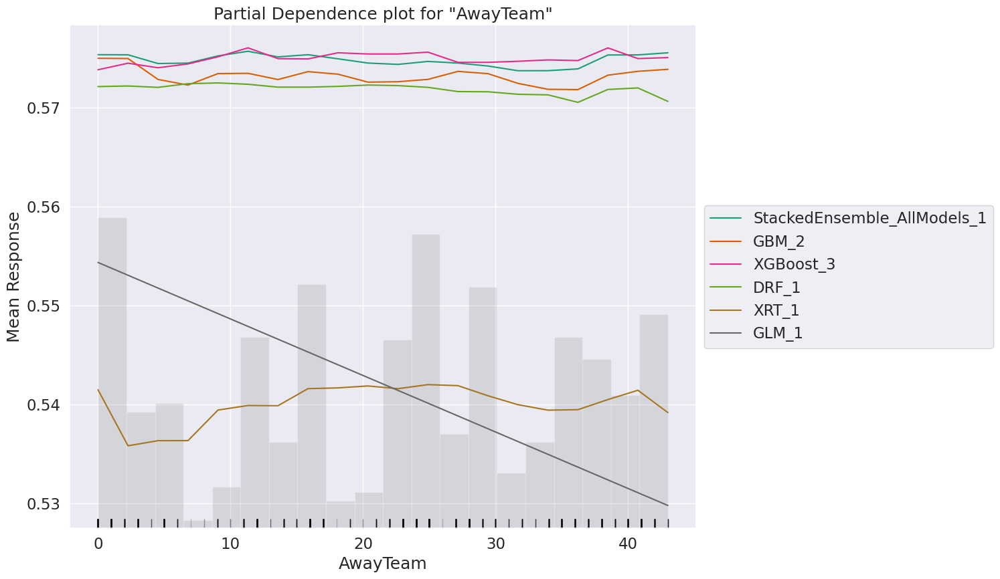

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

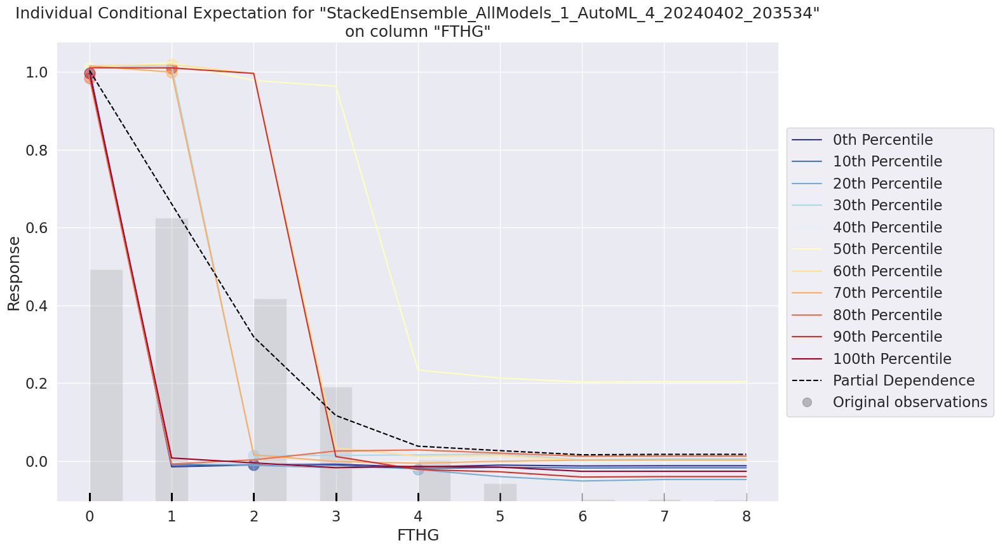

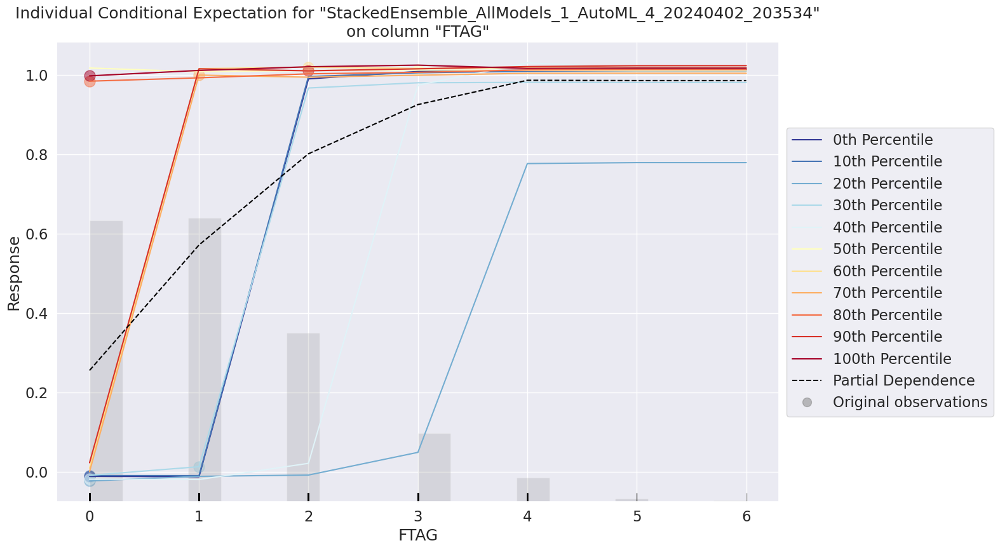

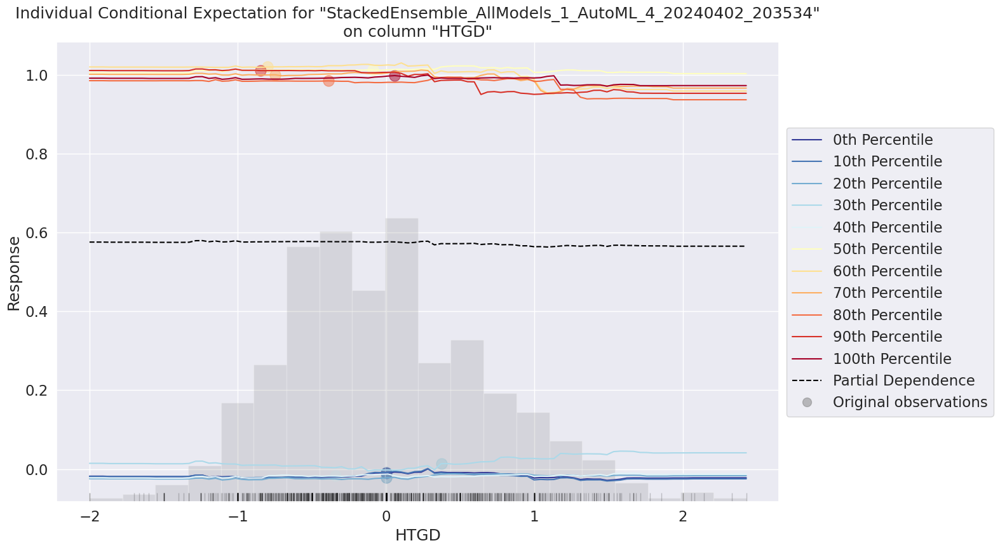

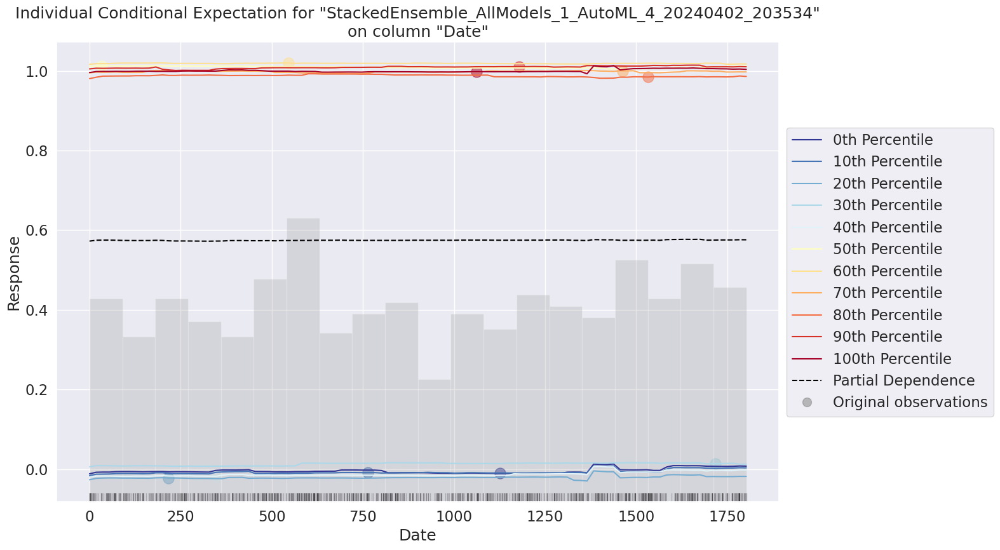

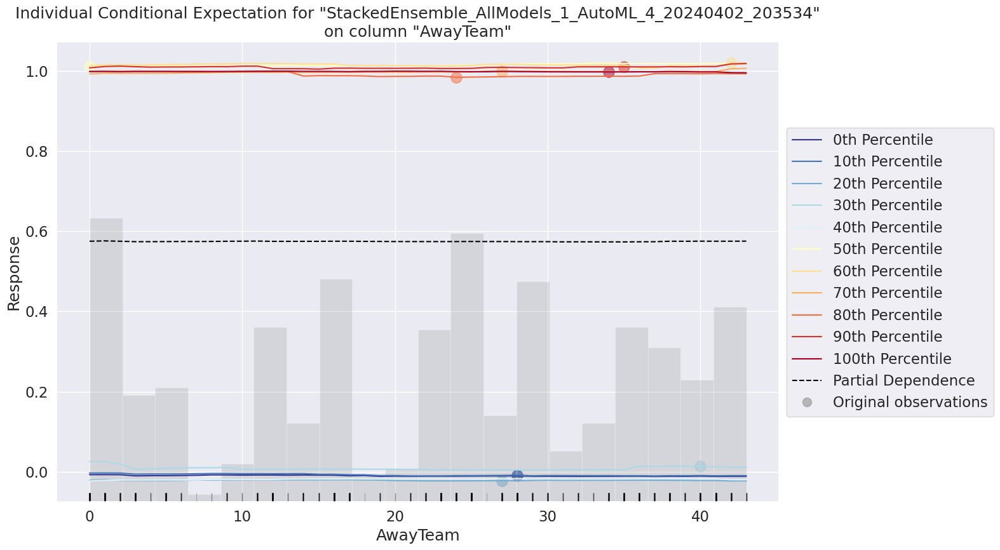

In [166]:
e = aml1.explain(test1)

# Hyperparameter Tuning
To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset.

In [167]:
s = dff['FTR']

t = dff.drop(['FTR'], axis = 1)

In [168]:
import numpy as np

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import RandomizedSearchCV

In [169]:
t_train, t_test, s_train, s_test = train_test_split (t, s, random_state = 101, test_size = 0.2)

Here we use RandomizedSearchCV to get the best params inorder to acheive the optimal results

In [170]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor

mode = RandomForestRegressor()

param_vals = {'max_depth': [200, 500, 800, 1100], 'n_estimators': [100,200, 300, 400], 'min_samples_split' : [2,3,5]

}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals,

n_iter=10, scoring='accuracy', cv=5,

refit=True, n_jobs=-1)

#Training and prediction

random_rf.fit(t_train, s_train)

preds = random_rf.best_estimator_.predict(t_test)

In [171]:
random_rf.best_params_

{'n_estimators': 300, 'min_samples_split': 3, 'max_depth': 1100}

## Conclusion

A regression-based model was developed to forecast hotel prices. To exclude some of the independent variables, tests such as VIF and p-values were taken into account. The H20.ai framework was utilized to train and test the hotel dataset variables on goibibo. The 'gbm' model yielded the highest accuracy of 51% on the test data. The findings indicate that the proposed linear regression model can successfully analyze and predict hotel ratings to a certain degree, but the predictive accuracy is still limited in some cases. Further investigations into alternative models can enhance the model's performance, such as removing outliers and using booster techniques.

**Q1)Is the relationship significant?**

There appears to be a significant relationship between variables which is supported by the high R-squared values obtained in the models and also by the low root mean squared error values in the models.

**Q2)Are any model assumptions violated?**

1.In examining the linear relationship between dependent and independent variables, it is essential to maintain the constancy of other factors. Upon plotting the target variable against each independent variable individually, a linear relationship is evident for several variables while holding others constant. Thus, this assumption remains unviolated.

2.The principle of homoscedasticity, indicating normality in the distribution of errors, is verified by examining the residuals' plot, which should ideally form a bell-shaped curve. In this particular model, this criterion is met satisfactorily.

3.Assessing multicollinearity through correlation analysis reveals some violations of the assumption. Notably, multicollinearity is observed among variables such as HTGD, ATGD, DiffPts, and DiffFormPts.

From this we can say that the assumption is not violated

**Q3)Is there any multicollinearity in the model?**


Multicollinearity occurs when one independent variable is highly correlated with another independent variable, posing a challenge to the statistical significance of individual variables in the model. Detection of multicollinearity can be achieved through the computation of a correlation matrix or by calculating the Variance Inflation Factor (VIF) for each variable. A correlation coefficient close to +1 or -1 in the correlation matrix indicates high correlation between variables, while a VIF value exceeding 10 suggests the presence of multicollinearity. In the current model, several variables exhibited VIF values surpassing 10, indicating the presence of multicollinearity.

**Q4)In the multivariate models are predictor variables independent of all the other predictor variables?**


Independence between variables signifies the absence of any relationship between them. This relationship can be assessed through methods such as correlation matrices or visual examination of graphs to detect any discernible patterns. Upon computation of the correlation matrix for the model, it becomes apparent that HTGD, ATGD, DiffPts, and DiffFormPts exhibit correlations. However, aside from these predictors, the remaining variables demonstrate independence from one another.

**Q5)In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.**

From the variable importance plot, the most to least important variables are displayed. For my model FTHG, FTAG, ATFormPtsStr are important varialbles to predict FTR.

**Q6)Does the model make sense?**


To ensure the validity of a model, it should adhere to all assumptions and maintain VIF within acceptable ranges. Additionally, the RMSE should be minimized, taking into account the range of the target variable's minimum and maximum values. The R-squared value of 0.78 is deemed satisfactory in terms of accuracy. Therefore, the model appears to be sensible overall. To enhance accuracy further, certain less significant variables could be dropped. Moreover, outlier removal or the implementation of boosting or ensemble models could be considered.

**Q7)Does regularization help?**


Regularization seems advantageous for managing model complexity and enhancing generalization performance, as indicated by the cross-validation metrics.

**Q8)Which independent variables are significant?**

From variable importance graph we can say that FTHG, FTAG, HTGD are significant variables

**Q9)Which hyperparameters are important?**

Hyperparameter tuning is employed to identify the optimal set and combinations of interacting hyperparameters for a given dataset. This process systematically explores various values for model hyperparameters and selects a subset that yields the highest performance on the dataset. In this particular scenario, hyperparameter tuning was conducted using RandomForestRegressor, resulting in the determination of the best hyperparameters: 'n_estimators': 300, 'min_samples_split': 3, 'max_depth': 1100.

A regression-based model was developed to forecast hotel prices. To exclude some of the independent variables, tests such as VIF was taken into account. The H20.ai framework was utilized to train and test the student performance dataset variables. The findings indicate that the proposed linear regression model can successfully analyze and predict hotel ratings to a certain degree, but the predictive accuracy is still limited in some cases. Further investigations into alternative models can enhance the model's performance, such as removing outliers and using booster techniques.

# Assignment-3 (Model interpretability)

Abstract-
The aim of this assignment is to develop a prediction model to determine if a person is suffering from   diabetes or not based on some predicted variables/independent variable.

In this notebook we will perform following activities.
1.Fit a linear model and interpret nodes.
2.Fit a tree-based model and interpret the nodes
3.Use auto ml to find the best model
4.Run SHAP analysis on the models from steps 1, 2, and 3,interpret the SHAP values and compare them with the other   model interpretability methods.




## Some installations further needed in the assignment

The pydotplus library is a Python interface to Graphviz's Dot language. It is often used in conjunction with other libraries, such as scikit-learn or networkx, for visualizing decision trees, graphs, and other structures.

If we're working with decision trees, for example, we might use pydotplus to visualize the tree generated by a machine learning model and in this assignment we are using decion tree and random forest.

In [172]:
pip install pydotplus

# Loading Libraries

In [173]:
#data manupulation
import pandas as pd
#numerical combination
import numpy as np
#plotting data and create visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from plotly.subplots import make_subplots
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.tree import plot_tree
import pydotplus #pip install pydotplus
from sklearn.tree import export_graphviz
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, confusion_matrix
from sklearn import metrics

from statsmodels.stats.outliers_influence import variance_inflation_factor

import xgboost as xgb
from xgboost import plot_importance


In [174]:
url = "https://raw.githubusercontent.com/VivekReddy08/INFO6105DataScience/main/Football_Match%20Prediction.csv"
data = pd.read_csv(url)

## Splitting the data into training and testing dataset

In [175]:
#Gettig the list of categorical features
cat_cols = data.select_dtypes(include=['object']).columns.tolist()
cat_cols, len(cat_cols)

(['Date',
  'HomeTeam',
  'AwayTeam',
  'FTR',
  'HM1',
  'HM2',
  'HM3',
  'HM4',
  'HM5',
  'AM1',
  'AM2',
  'AM3',
  'AM4',
  'AM5',
  'HTFormPtsStr',
  'ATFormPtsStr'],
 16)

In [176]:
# converting categorical features into numerical
for cat_col in cat_cols:
  classes = list(np.unique(data[cat_col]))
  tokens = []
  i = 0
  for c in classes:
    tokens.append(i)
    i += 1

  data[cat_col].replace(classes, tokens, inplace=True)

In [177]:
y= data.FTR

In [178]:
x=data.drop('FTR',axis=1)

In [179]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

## Linear model building using Logistic Regression

In [180]:
# fit Logistic Regression model to training data
logreg = LogisticRegression()
logreg.fit(x_train,y_train)

LogisticRegression()

In [181]:
log_odds = logreg.coef_[0]
pd.DataFrame(log_odds,
             x_train.columns,
             columns=['coef'])\
            .sort_values(by='coef', ascending=False)

,coef
ATGS,0.054627
FTAG,0.049449
HTGC,0.043772
ATFormPts,0.021393
ATGD,0.005440
HM2,0.004229
AM4,0.004219
AM3,0.004173
ATP,0.004076
AM5,0.003210


### Convert above log odd functions to regular odds:

Fit a linear model and interpret the regression coefficients

Ans: When the variable ATGS is increased by one unit, the odds of winning the match in the target class ("2") increase by more than 1x (i.e. 1.041) compared to the odds of not winning in the target class. In contrast, as FTHG  rises by one unit, the chances of winning in the target class rise by only 0.951082.




In [182]:
odds = np.exp(logreg.coef_[0])
pd.DataFrame(odds,
             x_train.columns,
             columns=['coef'])\
            .sort_values(by='coef', ascending=False)

,coef
ATGS,1.056147
FTAG,1.050693
HTGC,1.044744
ATFormPts,1.021623
ATGD,1.005455
HM2,1.004237
AM4,1.004228
AM3,1.004181
ATP,1.004084
AM5,1.003215


## Tree based model building using XGBoost.

In [183]:
xgb_cl = xgb.XGBClassifier(random_state=0)
xgb_cl.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=0, ...)

In [184]:
preds = xgb_cl.predict(x_test)
print(accuracy_score(y_test, preds))

0.9992690058479532


We're using the XGBoost classifier (xgb_cl) to make predictions on the test set (x_test) and then evaluating the accuracy of the predictions using the accuracy_score function.

The prediction accuracy is 99.92%.

### Fit the tree model and interpret the nodes-

Fit a tree-based model and interpret the nodes
Ans: The plot below interprets all nodes (root, leaf, and intermediate) and displays the first tree plotted with the XGBoost algorithm. This figure shows how the model arrived at its final decisions and what splits it took to reach those results. As per the below plot, the root node is 'FTHG'. Node interpretability  for for first 3 trees is shown below.

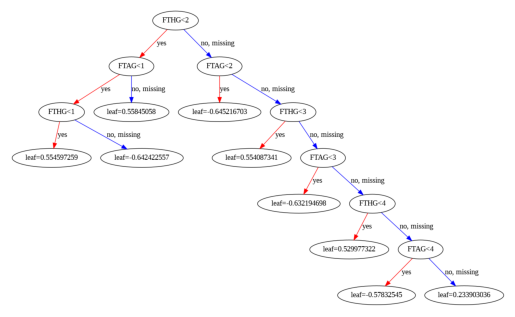

In [185]:
xgb.plot_tree(xgb_cl,num_trees=0)
plt.rcParams['figure.figsize'] = [500, 100]
plt.show()

### Second tree plotted with XGBoost algorithm.

In [186]:
xgb.plot_tree(xgb_cl,num_trees=1)
plt.rcParams['figure.figsize'] = [500, 100]
plt.show()

### Third tree plotted with XGBoost algorithm.

In [187]:
xgb.plot_tree(xgb_cl,num_trees=2)
plt.rcParams['figure.figsize'] = [500, 100]
plt.show()

## Using AutoML to find the best model.

In [188]:
pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


In [189]:
# Import libraries
# Use pip install or conda install if missing a library
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
from h2o.estimators.random_forest import H2ORandomForestEstimator

In [190]:
# Set a minimum memory size and a run time in seconds
min_mem_size=6
run_time=222

In [191]:
# Use 50% of availible resources
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

5


This above code calculates the min_mem_size (minimum memory size) based on a percentage (pct_memory) of the available virtual memory on the system using the psutil library.

In [192]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:51332..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpzq5yvmul
  JVM stdout: /tmp/tmpzq5yvmul/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpzq5yvmul/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:51332
Connecting to H2O server at http://127.0.0.1:51332 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_hwnsae
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


This above code snippet is attempting to start an H2O server with a randomly chosen port number in the range of 5555 to 55555 using the h2o.init function in Python. If an exception occurs during initialization, it logs the error, downloads all logs, shuts down the H2O cluster, and exits the script with a status code of 2.



In [193]:
url = "https://raw.githubusercontent.com/VivekReddy08/INFO6105DataScience/main/Football_Match%20Prediction.csv"
data = h2o.import_file(path = url)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [194]:
data.head()

C1,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,ATGC,HTP,ATP,HM1,HM2,HM3,HM4,HM5,AM1,AM2,AM3,AM4,AM5,MW,HTFormPtsStr,ATFormPtsStr,HTFormPts,ATFormPts,HTWinStreak3,HTWinStreak5,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
0,19/08/00,Charlton,Man City,4,0,H,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19/08/00,Chelsea,West Ham,4,2,H,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19/08/00,Coventry,Middlesbrough,1,3,NH,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19/08/00,Derby,Southampton,2,2,NH,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19/08/00,Leeds,Everton,2,0,H,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,19/08/00,Leicester,Aston Villa,0,0,NH,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,19/08/00,Liverpool,Bradford,1,0,H,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,19/08/00,Sunderland,Arsenal,1,0,H,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,19/08/00,Tottenham,Ipswich,3,1,H,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,20/08/00,Man United,Newcastle,2,0,H,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [195]:
data.types

{'C1': 'int',
 'Date': 'enum',
 'HomeTeam': 'enum',
 'AwayTeam': 'enum',
 'FTHG': 'int',
 'FTAG': 'int',
 'FTR': 'enum',
 'HTGS': 'int',
 'ATGS': 'int',
 'HTGC': 'int',
 'ATGC': 'int',
 'HTP': 'real',
 'ATP': 'real',
 'HM1': 'enum',
 'HM2': 'enum',
 'HM3': 'enum',
 'HM4': 'enum',
 'HM5': 'enum',
 'AM1': 'enum',
 'AM2': 'enum',
 'AM3': 'enum',
 'AM4': 'enum',
 'AM5': 'enum',
 'MW': 'int',
 'HTFormPtsStr': 'enum',
 'ATFormPtsStr': 'enum',
 'HTFormPts': 'int',
 'ATFormPts': 'int',
 'HTWinStreak3': 'int',
 'HTWinStreak5': 'int',
 'HTLossStreak3': 'int',
 'HTLossStreak5': 'int',
 'ATWinStreak3': 'int',
 'ATWinStreak5': 'int',
 'ATLossStreak3': 'int',
 'ATLossStreak5': 'int',
 'HTGD': 'real',
 'ATGD': 'real',
 'DiffPts': 'real',
 'DiffFormPts': 'real'}

In [196]:
data['FTR'] = data['FTR'].asfactor()
print(data['FTR'].isfactor())

[True]


In [197]:
data.describe()

Rows:6840
Cols:40

,C1,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,ATGC,HTP,ATP,HM1,HM2,HM3,HM4,HM5,AM1,AM2,AM3,AM4,AM5,MW,HTFormPtsStr,ATFormPtsStr,HTFormPts,ATFormPts,HTWinStreak3,HTWinStreak5,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
type,int,enum,enum,enum,int,int,enum,int,int,int,int,real,real,enum,enum,enum,enum,enum,enum,enum,enum,enum,enum,int,enum,enum,int,int,int,int,int,int,int,int,int,int,real,real,real,real
mins,0.0,,,,0.0,0.0,,0.0,0.0,0.0,0.0,0.0,0.0,,,,,,,,,,,1.0,,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,-3.3333333333333335,-2.363636363636364,-2.25
mean,3419.5,,,,1.5274853801169586,1.1302631578947366,,24.41666666666666,24.51432748538012,24.497807017543867,24.347514619883032,1.2090137497952782,1.2267682674117641,,,,,,,,,,,19.499999999999986,,,6.242690058479532,6.41359649122807,0.062280701754385964,0.017982456140350878,0.05760233918128655,0.01432748538011696,0.06286549707602339,0.01652046783625731,0.0510233918128655,0.01023391812865497,-0.009689931637936676,0.014538977451303456,-0.01775451761648686,-0.018086116814832878
maxs,6839.0,,,,9.0,7.0,,102.0,105.0,85.0,82.0,2.736842105263158,2.761904761904762,,,,,,,,,,,38.0,,,15.0,15.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,4.0,3.5,2.2857142857142856,2.25
sigma,1974.6822529207072,,,,1.2979131544879186,1.1245662045694267,,17.178524271729763,17.136894081171643,16.401571466982293,16.341557203890012,0.5301863245789216,0.5231764983633135,,,,,,,,,,,10.966657785303955,,,3.582486001590236,3.549761880155801,0.24168234414003137,0.1328972141428824,0.23300696806140028,0.11884558677151143,0.2427386262769929,0.12747516502319245,0.2200615488539626,0.10065121032522105,0.6935927735902433,0.6929372562319596,0.6685233790373746,0.40848786994162056
zeros,1,,,,1596,2364,,263,249,256,265,305,274,,,,,,,,,,,0,,,400,341,6414,6717,6446,6742,6410,6727,6491,6770,464,480,515,840
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0.0,19/08/00,Charlton,Man City,4.0,0.0,H,0.0,0.0,0.0,0.0,0.0,0.0,M,M,M,M,M,M,M,M,M,M,1.0,MMMMM,MMMMM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,19/08/00,Chelsea,West Ham,4.0,2.0,H,0.0,0.0,0.0,0.0,0.0,0.0,M,M,M,M,M,M,M,M,M,M,1.0,MMMMM,MMMMM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,19/08/00,Coventry,Middlesbrough,1.0,3.0,NH,0.0,0.0,0.0,0.0,0.0,0.0,M,M,M,M,M,M,M,M,M,M,1.0,MMMMM,MMMMM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [198]:
data.shape

(6840, 40)

In [199]:
# Create a 80/20 train/test split
pct_rows=0.80
data_train, data_test = data.split_frame([pct_rows])

In [200]:
print(data_train.shape)
print(data_test.shape)

(5535, 40)
(1305, 40)


In [201]:
data_train.head(2)

C1,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,ATGC,HTP,ATP,HM1,HM2,HM3,HM4,HM5,AM1,AM2,AM3,AM4,AM5,MW,HTFormPtsStr,ATFormPtsStr,HTFormPts,ATFormPts,HTWinStreak3,HTWinStreak5,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
2,19/08/00,Coventry,Middlesbrough,1,3,NH,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19/08/00,Derby,Southampton,2,2,NH,0,0,0,0,0,0,M,M,M,M,M,M,M,M,M,M,1,MMMMM,MMMMM,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [202]:
# Set the features and target
X=data.columns
print(X)

['C1', 'Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'FTR', 'HTGS', 'ATGS', 'HTGC', 'ATGC', 'HTP', 'ATP', 'HM1', 'HM2', 'HM3', 'HM4', 'HM5', 'AM1', 'AM2', 'AM3', 'AM4', 'AM5', 'MW', 'HTFormPtsStr', 'ATFormPtsStr', 'HTFormPts', 'ATFormPts', 'HTWinStreak3', 'HTWinStreak5', 'HTLossStreak3', 'HTLossStreak5', 'ATWinStreak3', 'ATWinStreak5', 'ATLossStreak3', 'ATLossStreak5', 'HTGD', 'ATGD', 'DiffPts', 'DiffFormPts']


In [203]:
# Set target and predictor variables
y ='FTR'
#y_numeric ='churn_bit'
X.remove(y)
#X.remove(y_numeric)
print(X)

['C1', 'Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'HTGS', 'ATGS', 'HTGC', 'ATGC', 'HTP', 'ATP', 'HM1', 'HM2', 'HM3', 'HM4', 'HM5', 'AM1', 'AM2', 'AM3', 'AM4', 'AM5', 'MW', 'HTFormPtsStr', 'ATFormPtsStr', 'HTFormPts', 'ATFormPts', 'HTWinStreak3', 'HTWinStreak5', 'HTLossStreak3', 'HTLossStreak5', 'ATWinStreak3', 'ATWinStreak5', 'ATLossStreak3', 'ATLossStreak5', 'HTGD', 'ATGD', 'DiffPts', 'DiffFormPts']


In [204]:
# Set up AutoML
auml = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [205]:
auml.train(x=X,y=y,training_frame=data_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_1_AutoML_1_20240402_210603


GLM Model: summary
    family    link    regularization               lambda_search                                                                    number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  ---------------------------  -------------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  -------------------------------------------------
    binomial  logit   Ridge ( lambda = 0.004335 )  nlambda = 30, lambda.max = 31.554, lambda.min = 0.004335, lambda.1se = 0.004335  2667                          2519                           60                      AutoML_1_20240402_210603_training_py_739_sid_b02a

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.012580316386808349
RMSE: 0.11216200955229158
LogLoss: 0.08483465066205238
AUC: 1.0
AUCPR: 1.0
Gini: 1.0
Null degrees of freedom: 5534
Residual degrees of freedom: 3015
Null deviance: 7640.473903434211
Residual deviance: 939.1195828289199
AIC: 5979.11958282892

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.7217687489491613
       H     NH    Error    Rate
-----  ----  ----  -------  ------------
H      2555  0     0        (0.0/2555.0)
NH     0     2980  0        (0.0/2980.0)
Total  2555  2980  0        (0.0/5535.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.721769     1         195
max f2                       0.721769     1         195
max f0point5                 0.721769     1         195
max accuracy                 0.721769     1         195
max precision                0.999992     1         0
max recall                   0.721769     1         195
max specificity              0.999992     1         0
max absolute_mcc             0.721769     1         195
max min_per_class_accuracy   0.721769     1         195
max mean_per_class_accuracy  0.721769     1         195
max tns                      0.999992     2555      0
max fns                      0.999992     2702      0
max fps                      8.09725e-06  2555      399
max tps                      0.721769     2980      195
max tnr                      0.999992     1         0
max fnr                      0.999992     0.906711  0
max fpr                      8.09725e-06  1         399
max tpr                      0.721769     1         195

Gains/Lift Table: Avg response rate: 53.84 %, avg score: 53.84 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score        cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  -----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0101174                   1                  1.85738   1.85738            1                1            1                           1                   0.0187919       0.0187919                  85.7383   85.7383            0.0187919
2        0.0200542                   0.999991           1.85738   1.85738            1                0.999997     1                           0.999998            0.0184564       0.0372483                  85.7383   85.7383            0.0372483
3        0.0301716                   0.99999            1.85738   1.85738            1                0.99999      1                           0.999996            0.0187919       0.0560403                  85.7383   85.7383            0.0560403

In [206]:
print(auml.leaderboard)

model_id                                                      auc     logloss     aucpr    mean_per_class_error       rmse          mse
GLM_1_AutoML_1_20240402_210603                           1         0.101283    1                     0           0.130951   0.0171482
StackedEnsemble_AllModels_1_AutoML_1_20240402_210603     0.999997  0.003727    0.999997              0.00036348  0.0249833  0.000624163
GBM_1_AutoML_1_20240402_210603                           0.999997  0.00228562  0.999997              0.00036348  0.0236231  0.000558049
StackedEnsemble_BestOfFamily_2_AutoML_1_20240402_210603  0.999997  0.00371971  0.999997              0.00036348  0.0248901  0.000619518
StackedEnsemble_BestOfFamily_1_AutoML_1_20240402_210603  0.999996  0.00374801  0.999997              0.00036348  0.0250457  0.000627286
XGBoost_3_AutoML_1_20240402_210603                       0.999984  0.0424394   0.999986              0.00162171  0.0579328  0.0033562
XGBoost_2_AutoML_1_20240402_210603                  

The print(auml.leaderboard) statement would typically display the leaderboard of models generated by the H2O AutoML process. The leaderboard provides information about each model, such as model ID, model type, performance metrics, and other details.

In [207]:
model_index=0
glm_index=0
glm_model=''
auml_leaderboard_df=auml.leaderboard.as_data_frame()
models_dict={}
for m in auml_leaderboard_df['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break
  model_index=model_index+1

for m in auml_leaderboard_df['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break
  glm_index=glm_index+1
models_dict

{'GLM_1_AutoML_1_20240402_210603': 0}

we're working with H2O's AutoML (auml) in Python. The code we provided in above cell is creating a dictionary (models_dict) where the keys are model IDs and the values are corresponding indices. The indices are determined based on the order of appearance of different types of models in the leaderboard.

Here's a breakdown of the code:

1)model_index and glm_index are initialized to 0.
2)A loop is used to iterate through the model IDs in the AutoML leaderboard (auml_leaderboard_df).
3)For each model ID, the code updates the dictionary (models_dict) with the model ID as the key and the current index (model_index or glm_index) as the value.
4)The loop breaks when it encounters a model ID that does not contain 'StackedEnsemble', and the model_index is incremented.
5)Another loop is used to find the index of the first model ID that contains 'GLM', and the corresponding glm_index is updated.

In [208]:
print(model_index)
best_model = h2o.get_model(auml.leaderboard[model_index,'model_id'])

0


3.Use auto ml to find the best model
Ans: Using AutoML, we have conclude'GLM' as the best model to determine which team to win. By referring the below variable importance and shap summary plots, we can say that 'FTR' is the most important and dominant feature in the model to predict target variable.

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GLM_1_AutoML_1_20240402_210603

,H,NH,Error,Rate
H,2555.0,0.0,0.0,(0.0/2555.0)
NH,0.0,2980.0,0.0,(0.0/2980.0)
Total,2555.0,2980.0,0.0,(0.0/5535.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

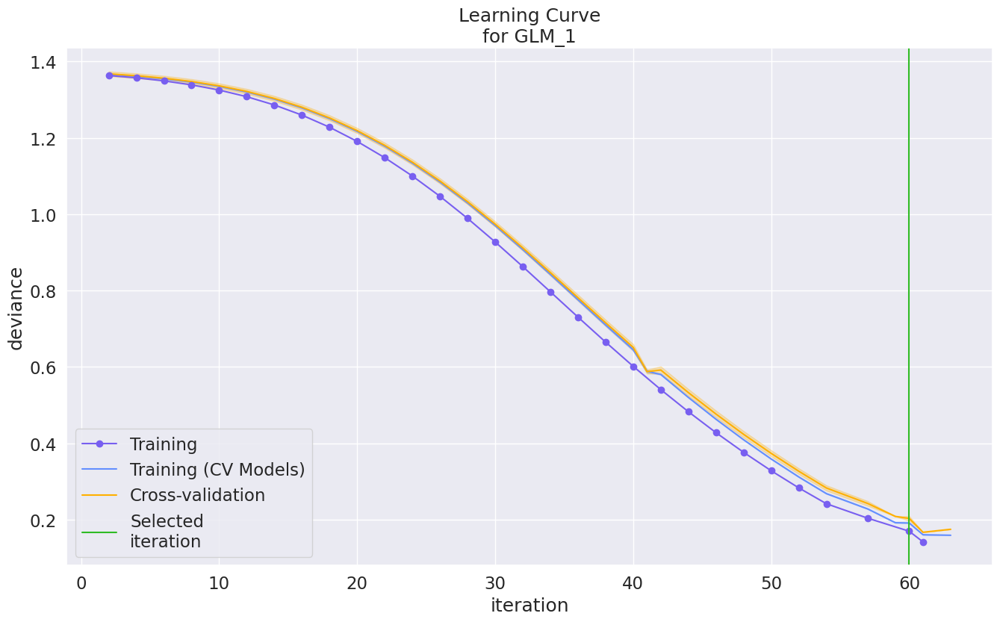

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

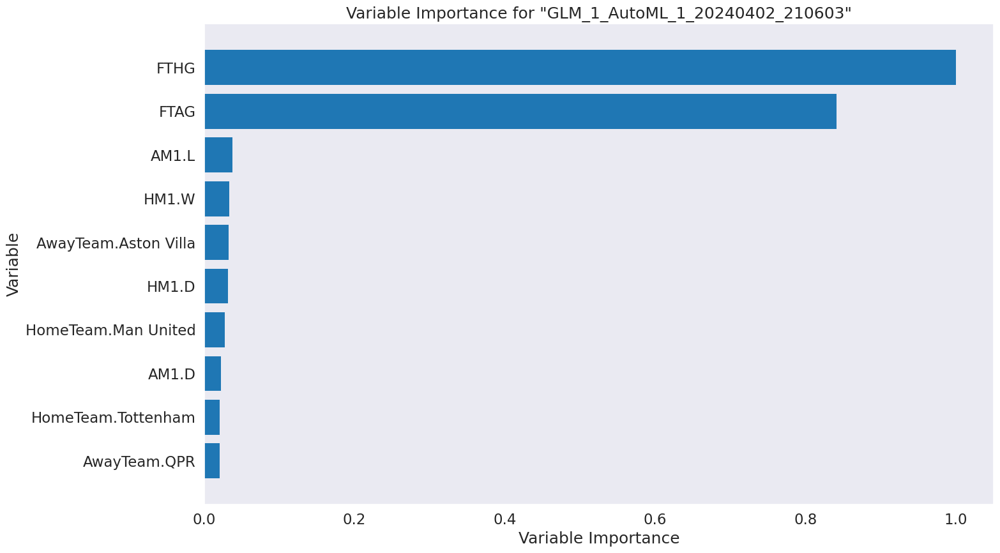

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

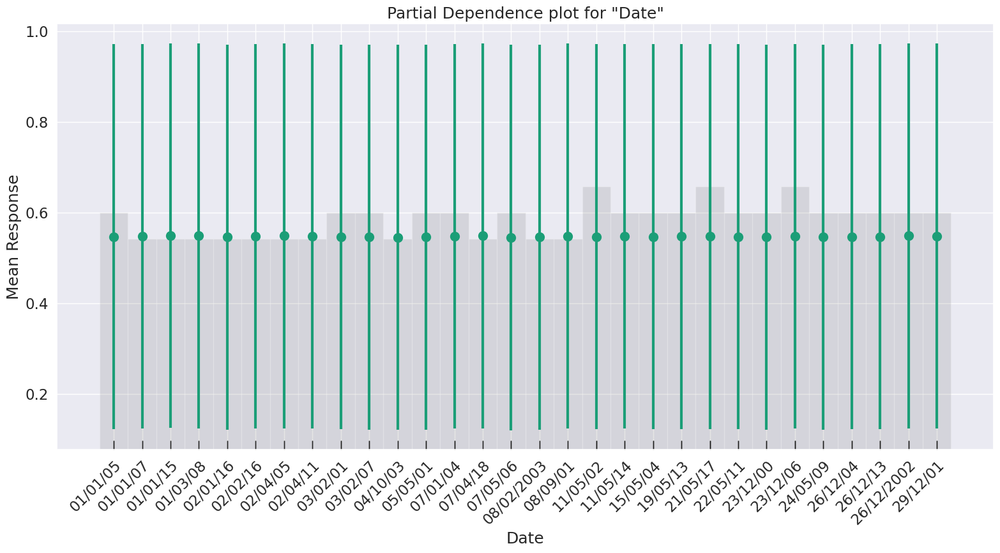

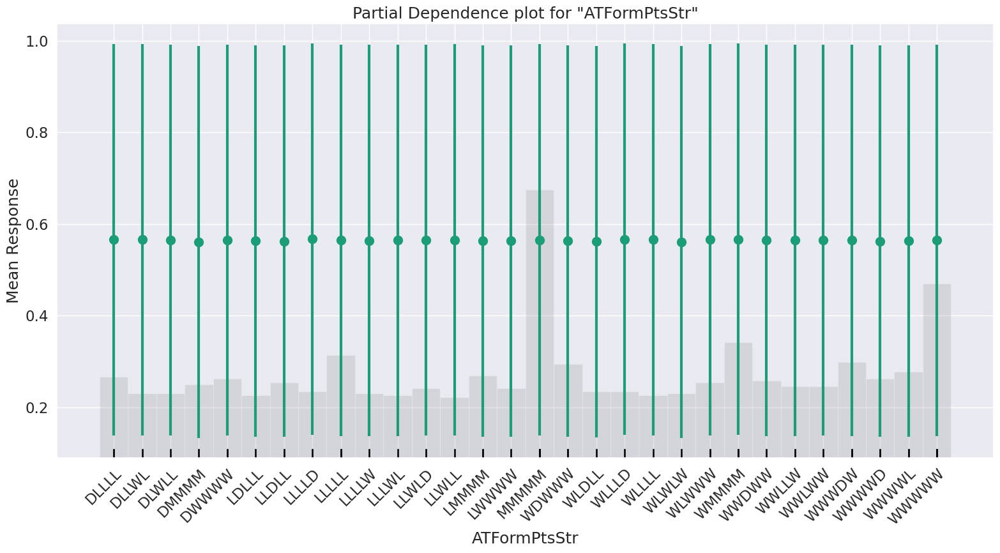

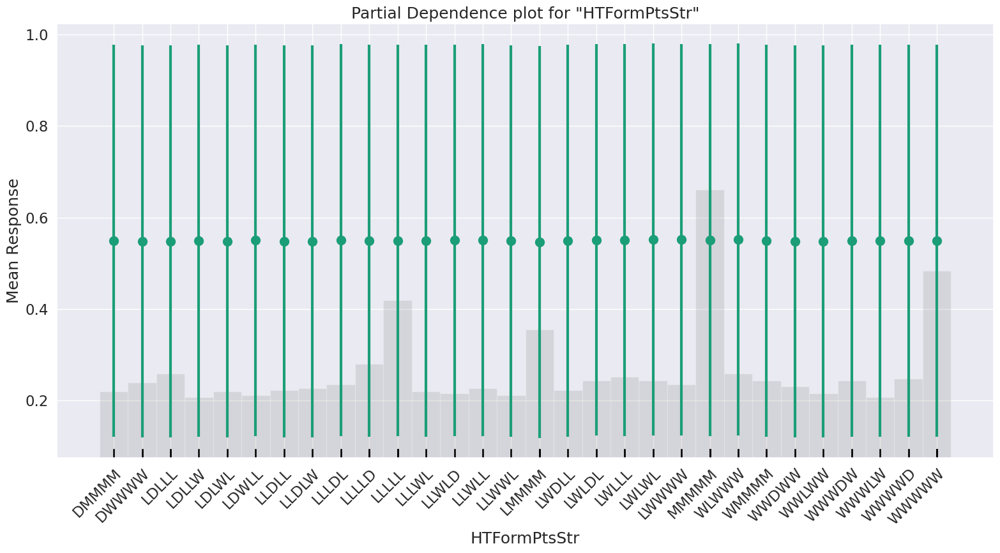

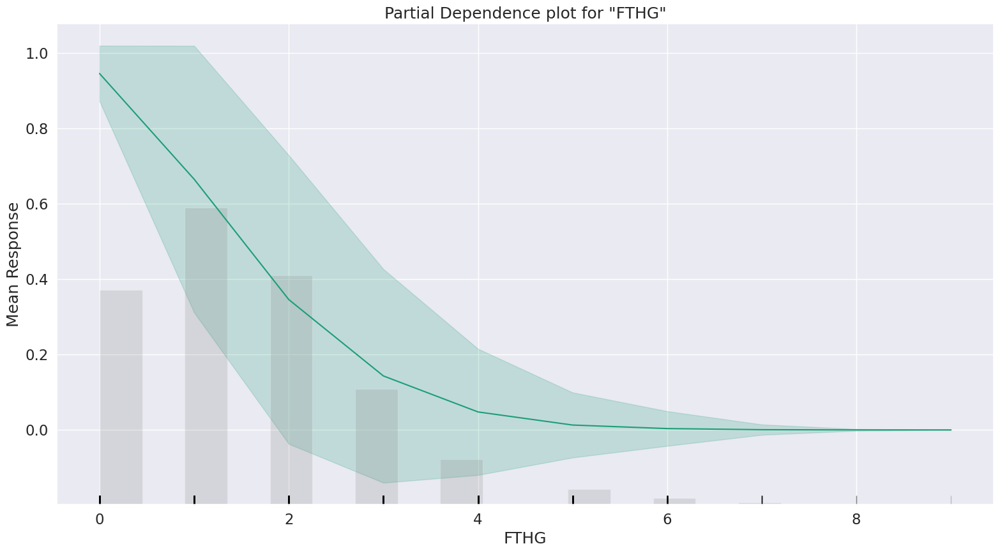

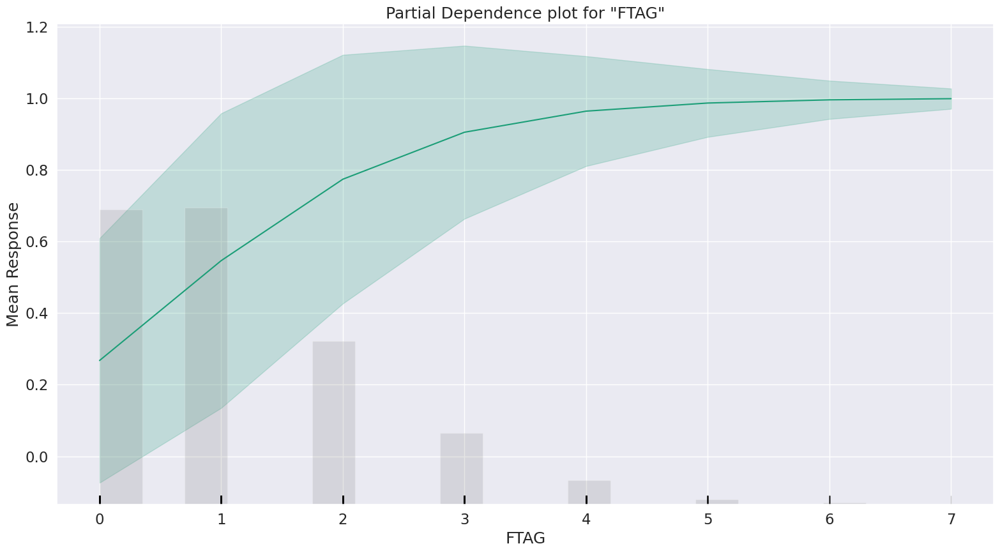

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GLM_1_AutoML_1_20240402_210603

,H,NH,Error,Rate
H,2555.0,0.0,0.0,(0.0/2555.0)
NH,0.0,2980.0,0.0,(0.0/2980.0)
Total,2555.0,2980.0,0.0,(0.0/5535.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

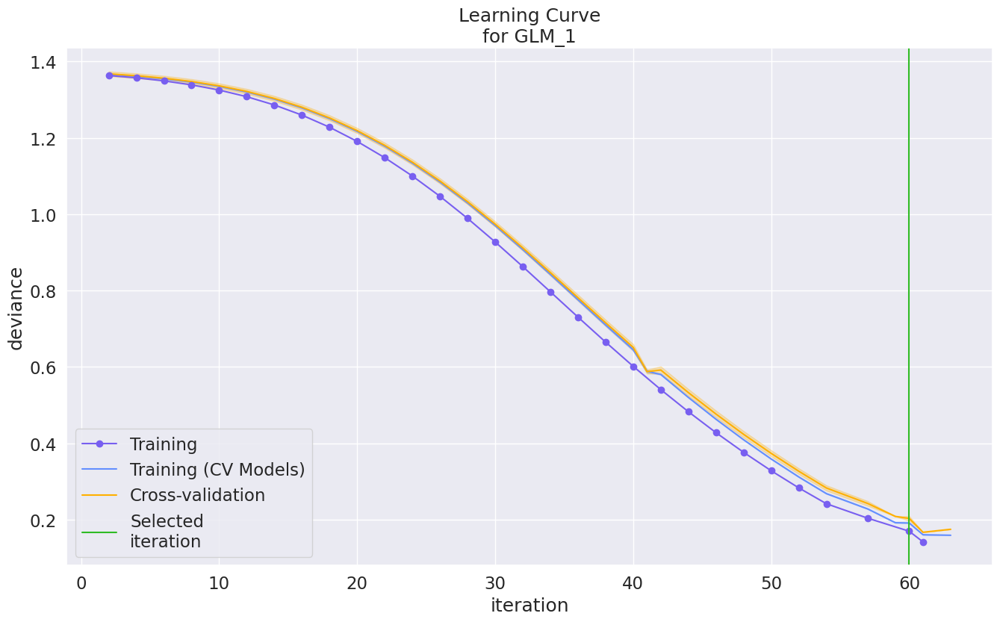

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

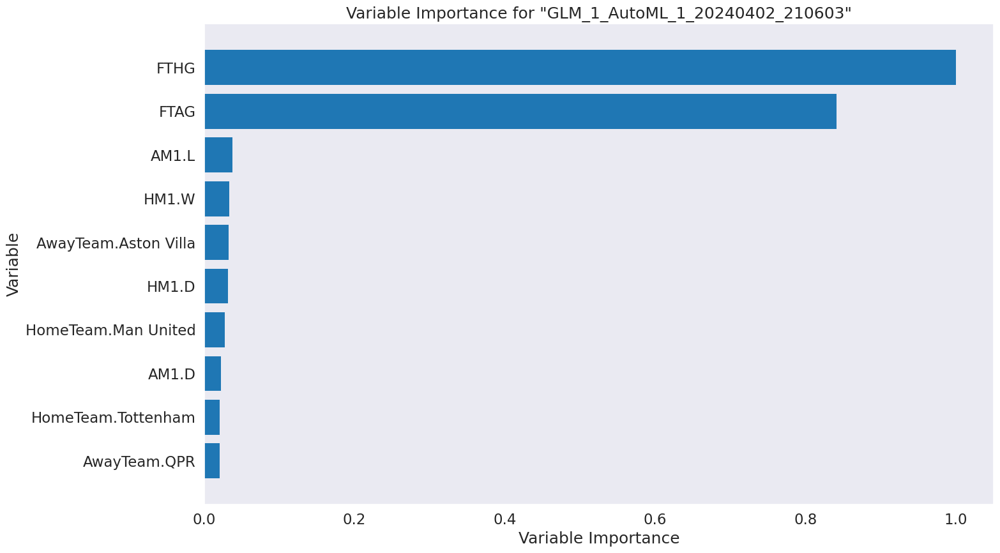

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

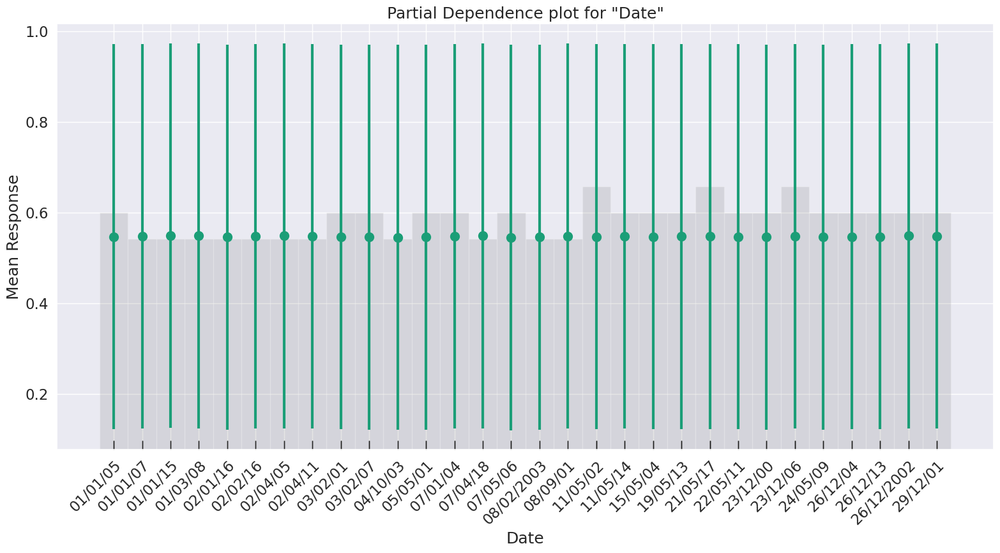

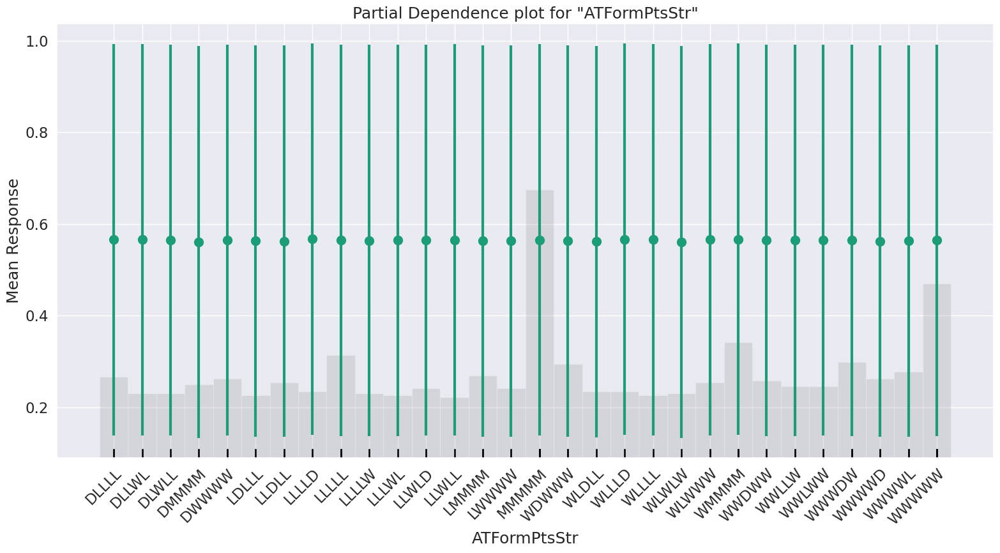

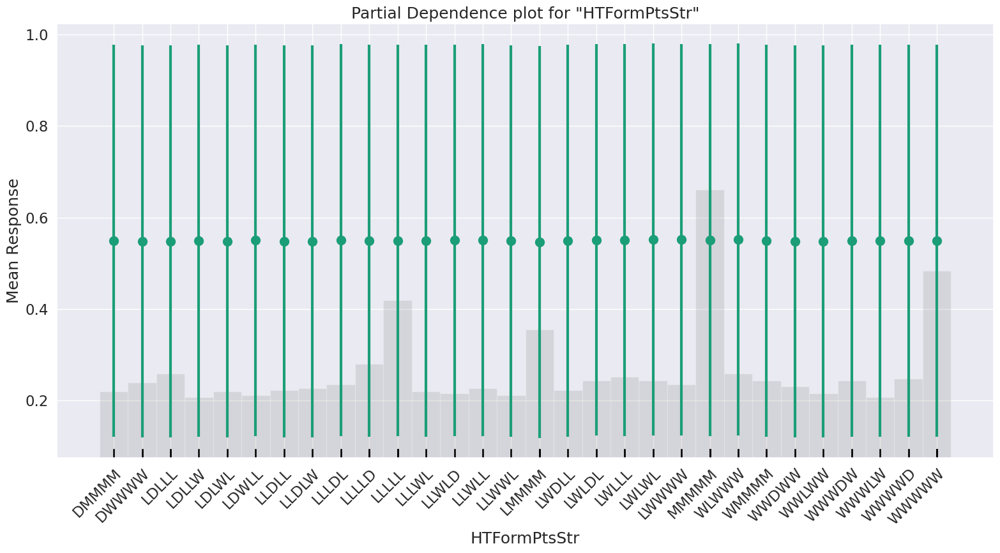

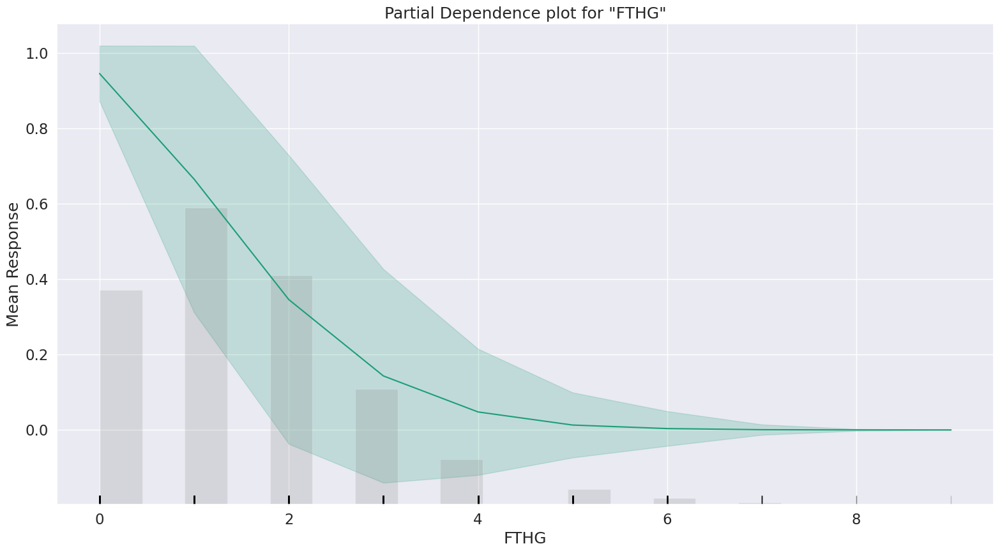

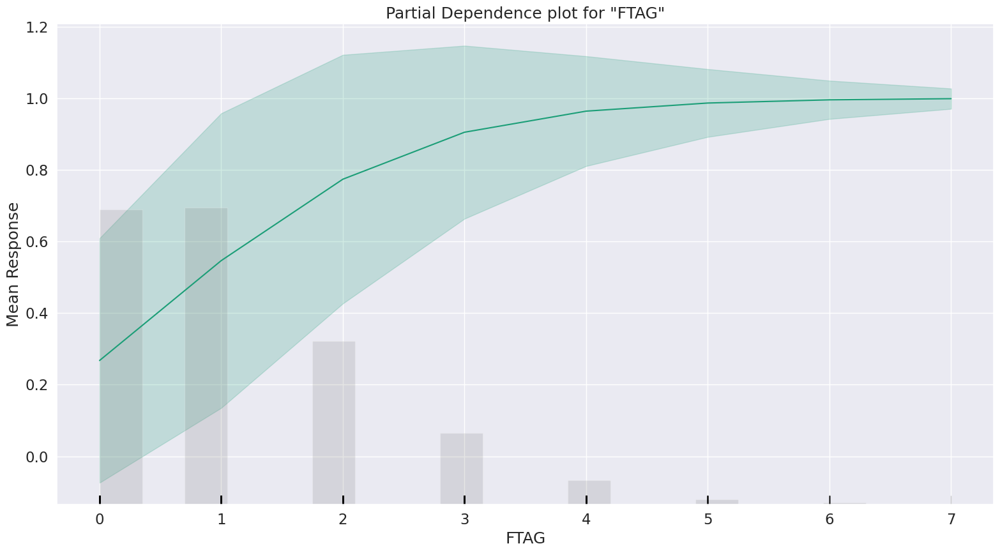

In [209]:
best_model.explain(data_train)

In [210]:
best_model.algo

'glm'

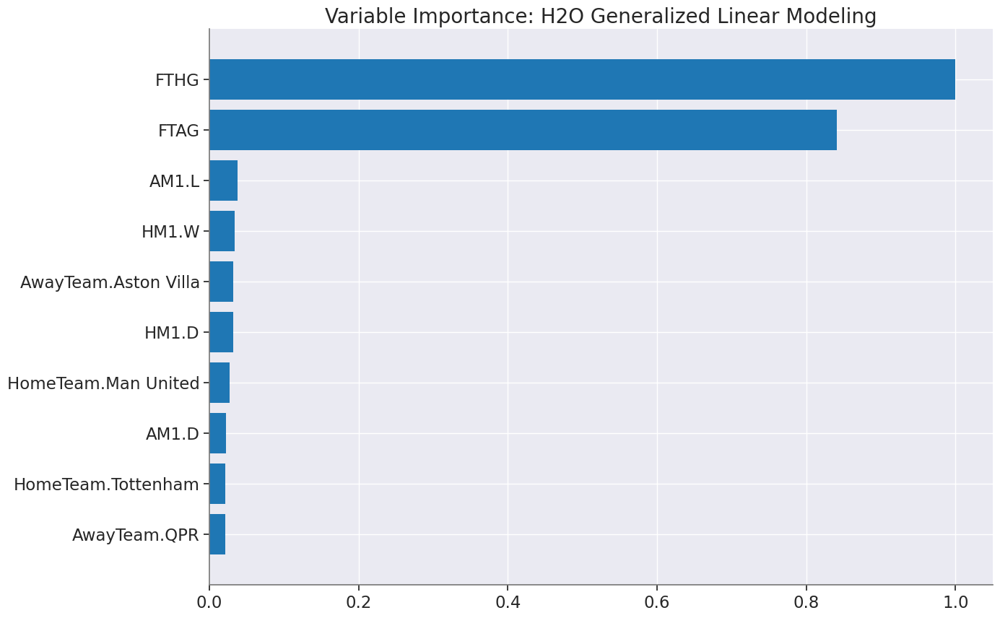

<Figure size 50000x10000 with 0 Axes>

In [211]:
if best_model.algo in ['glm','drf','xrt','xgboost']:
  best_model.varimp_plot()

Above code checks if the algorithm of best_model is one of the specified algorithms. If it is, it calls the varimp_plot() method to generate the variable importance plot.

0
glm


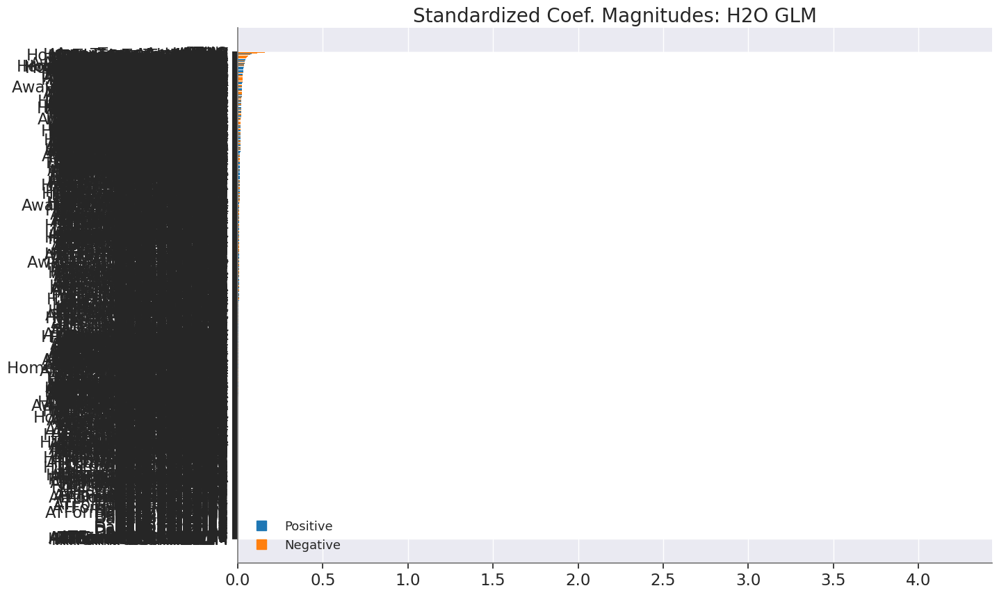

In [212]:
if glm_index == 0:
  print(glm_index)
  glm_model=h2o.get_model(auml.leaderboard[glm_index,'model_id'])
  print(glm_model.algo)
  glm_model.std_coef_plot()

In above cell's code ,We have a conditional block in our code that checks if glm_index is not equal to 0. If this condition is true, it prints the value of glm_index, retrieves an H2O model using the model ID from the leaderboard, prints the algorithm used by the model, and finally, it calls std_coef_plot() on the glm_model.

In [213]:
print(best_model.auc(train = True))

1.0


The above print() command prints the area under curve for the best suitable algorithm ie GLM and area under curve is 100%

In [214]:
def model_performance_stats(perf):
    d={}
    try:
      d['mse']=perf.mse()
    except:
      pass
    try:
      d['rmse']=perf.rmse()
    except:
      pass
    try:
      d['null_degrees_of_freedom']=perf.null_degrees_of_freedom()
    except:
      pass
    try:
      d['residual_degrees_of_freedom']=perf.residual_degrees_of_freedom()
    except:
      pass
    try:
      d['residual_deviance']=perf.residual_deviance()
    except:
      pass
    try:
      d['null_deviance']=perf.null_deviance()
    except:
      pass
    try:
      d['aic']=perf.aic()
    except:
      pass
    try:
      d['logloss']=perf.logloss()
    except:
      pass
    try:
      d['auc']=perf.auc()
    except:
      pass
    try:
      d['gini']=perf.gini()
    except:
      pass
    return d

We've defined a function model_performance_stats(perf) in above cell's code that takes an H2O performance object (perf) and tries to extract various performance metrics from it. The function uses try-except blocks to handle cases where a specific metric may not be available for the given performance object.

This function attempts to calculate various metrics related to model performance and stores them in a dictionary (d). If a specific metric calculation fails , the corresponding except block catches the exception, and the metric is not added to the dictionary.

the success of calculating these metrics depends on the nature of the model and the type of performance object passed to the function. The function is designed to be robust by handling potential exceptions gracefully.

In [215]:
mod_perf=best_model.model_performance(data_test)
stats_test={}
stats_test=model_performance_stats(mod_perf)
stats_test

{'mse': 0.013892671563799102,
 'rmse': 0.11786717763567219,
 'null_degrees_of_freedom': 1304,
 'residual_degrees_of_freedom': -1215,
 'residual_deviance': 233.29717132502543,
 'null_deviance': 1807.1370507911388,
 'aic': 5273.297171325025,
 'logloss': 0.08938588939656147,
 'auc': 1.0,
 'gini': 1.0}

We're using our model_performance_stats function to extract various performance metrics from the performance of the best_model on the test data (data_test). This is a common approach to evaluate and understand the performance of a trained model on new or unseen data.

This will print or display a dictionary (stats_test) containing the computed performance metrics.

## Initialising the shap analysis on the model from step 1,2,3

In [216]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 4.7 MB/s eta 0:00:00


Run SHAP analysis on the models from steps 1, 2, and 3, interpret the SHAP values and compare them with the other model interpretability methods.

Ans:

After running SHAP analysis on model 1 (i.e. Logistic Regression), we have found that 'HTGS' is the top feature in the dataset impacting the model’s output as represented in the beeswarm and summary plots whereas 'HTFormPts' is the least important feature. According to beeswarm plot, higher value of 'HTGS' (2) leads to lower chance of away team winning. Lower value of 'HTGS' (1) leads to higher chance of away team winning.

For model 2 (i.e. XGBoost), 'HTGS' and 'HTFormPts' are the most and least significant features respectively contributing towards prediction of winner. According to summary plot, higher value of 'HTGS' leads to higher chance of home team winning. Lower value of 'HTGS' leads to higher chance of away team winning.

As per model 3 (i.e. GLM), by referring the above shap summary plot, 'HTGS' is the most important and dominant feature in the model to predict target variable which has negative impact on output. Where as, 'HTFormPts' is less important.

So, all 3 algorithms shows almost same results in terms of most and least dominant.



In [217]:
import shap

In [218]:
lg_explainer = shap.Explainer(logreg, x_train)
shap_values_lg = lg_explainer(x_test)

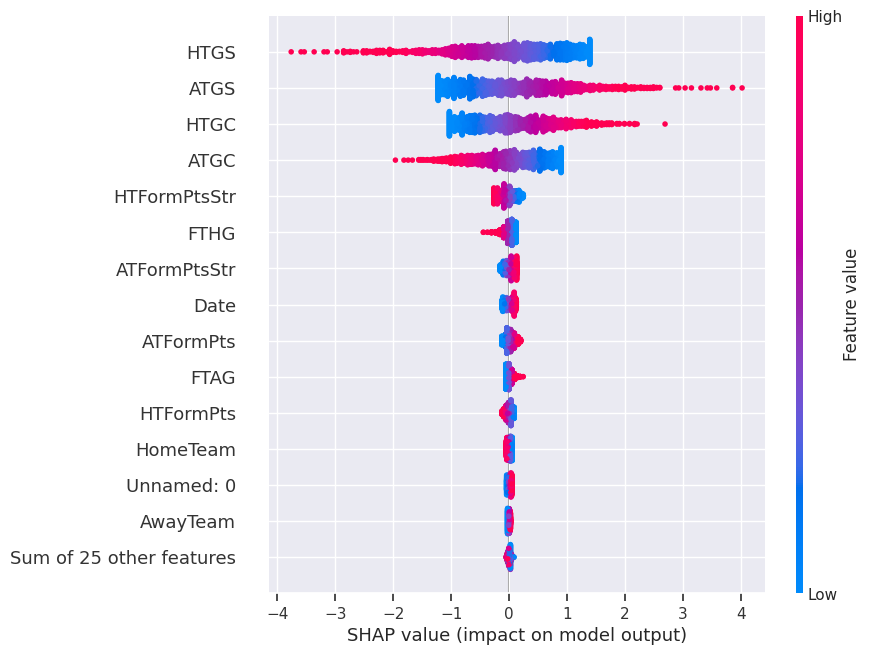

In [219]:
shap.plots.beeswarm(shap_values_lg, max_display=15)

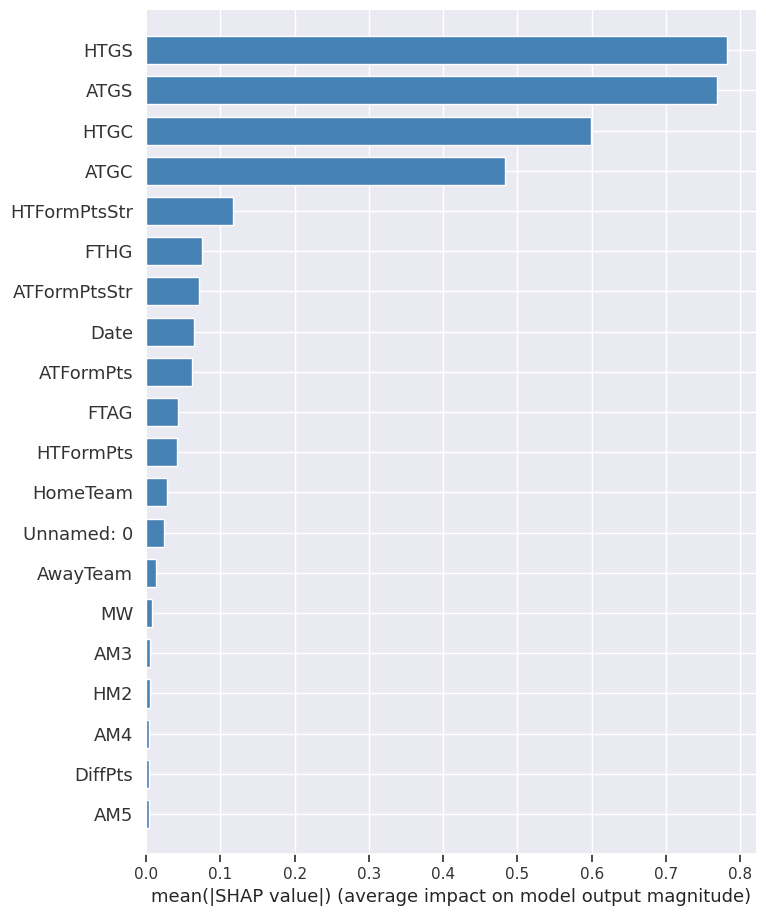

In [220]:
shap.summary_plot(shap_values_lg, x_train, plot_type="bar", color='steelblue')

In [221]:
explainer = shap.TreeExplainer(xgb_cl)
shap_values = explainer.shap_values(x_train,approximate=False, check_additivity=False)

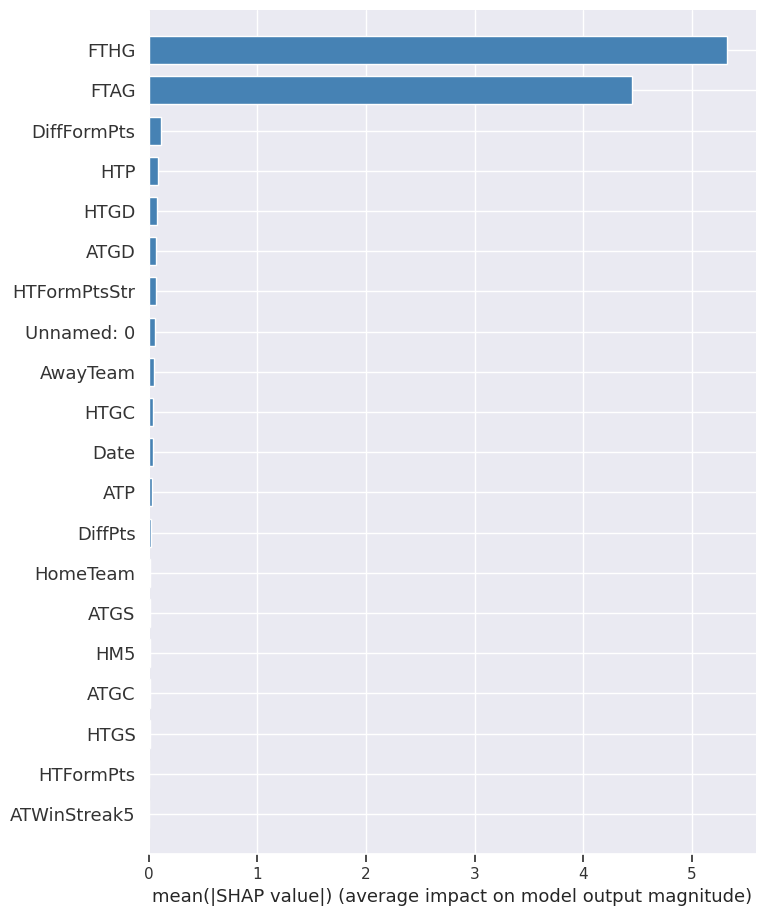

In [222]:
shap.summary_plot(shap_values, x_train, plot_type="bar", color='steelblue')

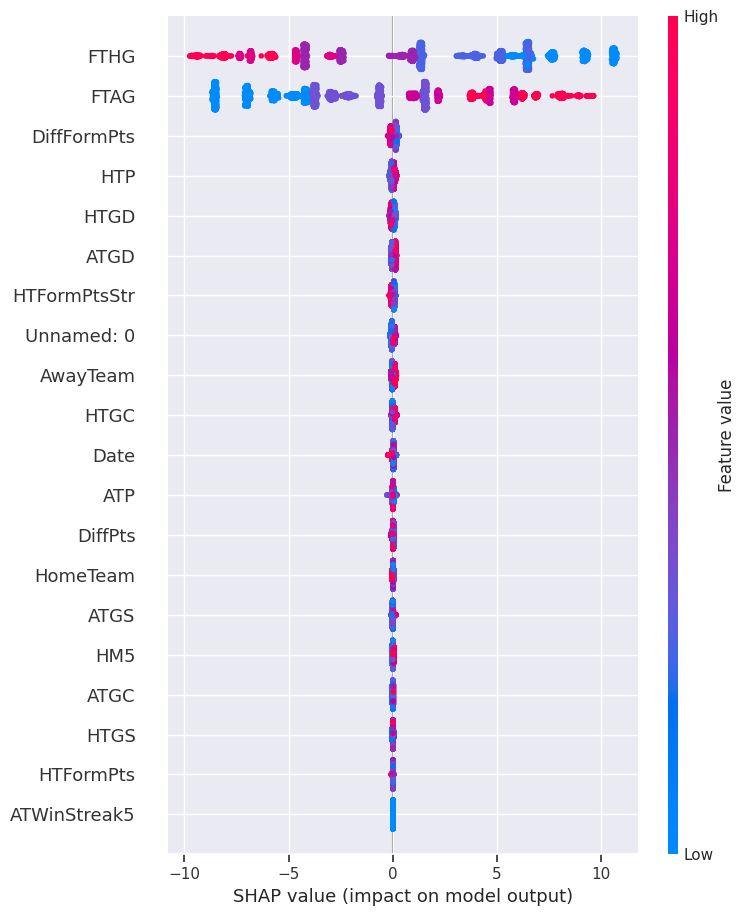

In [223]:
shap.summary_plot(shap_values, x_train)

## Questions and their answers-

1)Fit a linear model and interpret the regression coefficients-

Ans: When the variable ATGS is increased by one unit, the odds of winning the match in the target class ("2") increase by more than 1x (i.e. 1.041) compared to the odds of not winning in the target class. In contrast, as FTHG rises by one unit, the chances of winning in the target class rise by only 0.951082.

2)Fit a tree-based model and interpret the nodes

Ans: The plot below interprets all nodes (root, leaf, and intermediate) and displays the first tree plotted with the XGBoost algorithm. This figure shows how the model arrived at its final decisions and what splits it took to reach those results. As per the below plot, the root node is 'FTHG'. Node interpretability  for for first 3 trees is shown below.

3)Use auto ml to find the best model

Ans: Using AutoML, we have conclude'GLM' as the best model to determine which team to win. By referring the below variable importance and shap summary plots, we can say that 'HTGS' is the most important and dominant feature in the model to predict target variable.

4)Run SHAP analysis on the models from steps 1, 2, and 3, interpret the SHAP values and compare them with the other model interpretability methods.

Ans:After running SHAP analysis on model 1 (i.e. Logistic Regression), we have found that 'HTGS' is the top feature in the dataset impacting the model’s output as represented in the beeswarm and summary plots whereas 'HTFormPts' is the least important feature. According to beeswarm plot, higher value of 'HTGS' (2) leads to lower chance of away team winning. Lower value of 'HTGS' (1) leads to higher chance of away team winning.

For model 2 (i.e. XGBoost), 'HTGS' and 'HTFormPts' are the most and least significant features respectively contributing towards prediction of winner. According to summary plot, higher value of 'HTGS' leads to higher chance of home team winning. Lower value of 'HTGS' leads to higher chance of away team winning.

As per model 3 (i.e. GLM), by referring the above shap summary plot, 'HTGS' is the most important and dominant feature in the model to predict target variable which has negative impact on output. Where as, 'HTFormPts' is less important.

So, all 3 algorithms shows almost same results in terms of most and least dominant.






### Conclusion

Build a predictive model using Logistic regression, XGBoost, AutoML to predict whether a patient has diabetes based on a set of risk factors. Model interpretability was tested using shap analysis by plotting beeswarm and shap summary plots to compare all three models. We discovered that all three algorithms produce distinct outcomes, and that regularization can be used to improve the models.

MIT License

Copyright (c) 2024 VivekReddy08

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.


### References
1)https://towardsdatascience.com/interpreting-coefficients-in-linear-and-logistic-regression-6ddf1295f6f1

2)https://towardsdatascience.com/decision-trees-explained-3ec41632ceb6

3)https://www.analyticsvidhya.com/blog/2020/05/decision-tree-vs-random-forest-algorithm/

4)https://www.analyticsvidhya.com/blog/2020/10/all-about-decision-tree-from-scratch-with-python-implementation/

5)https://www.kdnuggets.com/2020/04/visualizing-decision-trees-python.html

6)https://www.datacamp.com/community/tutorials/xgboost-in-python

7)https://github.com/MayurAvinash/DESM_INFO6105/blob/main/Model_Interpretability_Assignment.ipynb

